<a href="https://colab.research.google.com/github/steviev93/ISLP/blob/main/Introduction_to_Statistical_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installs/Imports

In [1]:
pip install ISLP

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 350.7/350.7 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.2/522.2 kB 25.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 776.9/776.9 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 805.2/805.2 kB 31.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.0/91.0 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 36.5 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4030 sha256=ea2bfd558a18c352bfa849b4158e53695b01e2bd8e974feb9c1d7ed3e506aa03
  Stored in directory: /root/.cache/pip/wheels/25/cc/e0/ef2969164144c899fedb22b338f6703e2b9cf46eeebf254991
Successfully built autograd-gamma
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    U

In [1]:
from ISLP import load_data
import numpy as np
import pandas as pd
from matplotlib.pyplot import subplots
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.stats.outliers_influence \
import variance_inflation_factor as VIF
from statsmodels.stats.anova import anova_lm
from ISLP.models import (ModelSpec as MS,
summarize,
poly)

# Chapter 2

In [ ]:
# 8.
import pandas as pd

dfOrig = pd.read_csv('College.csv')
df = dfOrig.rename({'Unnamed: 0': 'College'}, axis=1)
df = df.set_index('College')
print(df.columns)
print(df.head())

Index(['Private', 'Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc',
       'F.Undergrad', 'P.Undergrad', 'Outstate', 'Room.Board', 'Books',
       'Personal', 'PhD', 'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend',
       'Grad.Rate'],
      dtype='object')
                             Private  Apps  Accept  Enroll  Top10perc  \
College                                                                 
Abilene Christian University     Yes  1660    1232     721         23   
Adelphi University               Yes  2186    1924     512         16   
Adrian College                   Yes  1428    1097     336         22   
Agnes Scott College              Yes   417     349     137         60   
Alaska Pacific University        Yes   193     146      55         16   

                              Top25perc  F.Undergrad  P.Undergrad  Outstate  \
College                                                                       
Abilene Christian University         52         2885          537  

In [ ]:
print(df.describe())

               Apps        Accept       Enroll   Top10perc   Top25perc  \
count    777.000000    777.000000   777.000000  777.000000  777.000000   
mean    3001.638353   2018.804376   779.972973   27.558559   55.796654   
std     3870.201484   2451.113971   929.176190   17.640364   19.804778   
min       81.000000     72.000000    35.000000    1.000000    9.000000   
25%      776.000000    604.000000   242.000000   15.000000   41.000000   
50%     1558.000000   1110.000000   434.000000   23.000000   54.000000   
75%     3624.000000   2424.000000   902.000000   35.000000   69.000000   
max    48094.000000  26330.000000  6392.000000   96.000000  100.000000   

        F.Undergrad   P.Undergrad      Outstate   Room.Board        Books  \
count    777.000000    777.000000    777.000000   777.000000   777.000000   
mean    3699.907336    855.298584  10440.669241  4357.526384   549.380952   
std     4850.420531   1522.431887   4023.016484  1096.696416   165.105360   
min      139.000000      

array([[<Axes: xlabel='Top10perc', ylabel='Top10perc'>,
        <Axes: xlabel='Apps', ylabel='Top10perc'>,
        <Axes: xlabel='Enroll', ylabel='Top10perc'>],
       [<Axes: xlabel='Top10perc', ylabel='Apps'>,
        <Axes: xlabel='Apps', ylabel='Apps'>,
        <Axes: xlabel='Enroll', ylabel='Apps'>],
       [<Axes: xlabel='Top10perc', ylabel='Enroll'>,
        <Axes: xlabel='Apps', ylabel='Enroll'>,
        <Axes: xlabel='Enroll', ylabel='Enroll'>]], dtype=object)

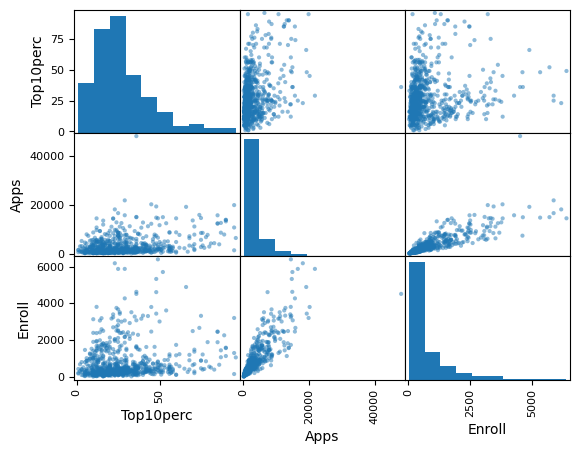

In [ ]:
C = ['Top10perc', 'Apps', 'Enroll']
pd.plotting.scatter_matrix(df[C])

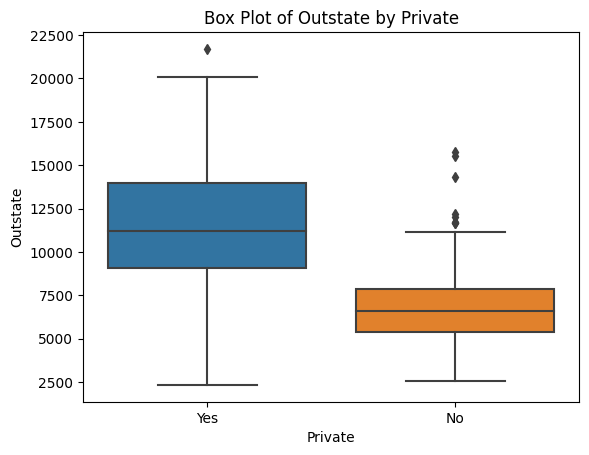

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(x='Private', y='Outstate', data=df)
plt.xlabel('Private')
plt.ylabel('Outstate')
plt.title('Box Plot of Outstate by Private')
plt.show()


In [ ]:
df['Elite'] = pd.cut(df['Top10perc'],[0,50,100],labels=['No', 'Yes'])

In [ ]:
df['Elite'].value_counts()

No     699
Yes     78
Name: Elite, dtype: int64

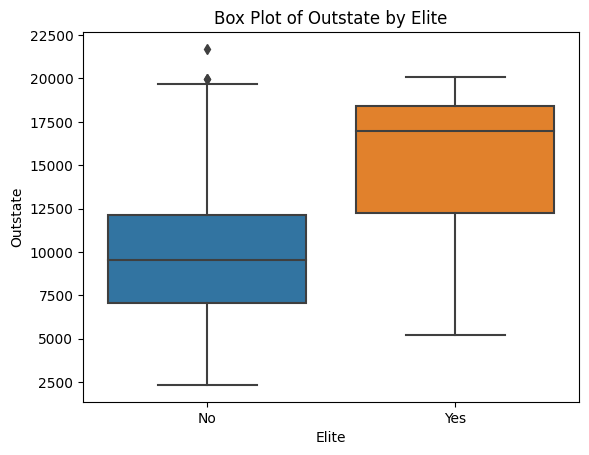

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(x='Elite', y='Outstate', data=df)
plt.xlabel('Elite')
plt.ylabel('Outstate')
plt.title('Box Plot of Outstate by Elite')
plt.show()


array([[<Axes: title={'center': 'Accept'}>,
        <Axes: title={'center': 'Enroll'}>],
       [<Axes: title={'center': 'Room.Board'}>,
        <Axes: title={'center': 'Expend'}>]], dtype=object)

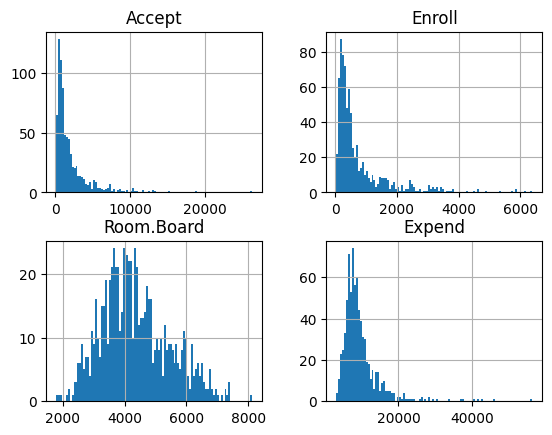

In [ ]:
fig, ax = plt.subplots(2, 2)
df.hist(['Accept', 'Enroll', 'Room.Board', 'Expend'], bins=100, ax=ax)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

df['Elite'] = df['Elite'].map({'Yes': 1, 'No': 0})
df['Private'] = df['Private'].map({'Yes': 1, 'No': 0})
X = df.drop('Elite', axis=1)
y = df['Elite']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=df['Elite'])
model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
confMat = confusion_matrix(y_test, y_pred)
print(confMat)
print(classification_report(y_test, y_pred))

[[136   4]
 [  4  12]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       140
           1       0.75      0.75      0.75        16

    accuracy                           0.95       156
   macro avg       0.86      0.86      0.86       156
weighted avg       0.95      0.95      0.95       156



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
x_values = np.linspace(-5, 5, 100)  # Adjust the range and number of points as needed

# Compute y-values using the function/model
y_values = [model.predict(x) for x in x_values]

# Create a DataFrame
predLine = pd.DataFrame({'x': x_values, 'y': y_values})

import plotly.express as px

fig = px.scatter_3d(X_train, x=X_train.columns[9], y=X_train.columns[3], z=X_train.columns[6], color=y_train, labels={X_train.columns[9]: f'{X_train.columns[9]}', X_train.columns[3]: f'{X_train.columns[3]}', X_train.columns[6]: f'{X_train.columns[6]}'})
fig.update_layout(scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'))
fig.update_layout(title='3D Scatter Plot')
fig.show()


In [ ]:
df['Elite']

College
Abilene Christian University       No
Adelphi University                 No
Adrian College                     No
Agnes Scott College               Yes
Alaska Pacific University          No
                                 ... 
Worcester State College            No
Xavier University                  No
Xavier University of Louisiana     No
Yale University                   Yes
York College of Pennsylvania       No
Name: Elite, Length: 777, dtype: category
Categories (2, object): ['No' < 'Yes']

In [ ]:
from ISLP import load_data
Boston = load_data('Boston')
Boston.columns
Boston.shape

(506, 13)

In [ ]:
Boston.describe()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,lstat,medv
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,37.970000,50.000000


In [ ]:
Boston.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,5.33,36.2


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

pd.plotting.scatter_matrix(Boston[Boston.columns], figsize=(100,100))

In [ ]:
print(Boston[Boston['crim'] == max(Boston['crim'])])
print("crim range: ", min(Boston['crim']), "-", max(Boston['crim']))
print(Boston[Boston['tax'] == max(Boston['tax'])])
print("tax range: ",min(Boston['tax']), "-", max(Boston['tax']))


        crim   zn  indus  chas    nox     rm   age     dis  rad  tax  ptratio  \
380  88.9762  0.0   18.1     0  0.671  6.968  91.9  1.4165   24  666     20.2   

     lstat  medv  
380  17.21  10.4  
crim range:  0.00632 - 88.9762
        crim   zn  indus  chas    nox     rm   age     dis  rad  tax  ptratio  \
488  0.15086  0.0  27.74     0  0.609  5.454  92.7  1.8209    4  711     20.1   
489  0.18337  0.0  27.74     0  0.609  5.414  98.3  1.7554    4  711     20.1   
490  0.20746  0.0  27.74     0  0.609  5.093  98.0  1.8226    4  711     20.1   
491  0.10574  0.0  27.74     0  0.609  5.983  98.8  1.8681    4  711     20.1   
492  0.11132  0.0  27.74     0  0.609  5.983  83.5  2.1099    4  711     20.1   

     lstat  medv  
488  18.06  15.2  
489  23.97   7.0  
490  29.68   8.1  
491  18.07  13.6  
492  13.35  20.1  
tax range:  187 - 711


In [ ]:
Boston['chas'].value_counts()

0    471
1     35
Name: chas, dtype: int64

In [ ]:
Boston['ptratio'].median()

19.05

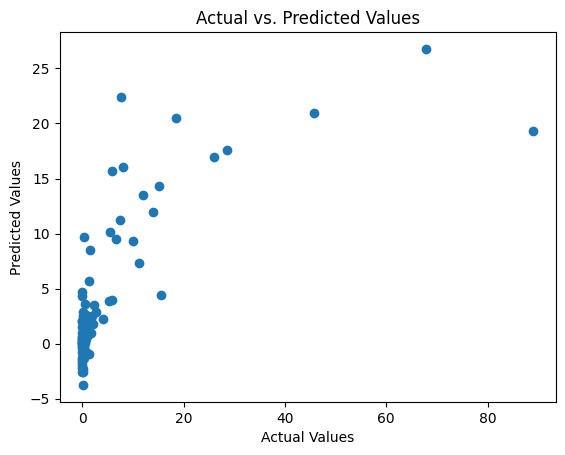

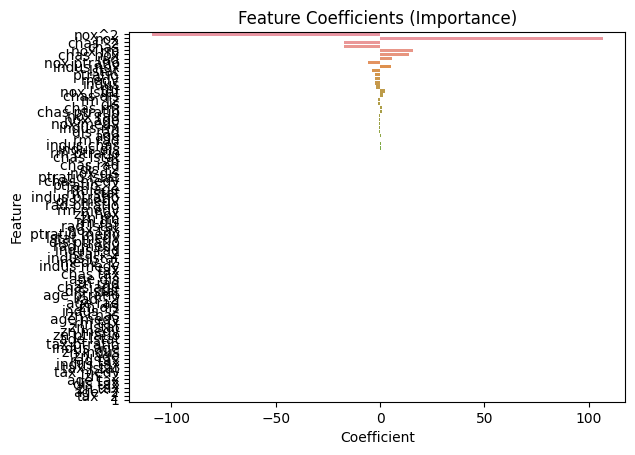

<Figure size 100000x100000 with 0 Axes>

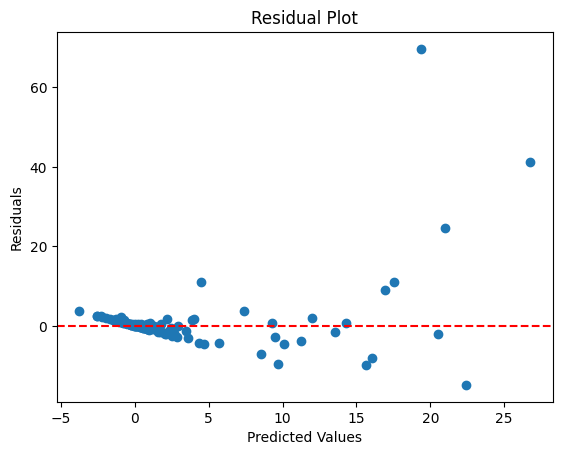

In [ ]:
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import seaborn as sns

X = Boston.drop('crim', axis=1)
y = Boston['crim']
degree = 2  # Maximum polynomial degree
poly_features = PolynomialFeatures(degree=degree, interaction_only=false)
X_poly = poly_features.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2)
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values")
plt.show()
coefficients = model.coef_
from sklearn.metrics import r2_score

r2 = r2_score(y_test, y_pred)
feature_coefficients = model.coef_
feature_names = poly_features.get_feature_names_out(X.columns)
# Create a DataFrame to associate feature names with coefficients
coefficients_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': feature_coefficients})

# Sort by absolute value of coefficients in descending order
coefficients_df['Abs_Coefficient'] = abs(coefficients_df['Coefficient'])
coefficients_df = coefficients_df.sort_values(by='Abs_Coefficient', ascending=False)

# Visualize the feature coefficients
sns.barplot(x='Coefficient', y='Feature', data=coefficients_df)
plt.title('Feature Coefficients (Importance)')
plt.figure(figsize=(1000,1000))
plt.show()

residuals = y_test - y_pred

plt.scatter(y_pred, residuals)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.axhline(y=0, color='r', linestyle='--')
plt.title("Residual Plot")
plt.show()


In [ ]:
correlation_matrix = np.corrcoef(y_test, y_pred)
correlation_coefficient = correlation_matrix[0, 1]


In [ ]:
print(correlation_coefficient)

0.7431868669128838


In [ ]:
X_poly.shape

(506, 91)

CHAPTER 3

# Chapter 3

In [ ]:
import pandas as pd

dfOrig = pd.read_csv('Advertising.csv')


In [ ]:
df = dfOrig
df.head()

,Unnamed: 0,TV,radio,newspaper,sales
0,1,230.1,37.8,69.2,22.1
1,2,44.5,39.3,45.1,10.4
2,3,17.2,45.9,69.3,9.3
3,4,151.5,41.3,58.5,18.5
4,5,180.8,10.8,58.4,12.9


In [ ]:
for column in df.columns:
  correlation_matrix = np.corrcoef(df[column], df['sales'])
  print(column)
  print(correlation_matrix)

Unnamed: 0
[[ 1.         -0.05161625]
 [-0.05161625  1.        ]]
TV
[[1.         0.78222442]
 [0.78222442 1.        ]]
radio
[[1.         0.57622257]
 [0.57622257 1.        ]]
newspaper
[[1.         0.22829903]
 [0.22829903 1.        ]]
sales
[[1. 1.]
 [1. 1.]]


In [ ]:
pd.plotting.scatter_matrix(df[df.columns], figsize=(100,100))

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
X = df['TV']
y = df['sales']
model = LinearRegression()
model.fit(X, y.reshape(-1, 1))
y_pred = model.predict(X)

# Calculate the RSS (mean squared error)
mse = mean_squared_error(y, y_pred)
rss = mse * len(y)



AttributeError: ignored

ValueError: ignored

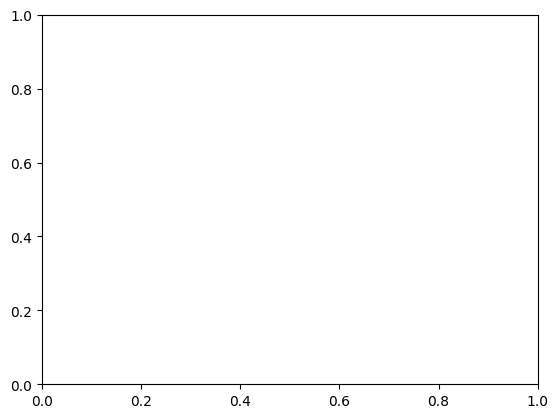

In [ ]:
plt.scatter(X, y, label='Actual Data', color='blue')

# Plot the regression line
plt.plot(X, y_pred, color='red', linewidth=2, label='Regression Line')

# Add labels and legend
plt.xlabel('TV Spending')
plt.ylabel('Sales')
plt.legend()

# Show the plot
plt.show()


In [ ]:
import plotly.express as px

fig = px.scatter_3d(X, x=X.columns[9], y=X.columns[3], z=X.columns[6], color=y_train, labels={X_train.columns[9]: f'{X_train.columns[9]}', X_train.columns[3]: f'{X_train.columns[3]}', X_train.columns[6]: f'{X_train.columns[6]}'})
fig.update_layout(scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'))
fig.update_layout(title='3D Scatter Plot')
fig.show()


AttributeError: ignored

# 3.6 Lab

In [ ]:
dir()

['In',
 'MS',
 'Out',
 'VIF',
 '_',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_dh',
 '_exit_code',
 '_i',
 '_i1',
 '_i2',
 '_i3',
 '_i4',
 '_i5',
 '_ih',
 '_ii',
 '_iii',
 '_oh',
 'anova_lm',
 'exit',
 'get_ipython',
 'load_data',
 'np',
 'pd',
 'poly',
 'quit',
 'sm',
 'subplots',
 'summarize']

In [ ]:
Boston = load_data("Boston")
Boston.columns

Index(['crim', 'zn', 'indus', 'chas', 'nox', 'rm', 'age', 'dis', 'rad', 'tax',
       'ptratio', 'lstat', 'medv'],
      dtype='object')

In [ ]:
X = pd.DataFrame({'intercept': np.ones(Boston.shape[0]),
'lstat': Boston['lstat']})
X[:4]


,intercept,lstat
0,1.0,4.98
1,1.0,9.14
2,1.0,4.03
3,1.0,2.94


In [ ]:
y = Boston['medv']
model = sm.OLS(y, X)
results = model.fit()

In [ ]:
summarize(results)

,coef,std err,t,P>|t|
intercept,34.5538,0.563,61.415,0.0
lstat,-0.9500,0.039,-24.528,0.0


In [ ]:
design = MS(['lstat'])
design = design.fit(Boston)
X = design.transform(Boston)
X[:4]

,intercept,lstat
0,1.0,4.98
1,1.0,9.14
2,1.0,4.03
3,1.0,2.94


In [ ]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   medv   R-squared:                       0.544
Model:                            OLS   Adj. R-squared:                  0.543
Method:                 Least Squares   F-statistic:                     601.6
Date:                Thu, 19 Oct 2023   Prob (F-statistic):           5.08e-88
Time:                        04:40:41   Log-Likelihood:                -1641.5
No. Observations:                 506   AIC:                             3287.
Df Residuals:                     504   BIC:                             3295.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     34.5538      0.563     61.415      0.000      33.448      35.659
lstat         -0.9500      0.039    -24.528      0.000      -1.026      -0.874
==============================================================================
Omnibus:                      137.043   Durbin-Watson:                   0.892
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              291.373
Skew:                           1.453   Prob(JB):                     5.36e-64
Kurtosis:                       5.319   Cond. No.                         29.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
new_df = pd.DataFrame({'lstat':[5, 10, 15]})
newX = design.transform(new_df)
newX


,intercept,lstat
0,1.0,5
1,1.0,10
2,1.0,15


In [ ]:
new_predictions = results.get_prediction(newX);
new_predictions.predicted_mean


array([29.80359411, 25.05334734, 20.30310057])

374

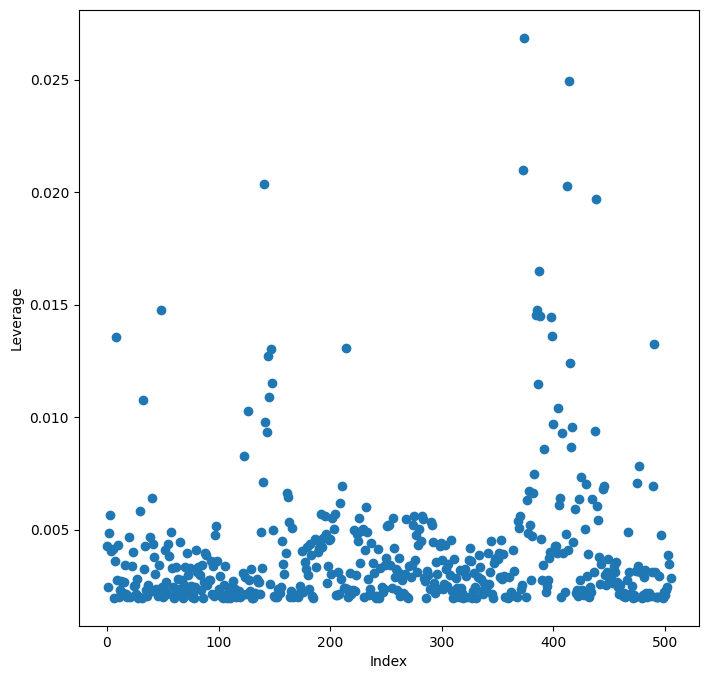

In [ ]:
infl = results.get_influence()
ax = subplots(figsize=(8,8))[1]
ax.scatter(np.arange(X.shape[0]), infl.hat_matrix_diag)
ax.set_xlabel('Index')
ax.set_ylabel('Leverage')
np.argmax(infl.hat_matrix_diag)

In [ ]:
X = MS(['lstat', 'age']).fit_transform(Boston)
model1 = sm.OLS(y, X)
results1 = model1.fit()
summarize(results1)


,coef,std err,t,P>|t|
intercept,33.2228,0.731,45.458,0.000
lstat,-1.0321,0.048,-21.416,0.000
age,0.0345,0.012,2.826,0.005


In [ ]:
terms = Boston.columns.drop('medv')
X = MS(terms).fit_transform(Boston)
model = sm.OLS(y, X)
results = model.fit()
summarize(results)

,coef,std err,t,P>|t|
intercept,41.6173,4.936,8.431,0.000
crim,-0.1214,0.033,-3.678,0.000
zn,0.0470,0.014,3.384,0.001
indus,0.0135,0.062,0.217,0.829
chas,2.8400,0.870,3.264,0.001
nox,-18.7580,3.851,-4.870,0.000
rm,3.6581,0.420,8.705,0.000
age,0.0036,0.013,0.271,0.787
dis,-1.4908,0.202,-7.394,0.000
rad,0.2894,0.067,4.325,0.000


In [ ]:
X = MS([poly('lstat', degree=2), 'age']).fit_transform(Boston)
model3 = sm.OLS(y, X)
results3 = model3.fit()
summarize(results3)

,coef,std err,t,P>|t|
intercept,17.7151,0.781,22.681,0.0
"poly(lstat, degree=2)[0]",-179.2279,6.733,-26.620,0.0
"poly(lstat, degree=2)[1]",72.9908,5.482,13.315,0.0
age,0.0703,0.011,6.471,0.0


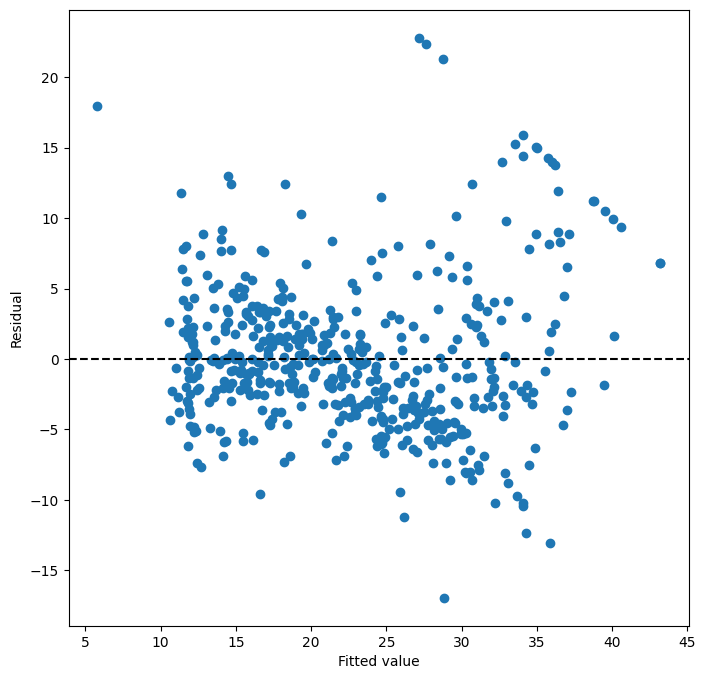

In [ ]:
ax = subplots(figsize=(8,8))[1]
ax.scatter(results3.fittedvalues , results3.resid)
ax.set_xlabel('Fitted value')
ax.set_ylabel('Residual')
ax.axhline(0, c='k', ls='--')

# Chapter 3 Practice Problems

In [ ]:
# 8.
Auto = load_data("Auto")

In [ ]:
X = pd.DataFrame({'intercept': np.ones(Auto.shape[0]),
'horsepower': Auto['horsepower']})
model = sm.OLS(Auto['mpg'], X)
results = model.fit()

In [ ]:
summarize(results)

,coef,std err,t,P>|t|
intercept,39.9359,0.717,55.660,0.0
horsepower,-0.1578,0.006,-24.489,0.0


In [ ]:
# i. There is a relationship between the predictor and response, given the 0 p-value and high t-statistic
# ii&iii. on top of the values described, there's a negative correlation between horsepower and mpg, with -.1578 > 0
# iv.
pred = results.get_prediction([1,98])
print(pred.conf_int(alpha=0.05))
print(pred.predicted_mean)

[[23.97307896 24.96107534]]
[24.46707715]


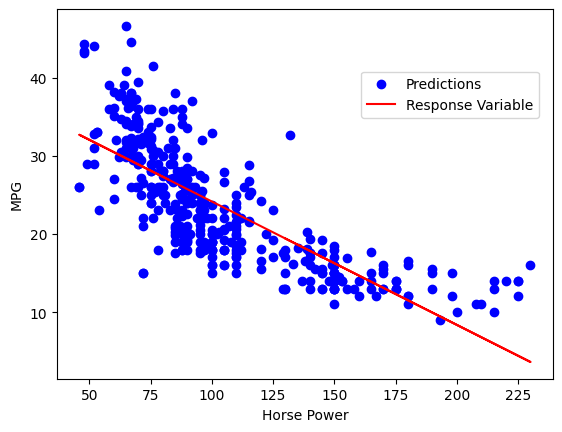

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(Auto['horsepower'], Auto['mpg'], label='Predictions', color='b')

plt.plot(Auto['horsepower'], results.fittedvalues, label='Response Variable', color='r')
plt.xlabel('Horse Power')
plt.ylabel('MPG')

# Add legends
plt.legend(loc='upper left', bbox_to_anchor=(0.60, 0.95))
plt.legend(loc='upper left', bbox_to_anchor=(0.60, 0.85))

plt.show()

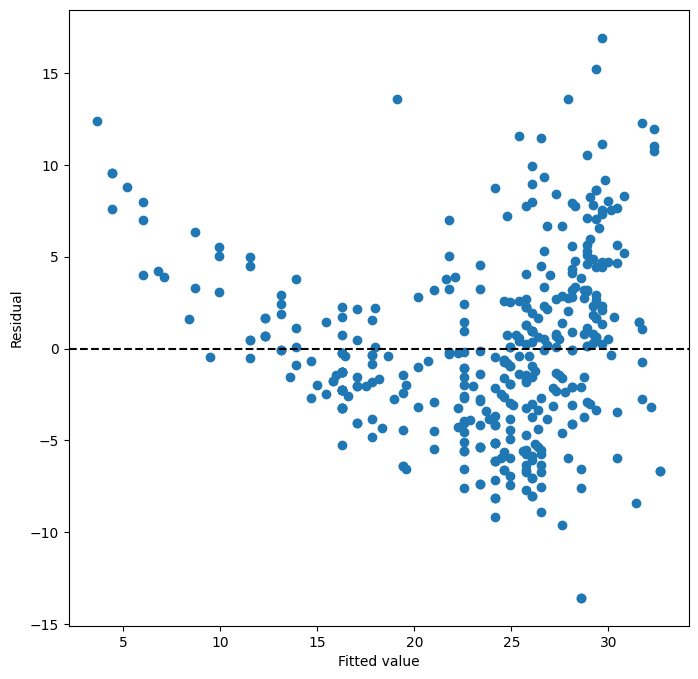

In [ ]:
ax = subplots(figsize=(8,8))[1]
ax.scatter(results.fittedvalues , results.resid)
ax.set_xlabel('Fitted value')
ax.set_ylabel('Residual')
ax.axhline(0, c='k', ls='--');
# less variance around where the slope of the prediction line meets with the data. This approximately matches the gradient of the
# log nature of the data.

In [ ]:
# 9
AutoDf = pd.DataFrame(Auto)
pd.plotting.scatter_matrix(Auto[Auto.columns], figsize=(50,50))

In [ ]:
Auto.corr()

<ipython-input-10-df4f2c2346fb>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Auto.corr()


,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin
mpg,1.000000,-0.777618,-0.805127,-0.778427,-0.832244,0.423329,0.580541,0.565209
cylinders,-0.777618,1.000000,0.950823,0.842983,0.897527,-0.504683,-0.345647,-0.568932
displacement,-0.805127,0.950823,1.000000,0.897257,0.932994,-0.543800,-0.369855,-0.614535
horsepower,-0.778427,0.842983,0.897257,1.000000,0.864538,-0.689196,-0.416361,-0.455171
weight,-0.832244,0.897527,0.932994,0.864538,1.000000,-0.416839,-0.309120,-0.585005
acceleration,0.423329,-0.504683,-0.543800,-0.689196,-0.416839,1.000000,0.290316,0.212746
year,0.580541,-0.345647,-0.369855,-0.416361,-0.309120,0.290316,1.000000,0.181528
origin,0.565209,-0.568932,-0.614535,-0.455171,-0.585005,0.212746,0.181528,1.000000


In [ ]:
X = MS(Auto.columns.drop(['mpg','name'])).fit_transform(Auto)
model1 = sm.OLS(Auto['mpg'], X)
results1 = model1.fit()
summarize(results1)

,coef,std err,t,P>|t|
intercept,-17.2184,4.644,-3.707,0.000
cylinders,-0.4934,0.323,-1.526,0.128
displacement,0.0199,0.008,2.647,0.008
horsepower,-0.0170,0.014,-1.230,0.220
weight,-0.0065,0.001,-9.929,0.000
acceleration,0.0806,0.099,0.815,0.415
year,0.7508,0.051,14.729,0.000
origin,1.4261,0.278,5.127,0.000


In [ ]:
anova_lm(results1, results)

,df_resid,ssr,df_diff,ss_diff,F,Pr(>F)
0,384.0,4252.212530,0.0,NaN,NaN,NaN
1,390.0,9385.915872,-6.0,-5133.703341,35.552281,NaN


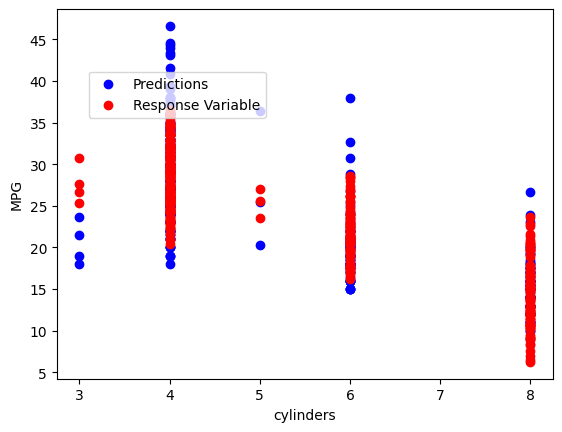

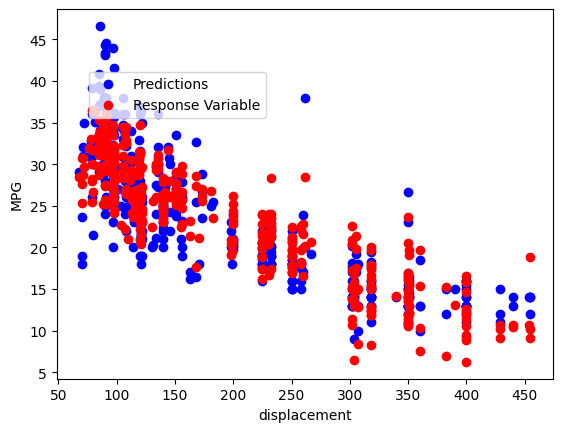

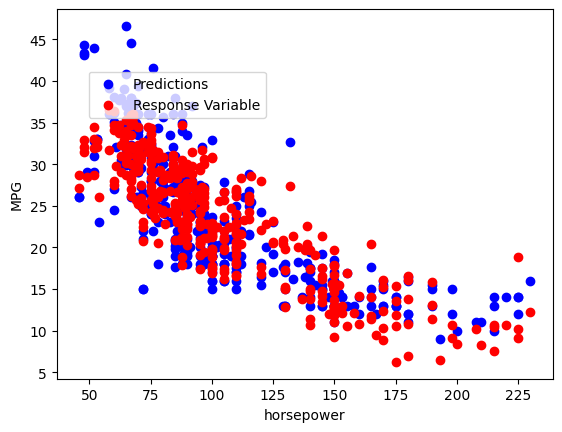

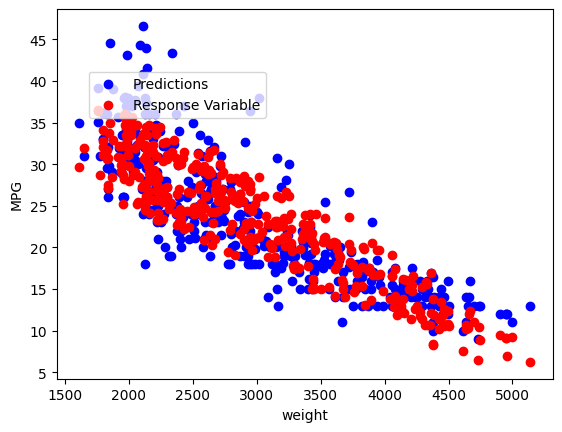

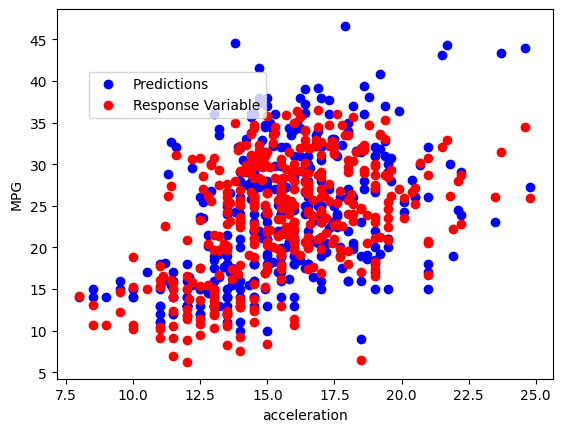

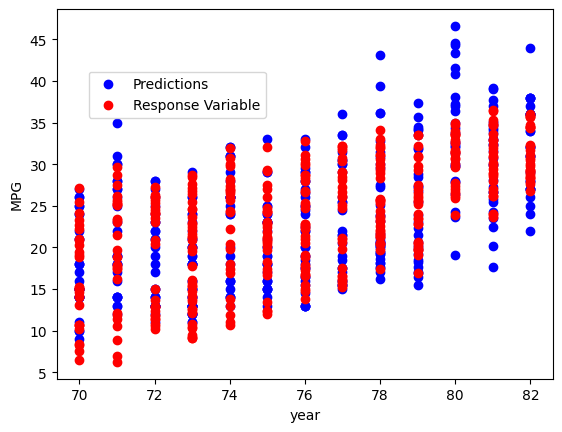

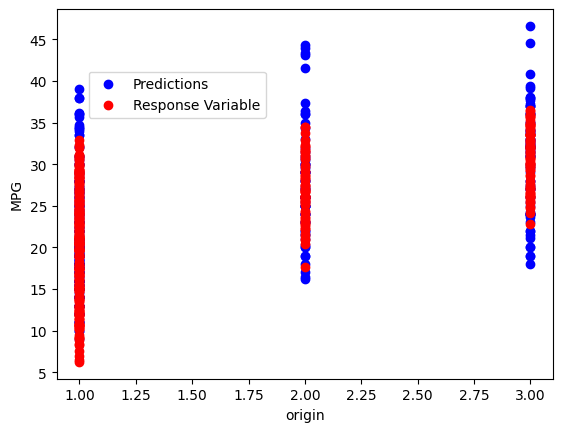

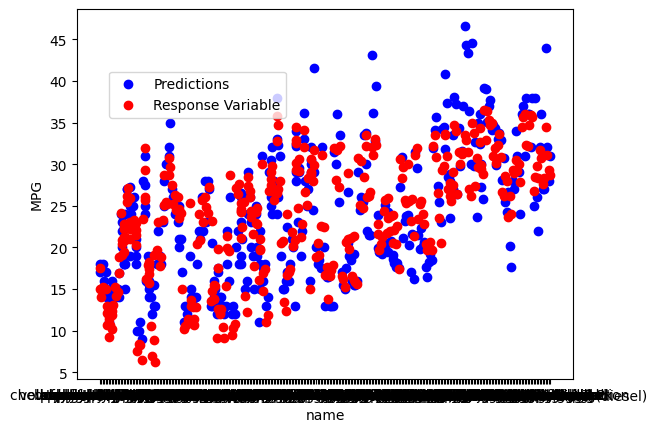

In [ ]:
import matplotlib.pyplot as plt
for col in Auto.columns.drop(['mpg']):
  plt.scatter(Auto[col], Auto['mpg'], label='Predictions', color='b')

  plt.scatter(Auto[col], results1.fittedvalues, label='Response Variable', color='r')
  plt.xlabel(col)
  plt.ylabel('MPG')

  # Add legends
  plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95))
  plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.85))

  plt.show()


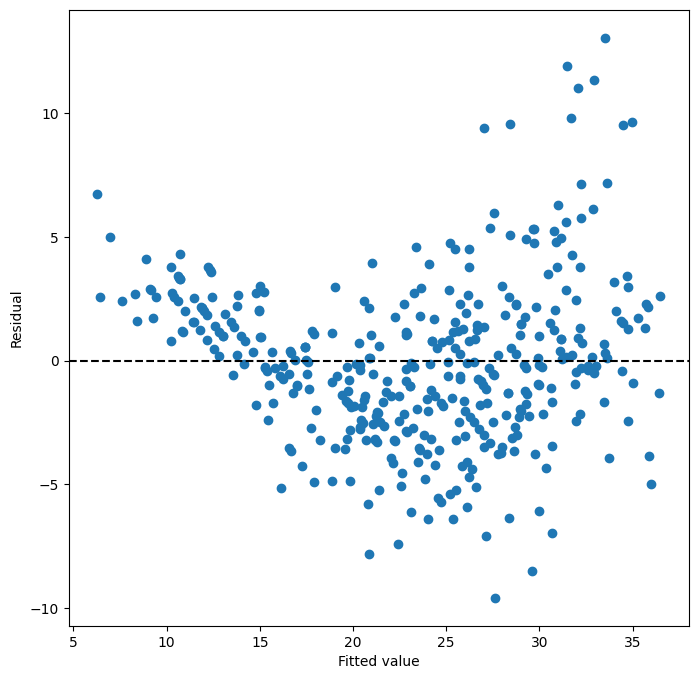

In [ ]:
ax = subplots(figsize=(8,8))[1]
ax.scatter(results1.fittedvalues , results1.resid)
ax.set_xlabel('Fitted value')
ax.set_ylabel('Residual')
ax.axhline(0, c='k', ls='--')

In [ ]:
X = MS(Auto.columns.drop(['mpg','name'])).fit_transform(Auto)
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2, interaction_only=True)

X_poly = poly.fit_transform(X)
column_names = poly.get_feature_names_out(input_features=X.columns)

poly_df = pd.DataFrame(X_poly, columns=column_names)
for col in poly_df.columns:
  poly_df[f'log_x1-{col}'] = np.log(poly_df[col])
  poly_df[f'sqrt_x2-{col}'] = np.sqrt(poly_df[col])

model1 = sm.OLS(Auto['mpg'], poly_df)
results1 = model1.fit()
p_values = results1.pvalues

significant_columns = p_values < 0.05

selected_columns = poly_df.columns[significant_columns]
significant_coefficients = results1.params[significant_columns]
significant_p_values = p_values[significant_columns]

significant_results = pd.DataFrame({'Coefficient': significant_coefficients, 'P-Value': significant_p_values})

print(significant_results)


                             Coefficient   P-Value
1                           22952.625122  0.000004
intercept                   22952.622278  0.000004
cylinders                     138.263909  0.025477
horsepower                     -2.484727  0.030457
year                         -576.823444  0.000007
...                                  ...       ...
log_x1-weight origin          276.487304  0.010041
sqrt_x2-weight origin          10.555650  0.015750
log_x1-acceleration year   -10666.453999  0.000005
log_x1-acceleration origin    295.383679  0.001515
log_x1-year origin         -12382.291402  0.000005

[67 rows x 2 columns]


In [ ]:
Auto.columns

Index(['mpg', 'cylinders', 'displacement', 'horsepower', 'weight',
       'acceleration', 'year', 'origin', 'name'],
      dtype='object')

In [ ]:
# 10
Carseats = load_data("Carseats")
X = MS(Carseats[['Price', 'Urban','US']].columns).fit_transform(Carseats)
model1 = sm.OLS(Carseats['Sales'], X)
results1 = model1.fit()
summarize(results1)

,coef,std err,t,P>|t|
intercept,13.0435,0.651,20.036,0.000
Price,-0.0545,0.005,-10.389,0.000
Urban[Yes],-0.0219,0.272,-0.081,0.936
US[Yes],1.2006,0.259,4.635,0.000


B. Coefficients:
  price - drives sales down if the price is higher
  Urban[Yes] - sales in an urban setting are less than their counterpart
  US[Yes] - car sales in the US are higher than in other places
C. y_hat = b0 - 0.0545*price - 0.0219 * Urban + 1.2006*US
D. Price and US[Yes] both have P_values close to 0, so we can reject the null hypothesis for these two variables. Urban[Yes] we can't

In [ ]:
Carseats = load_data("Carseats")
X = MS(Carseats[['Price','US']].columns).fit_transform(Carseats)
model2 = sm.OLS(Carseats['Sales'], X)
results2 = model2.fit()
summarize(results2)

,coef,std err,t,P>|t|
intercept,13.0308,0.631,20.652,0.0
Price,-0.0545,0.005,-10.416,0.0
US[Yes],1.1996,0.258,4.641,0.0


In [ ]:
anova_lm(results1, results2)

,df_resid,ssr,df_diff,ss_diff,F,Pr(>F)
0,396.0,2420.834671,0.0,NaN,NaN,NaN
1,397.0,2420.874462,-1.0,-0.03979,0.006525,NaN


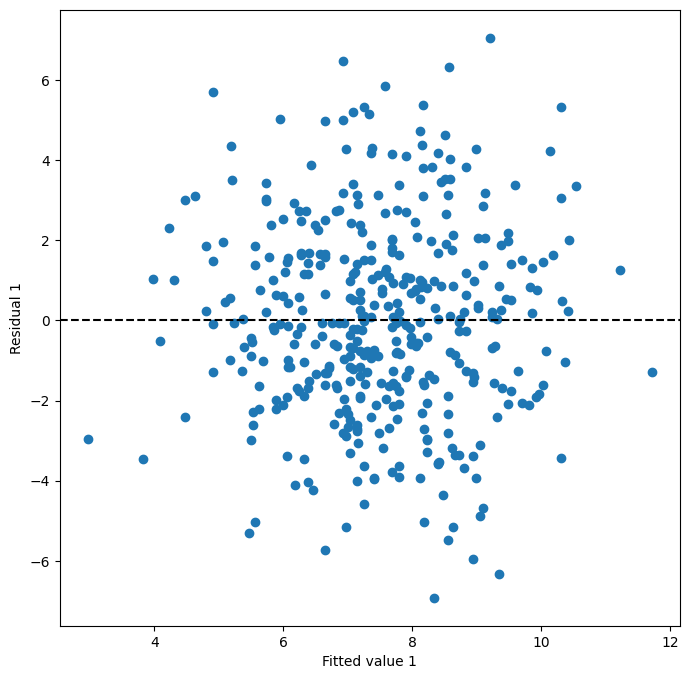

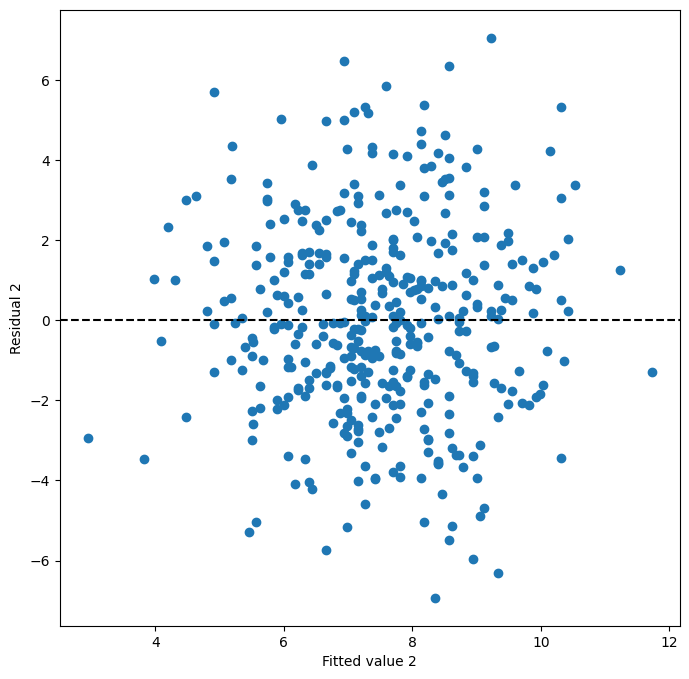

In [ ]:
ax = subplots(figsize=(8,8))[1]
ax.scatter(results1.fittedvalues , results1.resid)
ax.set_xlabel('Fitted value 1')
ax.set_ylabel('Residual 1')
ax.axhline(0, c='k', ls='--')

ax = subplots(figsize=(8,8))[1]
ax.scatter(results2.fittedvalues , results2.resid)
ax.set_xlabel('Fitted value 2')
ax.set_ylabel('Residual 2')
ax.axhline(0, c='k', ls='--')

In [ ]:
results2.conf_int(alpha=.05)

,0,1
intercept,11.79032,14.271265
Price,-0.06476,-0.044195
US[Yes],0.69152,1.707766


ValueError: ignored

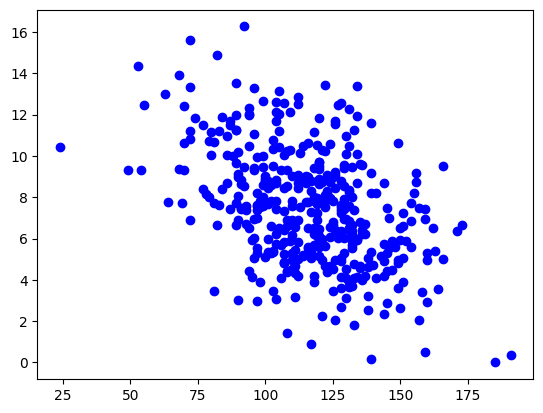

In [ ]:
for col in ['Price','US']:
  plt.scatter(Carseats[col], Carseats['Sales'], label='Predictions', color='b')

  plt.scatter(Carseats[col], results1.fittedvalues, label='Response Variable', color='r')
  plt.xlabel(col)
  plt.ylabel('MPG')

  # Add legends
  plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95))
  plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.85))

  plt.show()

In [ ]:
# 11
rng = np.random.default_rng(1)
x = rng.normal(size=100)
y = 2 * x + rng.normal(size=100)
model2 = sm.OLS(y, x)
results2 = model2.fit()
summarize(results2)

,coef,std err,t,P>|t|
x1,1.9762,0.117,16.898,0.0


The coefficient is almost spot on with the coefficient of the true function (2). This makes sense that the std err is very low, with a high t-statistic and low p-value, considering the line is a great fit with the data, stating that which we already know (the data does follow a trend, albeit with some noise). (-3,-3) is a leverage point.

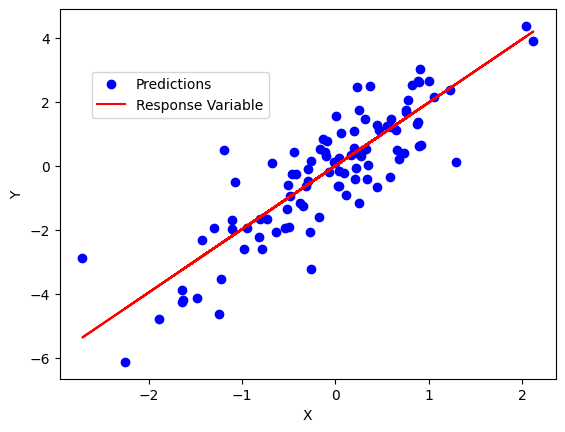

In [ ]:
plt.scatter(x, y, label='Predictions', color='b')

plt.plot(x, results2.fittedvalues, label='Response Variable', color='r')
plt.xlabel('X')
plt.ylabel('Y')

# Add legends
plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95))
plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.85))

plt.show()

Did this in reverse, so now I'll do y onto x

In [ ]:
rng = np.random.default_rng(1)
x = rng.normal(size=100)
y = 2 * x + rng.normal(size=100)
model2 = sm.OLS(x,y)
results2 = model2.fit()
summarize(results2)

,coef,std err,t,P>|t|
x1,0.3757,0.022,16.898,0.0


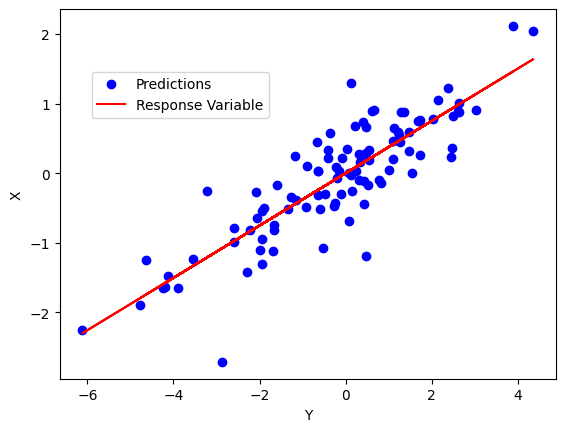

In [ ]:
plt.scatter(y,x, label='Predictions', color='b')

plt.plot(y, results2.fittedvalues, label='Response Variable', color='r')
plt.xlabel('Y')
plt.ylabel('X')

# Add legends
plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95))
plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.85))

plt.show()

Interestingly, it looks like this regression model was less affected by the leverage point. as a result, we have a lower std err. The p-value is still around 0

d.
we have

b_hat/SE(b_hat) = (sum(xiyi)/sum(xi**2))(1/sqrt(sum(yi-xi*b_hat)**2/((n-1)*sum(xi**2))))

We can start with expanding the residual expression:
(yi-xi*b_hat)**2 = yi**2 - 2*b_hat*yi*xi + b_hat**2 * xi**2
which gives sum(yi**2) - 2*b_hat*sum(yi*xi) + b_hat**2 * sum(xi**2)
going back to our original equation, square everything, which allows us to pop the denominator in the denominator on top. Can cancel out the top sum(xi**2) term and reduce power of the denominator of the b_hat term. Multiplying through by the bottom expression of b_hat to the residual equivalent yields sum(xi**2) * sum(yi**2) - sum((xi*yi)**2). this yields our equation desired.

the t-statistic remains the same because of commutativity of sums/multiplication

12.
a. The only time this would occur is when slope is equal to 1. take y = c1x and x = (1/c1)y. In order for the coefficient to be equal, we would need c1=1/c1. this means c1**2 = 1, or c1 = 1


In [ ]:
# 12.b
rng = np.random.default_rng(1)
x = rng.normal(size=100)
y = (5 * x) + rng.normal(size=100)
model2 = sm.OLS(x,y)
results2 = model2.fit()
print(summarize(results2))

rng = np.random.default_rng(1)
x = rng.normal(size=100)
y = (5 * x) + rng.normal(size=100)
model2 = sm.OLS(y,x)
results2 = model2.fit()
summarize(results2)

      coef  std err       t  P>|t|
x1  0.1905    0.004  42.551    0.0


,coef,std err,t,P>|t|
x1,4.9762,0.117,42.551,0.0


In [ ]:
# 12.c
rng = np.random.default_rng(1)
x = rng.normal(size=100)
y = x + rng.normal(size=100)
modelxy = sm.OLS(x,y)
results2 = modelxy.fit()
print(summarize(results2))


modelyx = sm.OLS(y,x)
results2 = modelyx.fit()
print(summarize(results2))

# without noise
rng = np.random.default_rng(1)
x = rng.normal(size=100)
y = x
modelxy = sm.OLS(x,y)
results2 = modelxy.fit()
print(summarize(results2))


modelyx = sm.OLS(y,x)
results2 = modelyx.fit()
print(summarize(results2))

      coef  std err      t  P>|t|
x1  0.4232    0.051  8.348    0.0
      coef  std err      t  P>|t|
x1  0.9762    0.117  8.348    0.0
    coef  std err    t  P>|t|
x1   1.0        0  inf    0.0
    coef  std err    t  P>|t|
x1   1.0        0  inf    0.0


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1870: RuntimeWarning: divide by zero encountered in scalar divide
  return self.mse_model/self.mse_resid
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:50: RuntimeWarning: invalid value encountered in scalar divide
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1870: RuntimeWarning: divide by zero encountered in scalar divide
  return self.mse_model/self.mse_resid
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/usr/local/lib/python3.10/

In [ ]:
# 14
rng = np.random.default_rng(10)
x1 = rng.uniform(0, 1, size=100)
x2 = 0.5 * x1 + rng.normal(size=100) / 10
y = 2 + 2 * x1 + 0.3 * x2 + rng.normal(size=100)
# a. coefficients are 2 and .3

In [ ]:
# b.
np.corrcoef(x1, x2)

array([[1.       , 0.7723245],
       [0.7723245, 1.       ]])

In [ ]:
# c
data = pd.DataFrame({'x1': x1, 'x2': x2,'y': y})
print(data)
X = MS(data.columns).fit_transform(data)
model1 = sm.OLS(data['y'], X.drop('y', axis=1))
results1 = model1.fit()
summarize(results1)
# B0 = 1.96, B1 = 1.62, B2 = 0.94
# B0 is close, B1 is a little ways off, and B2 is really off (3x the original coef)
# We can reject for B0,B1, not B2

          x1        x2         y
0   0.956002  0.469359  4.356977
1   0.207682  0.142509  3.677789
2   0.828445  0.587699  3.482079
3   0.149282  0.181141  2.369093
4   0.512805  0.236458  1.413295
..       ...       ...       ...
95  0.427256  0.273142  3.940722
96  0.790513  0.456659  3.460998
97  0.531602  0.236308  3.355095
98  0.013037  0.054343  2.336922
99  0.019875  0.079619  4.566538

[100 rows x 3 columns]


,coef,std err,t,P>|t|
intercept,1.9579,0.190,10.319,0.000
x1,1.6154,0.527,3.065,0.003
x2,0.9428,0.831,1.134,0.259


In [ ]:
# d
model1 = sm.OLS(data['y'], X.drop(['y', 'x2'], axis=1))
results1 = model1.fit()
summarize(results1)
# these both fit better, and we can reject the null hypothesis for both B0 and B1

,coef,std err,t,P>|t|
intercept,1.9371,0.189,10.242,0.0
x1,2.0771,0.335,6.196,0.0


In [ ]:
# e
X = MS(data.columns).fit_transform(data)
model1 = sm.OLS(data['y'], X.drop(['y', 'x1'], axis=1))
results1 = model1.fit()
summarize(results1)
# yes, we can reject the null hypothesis, but x2 is nowhere near that of the original function.

,coef,std err,t,P>|t|
intercept,2.3239,0.154,15.124,0.0
x2,2.9103,0.550,5.291,0.0


f.
I don't think they necessarily contradict. These models are trying to fit based on different variables, so it makes sense that they might try to compensate for missing information.

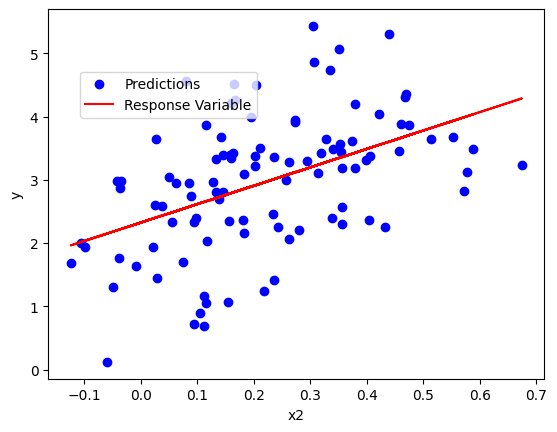

In [ ]:
plt.scatter(data['x2'], data['y'], label='Predictions', color='b')

plt.plot(data['x2'], results1.fittedvalues, label='Response Variable', color='r')
plt.xlabel('x2')
plt.ylabel('y')

# Add legends
plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95))
plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.85))

plt.show()

             coef  std err       t  P>|t|
intercept  2.0618    0.192  10.720  0.000
x1         0.8575    0.466   1.838  0.069
x2         2.2663    0.705   3.216  0.002
             coef  std err       t  P>|t|
intercept  2.0739    0.201  10.310    0.0
x1         1.8760    0.358   5.236    0.0


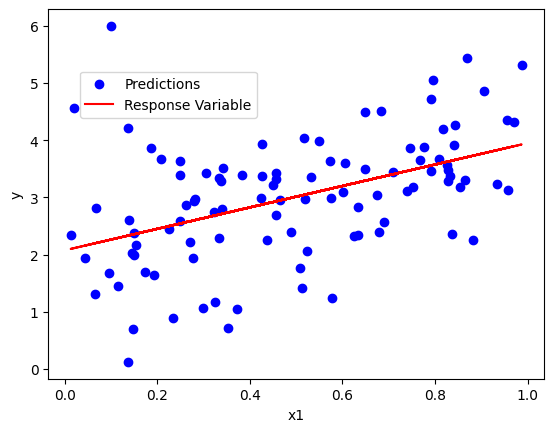

             coef  std err       t  P>|t|
intercept  2.0739    0.201  10.310    0.0
x1         1.8760    0.358   5.236    0.0


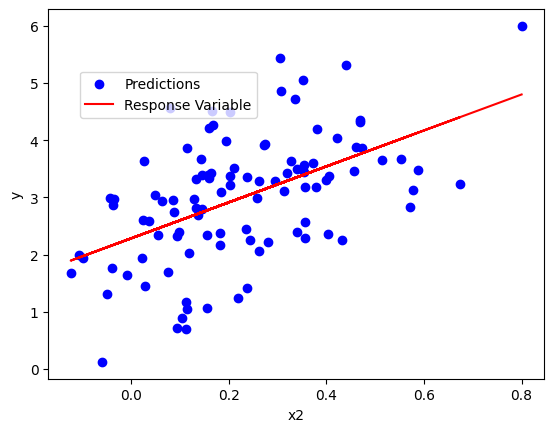

In [ ]:
x1 = np.concatenate([x1, [0.1]])
x2 = np.concatenate([x2, [0.8]])
y = np.concatenate([y, [6]])
data = pd.DataFrame({'x1': x1, 'x2': x2,'y': y})
X = MS(data.columns).fit_transform(data)
model1 = sm.OLS(data['y'], X.drop(['y'], axis=1))
results1 = model1.fit()
print(summarize(results1))

X = MS(data.columns).fit_transform(data)
model2 = sm.OLS(data['y'], X.drop(['y', 'x2'], axis=1))
results2 = model2.fit()
print(summarize(results2))
plt.scatter(data['x1'], data['y'], label='Predictions', color='b')

plt.plot(data['x1'], results2.fittedvalues, label='Response Variable', color='r')
plt.xlabel('x1')
plt.ylabel('y')

# Add legends
plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95))
plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.85))

plt.show()

X = MS(data.columns).fit_transform(data)
model3 = sm.OLS(data['y'], X.drop(['y', 'x1'], axis=1))
results3 = model3.fit()
print(summarize(results2))
plt.scatter(data['x2'], data['y'], label='Predictions', color='b')

plt.plot(data['x2'], results3.fittedvalues, label='Response Variable', color='r')
plt.xlabel('x2')
plt.ylabel('y')

# Add legends
plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95))
plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.85))

plt.show()

In [ ]:
def detect_outliers(df):
    outliers = {}
    for col in df.columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 -  IQR
        upper_bound = Q3 +IQR

        outliers[col] = df[(df[col] < lower_bound) | (df[col] > upper_bound)]

    return outliers

# Assuming data is your DataFrame
outliers_data = detect_outliers(data)

# To see outliers for a specific column, say 'x1':
print(outliers_data['x1'])


Empty DataFrame
Columns: [x1, x2, y]
Index: []


model 1
             coef  std err       t  P>|t|
intercept  4.4537    0.417  10.675    0.0
zn        -0.0739    0.016  -4.594    0.0


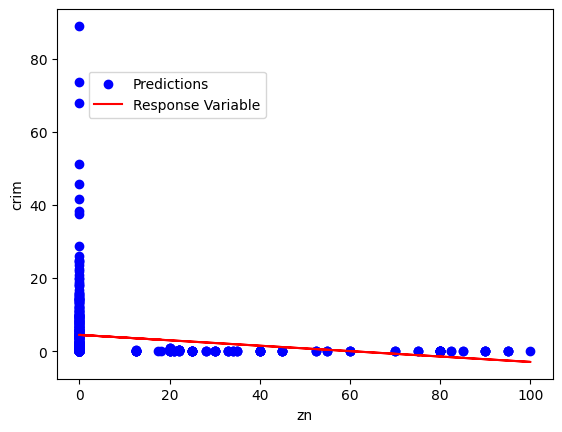

model 2
             coef  std err      t  P>|t|
intercept -2.0637    0.667 -3.093  0.002
indus      0.5098    0.051  9.991  0.000


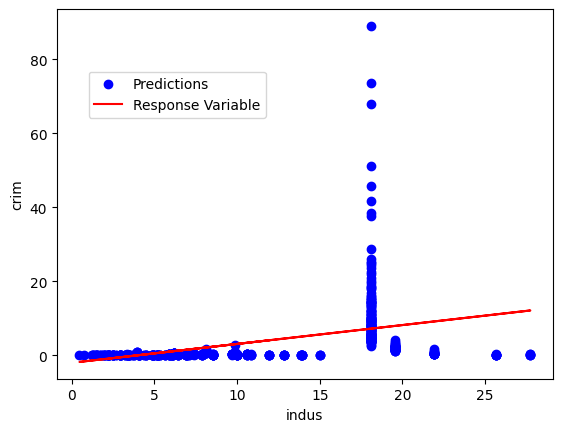

model 3
             coef  std err      t  P>|t|
intercept  3.7444    0.396  9.453  0.000
chas      -1.8928    1.506 -1.257  0.209


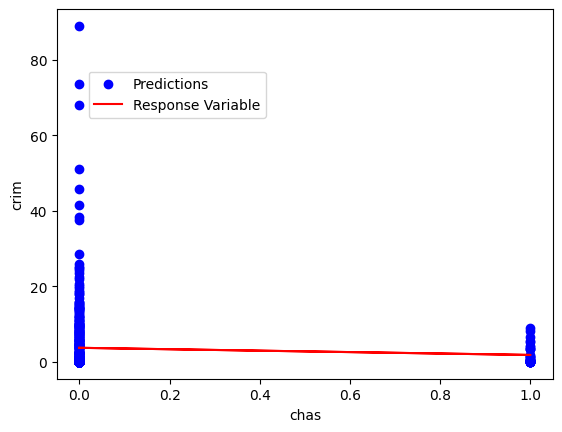

model 4
              coef  std err       t  P>|t|
intercept -13.7199    1.699  -8.073    0.0
nox        31.2485    2.999  10.419    0.0


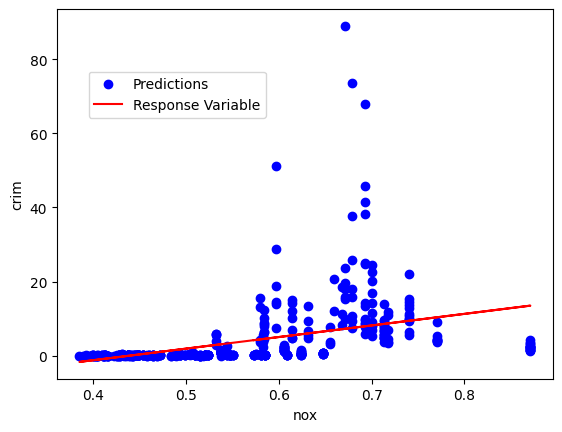

model 5
              coef  std err      t  P>|t|
intercept  20.4818    3.364  6.088    0.0
rm         -2.6841    0.532 -5.045    0.0


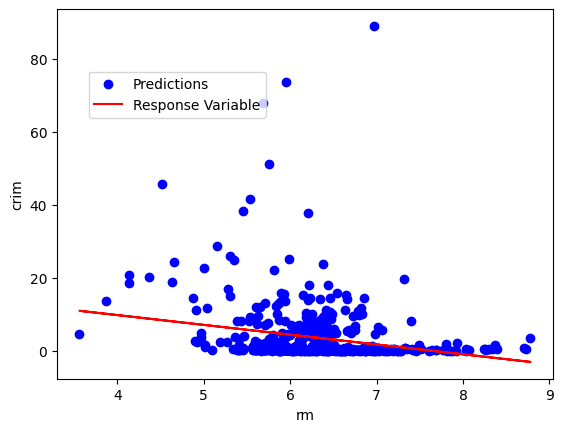

model 6
             coef  std err      t  P>|t|
intercept -3.7779    0.944 -4.002    0.0
age        0.1078    0.013  8.463    0.0


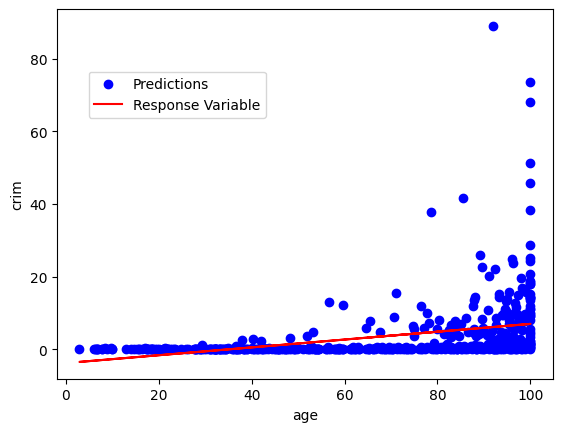

model 7
             coef  std err       t  P>|t|
intercept  9.4993    0.730  13.006    0.0
dis       -1.5509    0.168  -9.213    0.0


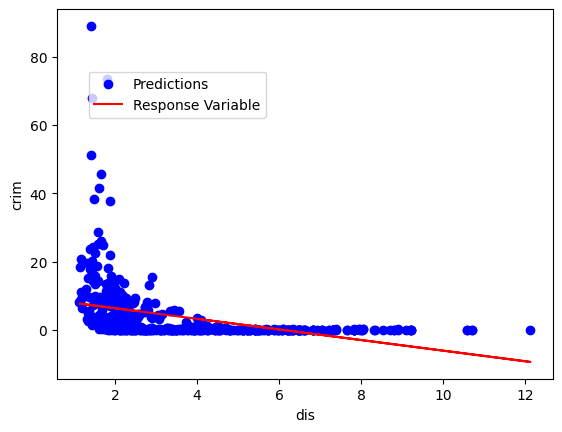

model 8
             coef  std err       t  P>|t|
intercept -2.2872    0.443  -5.157    0.0
rad        0.6179    0.034  17.998    0.0


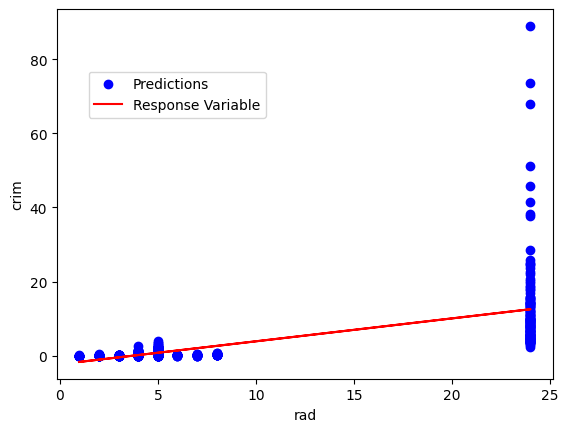

model 9
             coef  std err       t  P>|t|
intercept -8.5284    0.816 -10.454    0.0
tax        0.0297    0.002  16.099    0.0


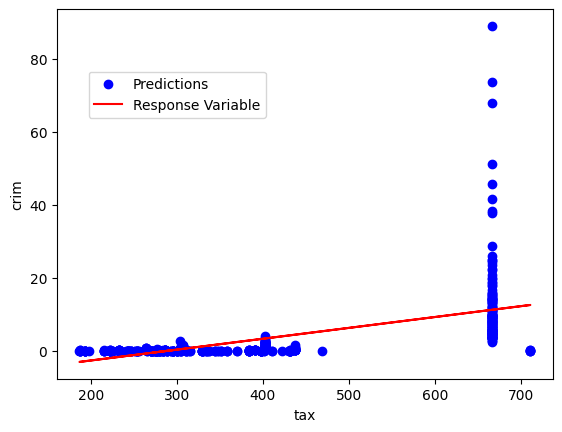

model 10
              coef  std err      t  P>|t|
intercept -17.6469    3.147 -5.607    0.0
ptratio     1.1520    0.169  6.801    0.0


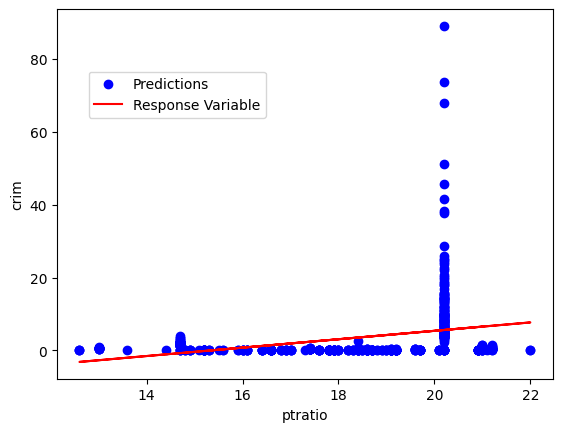

model 11
             coef  std err       t  P>|t|
intercept -3.3305    0.694  -4.801    0.0
lstat      0.5488    0.048  11.491    0.0


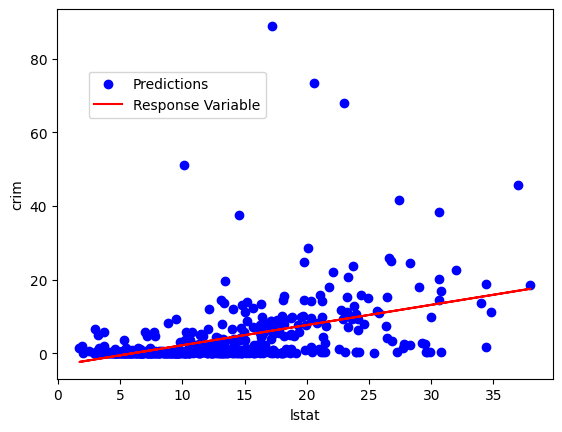

model 12
              coef  std err       t  P>|t|
intercept  11.7965    0.934  12.628    0.0
medv       -0.3632    0.038  -9.460    0.0


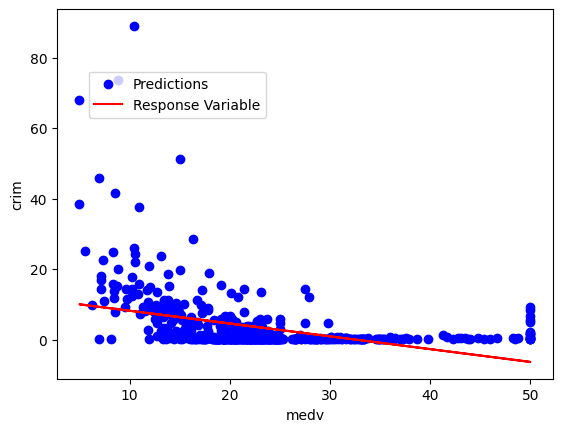

In [ ]:
# 15.
# a.
Boston = load_data('Boston')
linear_coefs = []
for i, col in enumerate(Boston.columns):
  data = MS(Boston[[col, 'crim']].columns).fit_transform(Boston)
  if col != 'crim':
    model1 = sm.OLS(data['crim'], data.drop('crim', axis=1))
    results1 = model1.fit()
    print(f'model {i}')
    summary = summarize(results1)
    print(summary)
    linear_coefs.append(summary.coef[1])
    plt.scatter(data[col], data['crim'], label='Predictions', color='b')

    plt.plot(data[col], results1.fittedvalues, label='Response Variable', color='r')
    plt.xlabel(col)
    plt.ylabel('crim')

    # Add legends
    plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95))
    plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.85))

    plt.show()
# with a lot of these being categorical, I think it did the best it could with most. The p-values for all but chas were good

In [ ]:
# b.
Boston = load_data('Boston')
data = MS(Boston.columns).fit_transform(Boston)
model1 = sm.OLS(data['crim'], data.drop('crim', axis=1))
results1 = model1.fit()
print(summarize(results1))
# Can reject null hypothesis for zn, dis, rad, and medv

              coef  std err      t  P>|t|
intercept  13.7784    7.082  1.946  0.052
zn          0.0457    0.019  2.433  0.015
indus      -0.0584    0.084 -0.698  0.486
chas       -0.8254    1.183 -0.697  0.486
nox        -9.9576    5.290 -1.882  0.060
rm          0.6289    0.607  1.036  0.301
age        -0.0008    0.018 -0.047  0.962
dis        -1.0122    0.282 -3.584  0.000
rad         0.6125    0.088  6.997  0.000
tax        -0.0038    0.005 -0.730  0.466
ptratio    -0.3041    0.186 -1.632  0.103
lstat       0.1388    0.076  1.833  0.067
medv       -0.2201    0.060 -3.678  0.000


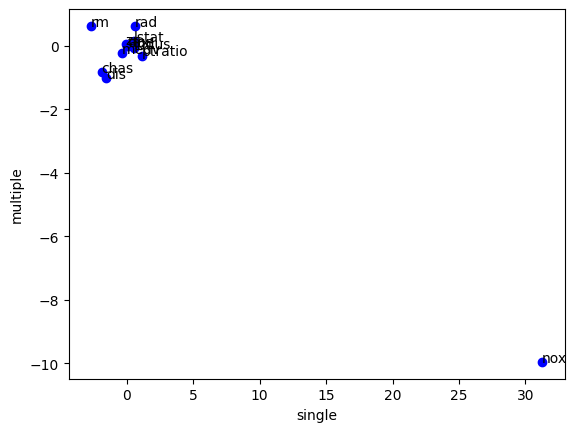

In [ ]:
# c.
# There were a few variables that I was surprised weren't statistically significant in the multiple vs
# single regression (particularly nox)
summary = summarize(results1)
params = results1.params.drop('intercept').index.tolist()
plt.scatter(linear_coefs, summary.drop('intercept').coef, label='Predictions', color='b')
for i, txt in enumerate(params):
    plt.annotate(txt, (linear_coefs[i], summary.drop('intercept').coef[i]))

plt.xlabel('single')
plt.ylabel('multiple')

plt.show()


In [ ]:
# d.
X = MS(Boston.columns.drop('crim')).fit_transform(Boston)
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2)

X_poly = poly.fit_transform(X)
column_names = poly.get_feature_names_out(input_features=X.columns)

poly_df = pd.DataFrame(X_poly, columns=column_names)

model1 = sm.OLS(Boston['crim'], poly_df)
results1 = model1.fit()
summarize(results1)

p_values = results1.pvalues

significant_columns = p_values < 0.05

selected_columns = poly_df.columns[significant_columns]
significant_coefficients = results1.params[significant_columns]
significant_p_values = p_values[significant_columns]

significant_results = pd.DataFrame({'Coefficient': significant_coefficients, 'P-Value': significant_p_values})

print(significant_results)


          Coefficient   P-Value
rm lstat    -0.404546  0.004106
rm medv     -0.209709  0.048634
dis rad     -0.382644  0.005845
dis medv     0.249190  0.013213
medv^2       0.034720  0.000073


# Chapter 4 Lab

In [ ]:
import numpy as np
import pandas as pd
from matplotlib.pyplot import subplots
import statsmodels.api as sm
from ISLP import load_data
from ISLP.models import (ModelSpec as MS,
summarize)

In [ ]:
from ISLP import confusion_table
from ISLP.models import contrast
from sklearn.discriminant_analysis import \
(LinearDiscriminantAnalysis as LDA,
QuadraticDiscriminantAnalysis as QDA)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

In [ ]:
Smarket = load_data('Smarket')
Smarket.head()
Smarket.corr()

<ipython-input-6-f897120ba37e>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Smarket.corr()


,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today
Year,1.000000,0.029700,0.030596,0.033195,0.035689,0.029788,0.539006,0.030095
Lag1,0.029700,1.000000,-0.026294,-0.010803,-0.002986,-0.005675,0.040910,-0.026155
Lag2,0.030596,-0.026294,1.000000,-0.025897,-0.010854,-0.003558,-0.043383,-0.010250
Lag3,0.033195,-0.010803,-0.025897,1.000000,-0.024051,-0.018808,-0.041824,-0.002448
Lag4,0.035689,-0.002986,-0.010854,-0.024051,1.000000,-0.027084,-0.048414,-0.006900
Lag5,0.029788,-0.005675,-0.003558,-0.018808,-0.027084,1.000000,-0.022002,-0.034860
Volume,0.539006,0.040910,-0.043383,-0.041824,-0.048414,-0.022002,1.000000,0.014592
Today,0.030095,-0.026155,-0.010250,-0.002448,-0.006900,-0.034860,0.014592,1.000000


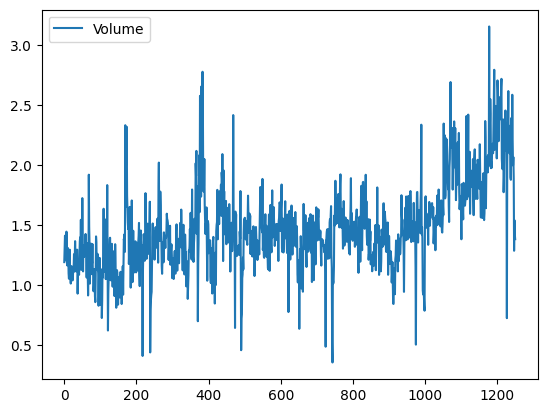

In [ ]:
  Smarket.plot(y='Volume');

In [ ]:
allvars = Smarket.columns.drop(['Today', 'Direction', 'Year'])
design = MS(allvars)
X = design.fit_transform(Smarket)
y = Smarket.Direction == 'Up'
glm = sm.GLM(y,
X,
family=sm.families.Binomial())
results = glm.fit()
summarize(results)

,coef,std err,z,P>|z|
intercept,-0.1260,0.241,-0.523,0.601
Lag1,-0.0731,0.050,-1.457,0.145
Lag2,-0.0423,0.050,-0.845,0.398
Lag3,0.0111,0.050,0.222,0.824
Lag4,0.0094,0.050,0.187,0.851
Lag5,0.0103,0.050,0.208,0.835
Volume,0.1354,0.158,0.855,0.392


In [ ]:
print(results.params)
print(results.pvalues)
probs = results.predict()
print(probs[:10])
labels = np.array(['Down']*1250)
labels[probs >0.5] = "Up"
print(labels[:10])
print(confusion_table(labels, Smarket.Direction))

intercept   -0.126000
Lag1        -0.073074
Lag2        -0.042301
Lag3         0.011085
Lag4         0.009359
Lag5         0.010313
Volume       0.135441
dtype: float64
intercept    0.600700
Lag1         0.145232
Lag2         0.398352
Lag3         0.824334
Lag4         0.851445
Lag5         0.834998
Volume       0.392404
dtype: float64
[0.50708413 0.48146788 0.48113883 0.51522236 0.51078116 0.50695646
 0.49265087 0.50922916 0.51761353 0.48883778]
['Up' 'Down' 'Down' 'Up' 'Up' 'Up' 'Down' 'Up' 'Up' 'Down']
Truth      Down   Up
Predicted           
Down        145  141
Up          457  507


In [ ]:
train = (Smarket.Year < 2005)
Smarket_train = Smarket.loc[train]
Smarket_test = Smarket.loc[-train]
Smarket_test.shape

(252, 9)

In [ ]:
X_train, X_test = X.loc[train], X.loc[-train]
y_train, y_test = y.loc[train], y.loc[-train]
glm_train = sm.GLM(y_train,
X_train,
family=sm.families.Binomial())
results = glm_train.fit()
probs = results.predict(exog=X_test)

In [ ]:
D = Smarket.Direction
L_train, L_test = D.loc[train], D.loc[-train]
labels = np.array(['Down']*252)
labels[probs >0.5] = 'Up'
confusion_table(labels, L_test)

Truth,Down,Up
Predicted,,
Down,77,97
Up,34,44


In [ ]:
model = MS(['Lag1', 'Lag2']).fit(Smarket)
X = model.transform(Smarket)
X_train, X_test = X.loc[train], X.loc[-train]
glm_train = sm.GLM(y_train,
X_train,
family=sm.families.Binomial())
results = glm_train.fit()
probs = results.predict(exog=X_test)
labels = np.array(['Down']*252)
labels[probs >0.5] = 'Up'
confusion_table(labels, L_test)

Truth,Down,Up
Predicted,,
Down,35,35
Up,76,106


In [ ]:
newdata = pd.DataFrame({'Lag1':[1.2, 1.5],
'Lag2':[1.1, -0.8]})
newX = model.transform(newdata)
results.predict(newX)

0    0.479146
1    0.496094
dtype: float64

In [ ]:
lda = LDA(store_covariance=True)

In [ ]:
X_train, X_test = [M.drop(columns=['intercept']) for M in [X_train, X_test]]
lda.fit(X_train, L_train)

LinearDiscriminantAnalysis(store_covariance=True)

In [ ]:
print(lda.means_)
print(lda.classes_)
print(lda.priors_)
print(lda.scalings_)
lda_pred = lda.predict(X_test)
print(confusion_table(lda_pred, L_test))

[[ 0.04279022  0.03389409]
 [-0.03954635 -0.03132544]]
['Down' 'Up']
[0.49198397 0.50801603]
[[-0.64201904]
 [-0.51352928]]
Truth      Down   Up
Predicted           
Down         35   35
Up           76  106


In [ ]:
lda_prob = lda.predict_proba(X_test)
np.all(
np.where(lda_prob[:,1] >= 0.5, 'Up','Down') == lda_pred
)

True

In [ ]:
np.sum(lda_prob[:,0] > 0.9)

0

In [ ]:
qda = QDA(store_covariance=True)
qda.fit(X_train, L_train)
print(qda.means_, qda.priors_)
print(qda.covariance_[0])

[[ 0.04279022  0.03389409]
 [-0.03954635 -0.03132544]] [0.49198397 0.50801603]
[[ 1.50662277 -0.03924806]
 [-0.03924806  1.53559498]]


In [ ]:
qda_pred = qda.predict(X_test)
confusion_table(qda_pred, L_test)

Truth,Down,Up
Predicted,,
Down,30,20
Up,81,121


In [ ]:
NB = GaussianNB()
NB.fit(X_train, L_train)
print(NB.classes_)
print(NB.class_prior_)
print(NB.theta_)
print(NB.var_)
print(X_train[L_train == 'Down'].mean())
print(X_train[L_train == 'Down'].var(ddof=0))

['Down' 'Up']
[0.49198397 0.50801603]
[[ 0.04279022  0.03389409]
 [-0.03954635 -0.03132544]]
[[1.50355429 1.53246749]
 [1.51401364 1.48732877]]
Lag1    0.042790
Lag2    0.033894
dtype: float64
Lag1    1.503554
Lag2    1.532467
dtype: float64


In [ ]:
nb_labels = NB.predict(X_test)
confusion_table(nb_labels, L_test)

Truth,Down,Up
Predicted,,
Down,29,20
Up,82,121


In [ ]:
NB.predict_proba(X_test)[:5]

array([[0.4873288 , 0.5126712 ],
       [0.47623584, 0.52376416],
       [0.46529531, 0.53470469],
       [0.47484469, 0.52515531],
       [0.49020587, 0.50979413]])

In [ ]:
knn1 = KNeighborsClassifier(n_neighbors=1)
knn1.fit(X_train, L_train)
knn1_pred = knn1.predict(X_test)
confusion_table(knn1_pred, L_test)

Truth,Down,Up
Predicted,,
Down,43,58
Up,68,83


In [ ]:
(83+43)/252, np.mean(knn1_pred == L_test)

(0.5, 0.5)

In [ ]:
knn3 = KNeighborsClassifier(n_neighbors=3)
knn3_pred = knn3.fit(X_train, L_train).predict(X_test)
np.mean(knn3_pred == L_test)

0.5317460317460317

In [ ]:
Caravan = load_data('Caravan')
Purchase = Caravan.Purchase
Purchase.value_counts()

No     5474
Yes     348
Name: Purchase, dtype: int64

In [ ]:
feature_df = Caravan.drop(columns=['Purchase'])
scaler = StandardScaler(with_mean=True,
with_std=True,
copy=True)
scaler.fit(feature_df)
X_std = scaler.transform(feature_df)

In [ ]:
feature_std = pd.DataFrame(
X_std,
columns=feature_df.columns)
feature_std.std()
(X_train,
X_test,
y_train,
y_test) = train_test_split(feature_std,
Purchase,
test_size=1000,
random_state=0)

In [ ]:
knn1 = KNeighborsClassifier(n_neighbors=1)
knn1_pred = knn1.fit(X_train, y_train).predict(X_test)
np.mean(y_test != knn1_pred), np.mean(y_test != "No")
confusion_table(knn1_pred, y_test)

Truth,No,Yes
Predicted,,
No,880,58
Yes,53,9


In [ ]:
for K in range(1,6):
  knn = KNeighborsClassifier(n_neighbors=K)
  knn_pred = knn.fit(X_train, y_train).predict(X_test)
  C = confusion_table(knn_pred, y_test)
  templ = ('K={0:d}: # predicted to rent: {1:>2},' +
  ' # who did rent {2:d}, accuracy {3:.1%}')
  pred = C.loc['Yes'].sum()
  did_rent = C.loc['Yes','Yes']
  print(templ.format(
  K,
  pred,
  did_rent,
  did_rent / pred))

K=1: # predicted to rent: 62, # who did rent 9, accuracy 14.5%
K=2: # predicted to rent:  6, # who did rent 1, accuracy 16.7%
K=3: # predicted to rent: 20, # who did rent 3, accuracy 15.0%
K=4: # predicted to rent:  4, # who did rent 0, accuracy 0.0%
K=5: # predicted to rent:  7, # who did rent 1, accuracy 14.3%


In [ ]:
logit = LogisticRegression(C=1e10, solver='liblinear')
logit.fit(X_train, y_train)
logit_pred = logit.predict_proba(X_test)
logit_labels = np.where(logit_pred[:,1] > 5, 'Yes', 'No')
confusion_table(logit_labels, y_test)

Truth,No,Yes
Predicted,,
No,933,67
Yes,0,0


In [ ]:
logit_labels = np.where(logit_pred[:,1]>0.25, 'Yes', 'No')
confusion_table(logit_labels, y_test)

Truth,No,Yes
Predicted,,
No,913,58
Yes,20,9


In [ ]:
Bike = load_data('Bikeshare')
Bike.shape, Bike.columns

((8645, 15),
 Index(['season', 'mnth', 'day', 'hr', 'holiday', 'weekday', 'workingday',
        'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'casual',
        'registered', 'bikers'],
       dtype='object'))

In [ ]:
X = MS(['mnth',
'hr',
'workingday',
'temp',
'weathersit']).fit_transform(Bike)
Y = Bike['bikers']
M_lm = sm.OLS(Y, X).fit()
summarize(M_lm)

,coef,std err,t,P>|t|
intercept,-68.6317,5.307,-12.932,0.000
mnth[Feb],6.8452,4.287,1.597,0.110
mnth[March],16.5514,4.301,3.848,0.000
mnth[April],41.4249,4.972,8.331,0.000
mnth[May],72.5571,5.641,12.862,0.000
mnth[June],67.8187,6.544,10.364,0.000
mnth[July],45.3245,7.081,6.401,0.000
mnth[Aug],53.2430,6.640,8.019,0.000
mnth[Sept],66.6783,5.925,11.254,0.000
mnth[Oct],75.8343,4.950,15.319,0.000


In [ ]:
hr_encode = contrast('hr', 'sum')
mnth_encode = contrast('mnth', 'sum')
X2 = MS([mnth_encode,
hr_encode,
'workingday',
'temp',
'weathersit']).fit_transform(Bike)
M2_lm = sm.OLS(Y, X2).fit()
S2 = summarize(M2_lm)
S2

,coef,std err,t,P>|t|
intercept,73.5974,5.132,14.340,0.000
mnth[Jan],-46.0871,4.085,-11.281,0.000
mnth[Feb],-39.2419,3.539,-11.088,0.000
mnth[March],-29.5357,3.155,-9.361,0.000
mnth[April],-4.6622,2.741,-1.701,0.089
mnth[May],26.4700,2.851,9.285,0.000
mnth[June],21.7317,3.465,6.272,0.000
mnth[July],-0.7626,3.908,-0.195,0.845
mnth[Aug],7.1560,3.535,2.024,0.043
mnth[Sept],20.5912,3.046,6.761,0.000


In [ ]:
print(np.sum((M_lm.fittedvalues - M2_lm.fittedvalues)**2))
print(np.allclose(M_lm.fittedvalues , M2_lm.fittedvalues))

1.2686657917492826e-20
True


In [ ]:
coef_month = S2[S2.index.str.contains('mnth')]['coef']
coef_month

mnth[Jan]     -46.0871
mnth[Feb]     -39.2419
mnth[March]   -29.5357
mnth[April]    -4.6622
mnth[May]      26.4700
mnth[June]     21.7317
mnth[July]     -0.7626
mnth[Aug]       7.1560
mnth[Sept]     20.5912
mnth[Oct]      29.7472
mnth[Nov]      14.2229
Name: coef, dtype: float64

In [ ]:
months = Bike['mnth'].dtype.categories
coef_month = pd.concat([
coef_month,
pd.Series([-coef_month.sum()],
index=['mnth[Dec]'
])
])
coef_month

mnth[Jan]     -46.0871
mnth[Feb]     -39.2419
mnth[March]   -29.5357
mnth[April]    -4.6622
mnth[May]      26.4700
mnth[June]     21.7317
mnth[July]     -0.7626
mnth[Aug]       7.1560
mnth[Sept]     20.5912
mnth[Oct]      29.7472
mnth[Nov]      14.2229
mnth[Dec]       0.3705
dtype: float64

Text(0, 0.5, 'Coefficient')

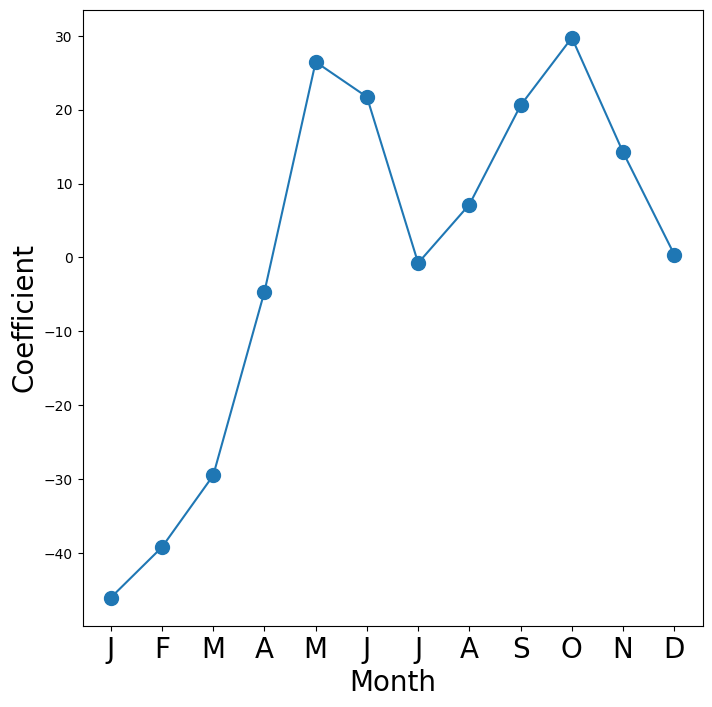

In [ ]:
fig_month, ax_month = subplots(figsize=(8,8))
x_month = np.arange(coef_month.shape[0])
ax_month.plot(x_month, coef_month, marker='o', ms=10)
ax_month.set_xticks(x_month)
ax_month.set_xticklabels([l[5] for l in coef_month.index], fontsize
=20)
ax_month.set_xlabel('Month', fontsize=20)
ax_month.set_ylabel('Coefficient', fontsize=20)

In [ ]:
coef_hr = S2[S2.index.str.contains('hr')]['coef']
coef_hr = coef_hr.reindex(['hr[{0}]'.format(h) for h in range(23)])
coef_hr = pd.concat([coef_hr,
pd.Series([-coef_hr.sum()], index=['hr[23]'])])

Text(0, 0.5, 'Coefficient')

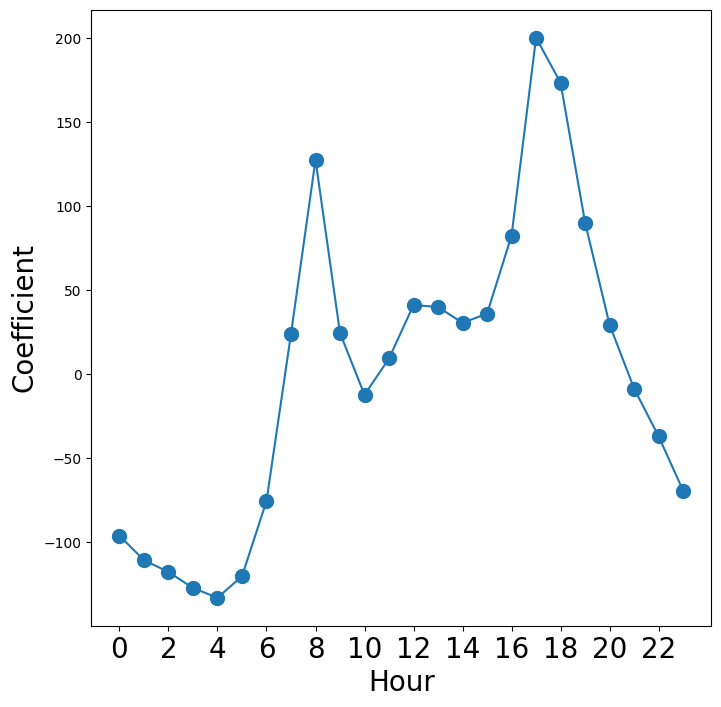

In [ ]:
fig_hr, ax_hr = subplots(figsize=(8,8))
x_hr = np.arange(coef_hr.shape[0])
ax_hr.plot(x_hr, coef_hr, marker='o', ms=10)
ax_hr.set_xticks(x_hr[::2])
ax_hr.set_xticklabels(range(24)[::2], fontsize=20)
ax_hr.set_xlabel('Hour', fontsize=20)
ax_hr.set_ylabel('Coefficient', fontsize=20)

In [ ]:
M_pois = sm.GLM(Y, X2, family=sm.families.Poisson()).fit()

In [ ]:
S_pois = summarize(M_pois)
coef_month = S_pois[S_pois.index.str.contains('mnth')]['coef']
coef_month = pd.concat([coef_month,
pd.Series([-coef_month.sum()],
index=['mnth[Dec]'])])
coef_hr = S_pois[S_pois.index.str.contains('hr')]['coef']
coef_hr = pd.concat([coef_hr,
pd.Series([-coef_hr.sum()],
index=['hr[23]'])])

<ipython-input-62-5379743a6495>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_hr.set_xticklabels(range(24)[::2], fontsize=20)


Text(0, 0.5, 'Coefficient')

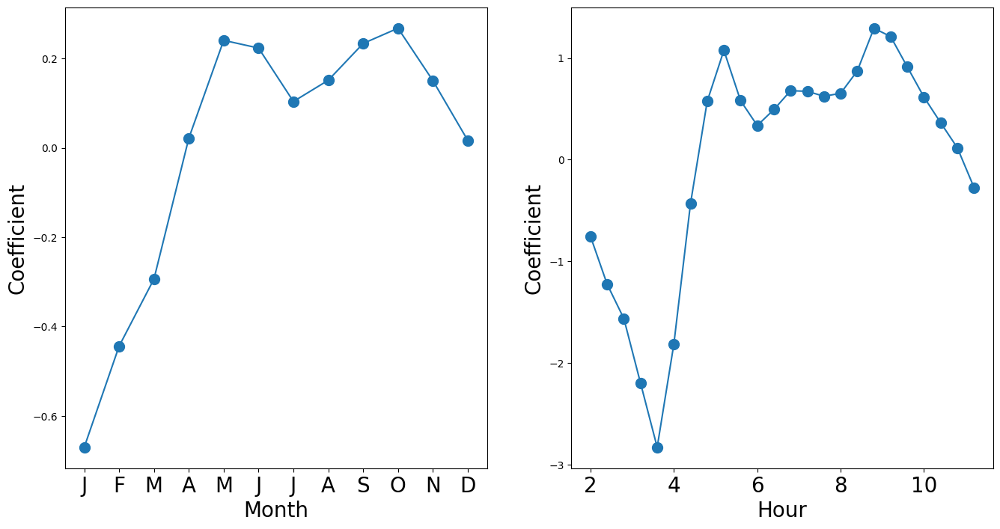

In [ ]:
fig_pois, (ax_month, ax_hr) = subplots(1, 2, figsize=(16,8))
ax_month.plot(x_month, coef_month, marker='o', ms=10)
ax_month.set_xticks(x_month)
ax_month.set_xticklabels([l[5] for l in coef_month.index], fontsize
=20)
ax_month.set_xlabel('Month', fontsize=20)
ax_month.set_ylabel('Coefficient', fontsize=20)
ax_hr.plot(x_hr, coef_hr, marker='o', ms=10)
ax_hr.set_xticklabels(range(24)[::2], fontsize=20)
ax_hr.set_xlabel('Hour', fontsize=20)
ax_hr.set_ylabel('Coefficient', fontsize=20)

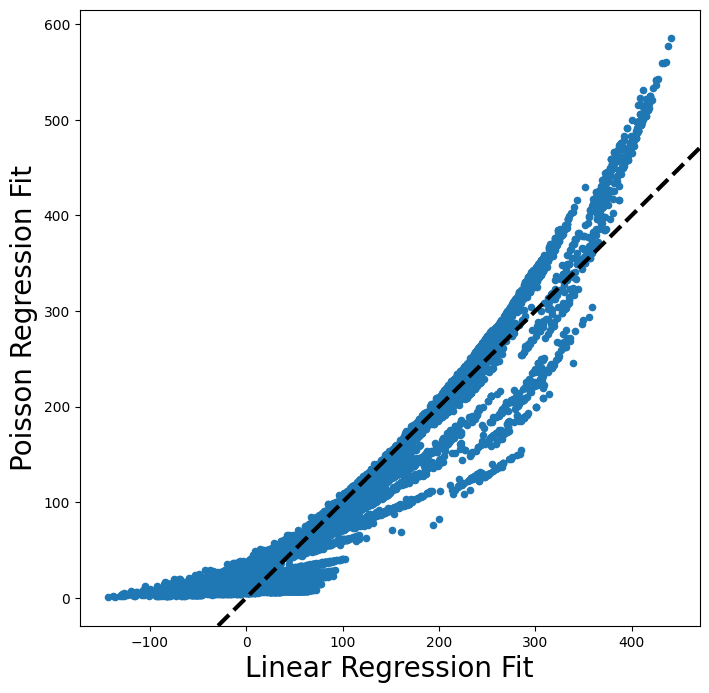

In [ ]:
fig, ax = subplots(figsize=(8, 8))
ax.scatter(M2_lm.fittedvalues ,
M_pois.fittedvalues,
s=20)
ax.set_xlabel('Linear Regression Fit', fontsize=20)
ax.set_ylabel('Poisson Regression Fit', fontsize=20)
ax.axline([0,0], c='black', linewidth=3,
linestyle='--', slope=1)

# Chapter 4 Exercises

In [ ]:
Weekly= load_data('Weekly')
print(Weekly.head())
print(Weekly.describe())
Weekly.corr()

   Year   Lag1   Lag2   Lag3   Lag4   Lag5    Volume  Today Direction
0  1990  0.816  1.572 -3.936 -0.229 -3.484  0.154976 -0.270      Down
1  1990 -0.270  0.816  1.572 -3.936 -0.229  0.148574 -2.576      Down
2  1990 -2.576 -0.270  0.816  1.572 -3.936  0.159837  3.514        Up
3  1990  3.514 -2.576 -0.270  0.816  1.572  0.161630  0.712        Up
4  1990  0.712  3.514 -2.576 -0.270  0.816  0.153728  1.178        Up
              Year         Lag1         Lag2         Lag3         Lag4  \
count  1089.000000  1089.000000  1089.000000  1089.000000  1089.000000   
mean   2000.048669     0.150585     0.151079     0.147205     0.145818   
std       6.033182     2.357013     2.357254     2.360502     2.360279   
min    1990.000000   -18.195000   -18.195000   -18.195000   -18.195000   
25%    1995.000000    -1.154000    -1.154000    -1.158000    -1.158000   
50%    2000.000000     0.241000     0.241000     0.241000     0.238000   
75%    2005.000000     1.405000     1.409000     1.409000     

<ipython-input-6-fa21fe0a96b9>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Weekly.corr()


,Year,Lag1,Lag2,Lag3,Lag4,Lag5,Volume,Today
Year,1.000000,-0.032289,-0.033390,-0.030006,-0.031128,-0.030519,0.841942,-0.032460
Lag1,-0.032289,1.000000,-0.074853,0.058636,-0.071274,-0.008183,-0.064951,-0.075032
Lag2,-0.033390,-0.074853,1.000000,-0.075721,0.058382,-0.072499,-0.085513,0.059167
Lag3,-0.030006,0.058636,-0.075721,1.000000,-0.075396,0.060657,-0.069288,-0.071244
Lag4,-0.031128,-0.071274,0.058382,-0.075396,1.000000,-0.075675,-0.061075,-0.007826
Lag5,-0.030519,-0.008183,-0.072499,0.060657,-0.075675,1.000000,-0.058517,0.011013
Volume,0.841942,-0.064951,-0.085513,-0.069288,-0.061075,-0.058517,1.000000,-0.033078
Today,-0.032460,-0.075032,0.059167,-0.071244,-0.007826,0.011013,-0.033078,1.000000


(1089, 9)


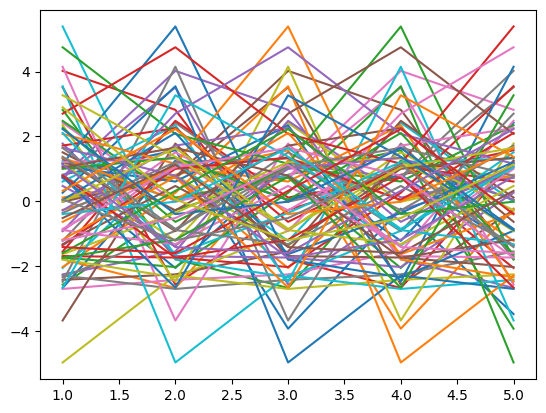

In [ ]:
print(Weekly.shape)
for i in range(Weekly.shape[0]-1000):
  row = Weekly.iloc[i]
  plt.plot([1,2,3,4,5], row[1:6])
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

X = Weekly.drop('Direction', axis=1)
y = Weekly['Direction'].map({'Up':1, 'Down':0})
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=Weekly['Direction'])


feature_df = X_train
scaler = StandardScaler(with_mean=True,
with_std=True,
copy=True)
scaler.fit(feature_df)
X_std = scaler.transform(feature_df)
logit = LogisticRegression(C=1e10, solver='liblinear')
logit.fit(X_std, y_train)
y_pred = logit.predict(scaler.fit_transform(X_test))
print(accuracy_score(y_test, y_pred))
confMat = confusion_matrix(y_test, y_pred)
print(confMat)

allvars = Weekly.columns.drop(['Direction','Today','Year'])
design = MS(allvars)
X = design.fit_transform(Weekly)
glm = sm.GLM(y,
X,
family=sm.families.Binomial())
results = glm.fit()
summarize(results)
probs = results.predict()
labels = np.array(['Down']*1089)
labels[probs >0.5] = "Up"
confusion_table(labels, Weekly.Direction)

# The intercept and lag2 seem like the most significant. Note that with the logistic regression model after scaling,
# I get a much higher accuracy and f1-score. The confusion table says that the model correctly predicted the direction 56% of
# the time. This is horrible compared to the 97% I got the first try with sklearn

0.981651376146789
[[ 93   4]
 [  0 121]]


Truth,Down,Up
Predicted,,
Down,54,48
Up,430,557


In [ ]:
print((557+54)/1089, np.mean(labels == Weekly.Direction))
# much easier:
print(accuracy_score(Weekly.Direction, labels))


(0.5610651974288338, 0.5610651974288338)

In [ ]:
allvars = [Weekly.columns[2]]
design = MS(allvars)
X = design.fit_transform(Weekly)
train = (Weekly.Year < 2008)
Weekly_train = Weekly.loc[train]
Weekly_test = Weekly.loc[-train]
X_train, X_test = X.loc[train], X.loc[-train]
y_train, y_test = y.loc[train], y.loc[-train]
glm = sm.GLM(y_train,
X_train,
family=sm.families.Binomial())
results = glm.fit()
probs = results.predict(exog=X_test)
print(len(probs))
summarize(results)


156


,coef,std err,z,P>|z|
intercept,0.2266,0.066,3.422,0.001
Lag2,0.0472,0.032,1.460,0.144


In [ ]:
len(X_test)

156

In [ ]:
D = Weekly.Direction
L_train, L_test = D.loc[train], D.loc[-train]
labels = np.array(['Down']*156)
labels[probs >0.5] = 'Up'
confusion_table(labels, L_test)


Truth,Down,Up
Predicted,,
Down,7,5
Up,65,79


In [ ]:
lda = LDA(store_covariance=True)
X_train, X_test = [M.drop(columns=['intercept'])
for M in [X_train, X_test]]
lda.fit(X_train, L_train)

LinearDiscriminantAnalysis(store_covariance=True)

In [ ]:
lda_pred = lda.predict(X_test)
print(confusion_table(lda_pred, L_test))
from sklearn.metrics import classification_report

classification_report(lda_pred, L_test)

Truth      Down  Up
Predicted          
Down          6   5
Up           66  79


'              precision    recall  f1-score   support\n\n        Down       0.08      0.55      0.14        11\n          Up       0.94      0.54      0.69       145\n\n    accuracy                           0.54       156\n   macro avg       0.51      0.55      0.42       156\nweighted avg       0.88      0.54      0.65       156\n'

In [ ]:
qda = QDA(store_covariance=True)
qda.fit(X_train, L_train)
qda_pred = qda.predict(X_test)
print(confusion_table(qda_pred, L_test))
classification_report(qda_pred, L_test)

Truth      Down  Up
Predicted          
Down          0   0
Up           72  84


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


'              precision    recall  f1-score   support\n\n        Down       0.00      0.00      0.00         0\n          Up       1.00      0.54      0.70       156\n\n    accuracy                           0.54       156\n   macro avg       0.50      0.27      0.35       156\nweighted avg       1.00      0.54      0.70       156\n'

In [ ]:
knn1 = KNeighborsClassifier(n_neighbors=1)
knn1.fit(X_train, L_train)
knn1_pred = knn1.predict(X_test)
print(confusion_table(knn1_pred, L_test))
classification_report(knn1_pred, L_test)

Truth      Down  Up
Predicted          
Down         32  40
Up           40  44


'              precision    recall  f1-score   support\n\n        Down       0.44      0.44      0.44        72\n          Up       0.52      0.52      0.52        84\n\n    accuracy                           0.49       156\n   macro avg       0.48      0.48      0.48       156\nweighted avg       0.49      0.49      0.49       156\n'

In [ ]:
NB = GaussianNB()
NB.fit(X_train, L_train)
nb_labels = NB.predict(X_test)
confusion_table(nb_labels, L_test)

Truth,Down,Up
Predicted,,
Down,0,0
Up,72,84


A lot of these did pretty horrible. Naive Bayes and QDA were null models that just predicted every single one as being Up, and LDA was headed towards that. The best results were the logistic regression, particularly after scaling appropriately and using Sklearn

In [ ]:
knn1 = KNeighborsClassifier(n_neighbors=5)
knn1.fit(X_train, L_train)
knn1_pred = knn1.predict(X_test)
print(confusion_table(knn1_pred, L_test))
classification_report(knn1_pred, L_test)

Truth      Down  Up
Predicted          
Down         24  28
Up           48  56


'              precision    recall  f1-score   support\n\n        Down       0.33      0.46      0.39        52\n          Up       0.67      0.54      0.60       104\n\n    accuracy                           0.51       156\n   macro avg       0.50      0.50      0.49       156\nweighted avg       0.56      0.51      0.53       156\n'

In [ ]:
knn1 = KNeighborsClassifier(n_neighbors=10)
knn1.fit(X_train, L_train)
knn1_pred = knn1.predict(X_test)
print(confusion_table(knn1_pred, L_test))
classification_report(knn1_pred, L_test)

Truth      Down  Up
Predicted          
Down         40  32
Up           32  52


'              precision    recall  f1-score   support\n\n        Down       0.56      0.56      0.56        72\n          Up       0.62      0.62      0.62        84\n\n    accuracy                           0.59       156\n   macro avg       0.59      0.59      0.59       156\nweighted avg       0.59      0.59      0.59       156\n'

In [ ]:
knn1 = KNeighborsClassifier(n_neighbors=20)
knn1.fit(X_train, L_train)
knn1_pred = knn1.predict(X_test)
print(confusion_table(knn1_pred, L_test))
classification_report(knn1_pred, L_test)

Truth      Down  Up
Predicted          
Down         36  30
Up           36  54


'              precision    recall  f1-score   support\n\n        Down       0.50      0.55      0.52        66\n          Up       0.64      0.60      0.62        90\n\n    accuracy                           0.58       156\n   macro avg       0.57      0.57      0.57       156\nweighted avg       0.58      0.58      0.58       156\n'

Considering the Logistic Regression model consistently scored above 90% after scaling, I'll stick with that :)

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
X = Weekly.drop('Direction', axis=1)
y = Weekly['Direction'].map({'Up':1, 'Down':0})

degree = 2  # Maximum polynomial degree
poly_features = PolynomialFeatures(degree=degree, interaction_only=False)
X_poly = poly_features.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2)
feature_df = X_train
scaler = StandardScaler(with_mean=True,
with_std=True,
copy=True)
scaler.fit(feature_df)
X_std = scaler.transform(X_train)
glm = sm.GLM(y_train,
X_std,
family=sm.families.Binomial())
results = glm.fit()
coef_names = poly_features.get_feature_names_out(X.columns)
coef_values = results.params

for name, value in zip(coef_names, coef_values):
    print(f"{name}: {value}")

print(summarize(results))
probs = results.predict(scaler.transform(X_test))
labels = np.array([0]*218)
labels[probs >0.30] = 1
confusion_table(labels, y_test)



1: 108.76139191651811
Year: -5294339642788890.0
Lag1: 3940435755268567.0
Lag2: -3.89738792359756e+16
Lag3: -2.5173858472378e+16
Lag4: -6921461979207064.0
Lag5: 2.3964456957367784e+16
Volume: -7.315497386763312e+16
Today: -1.7311293714158496e+17
Year^2: 5276186099973230.0
Year Lag1: -3947179391566447.0
Year Lag2: 3.913014382786311e+16
Year Lag3: 2.5264134586747212e+16
Year Lag4: 7015535133489268.0
Year Lag5: -2.4037389663325364e+16
Year Volume: 7.320406860134835e+16
Year Today: 1.759432740144422e+17
Lag1^2: 97537275454409.58
Lag1 Lag2: 15709259478145.586
Lag1 Lag3: -17452071206598.113
Lag1 Lag4: -39884853580651.4
Lag1 Lag5: 64750074251334.93
Lag1 Volume: -11310641283605.219
Lag1 Today: 215430202984832.84
Lag2^2: 14674553631006.246
Lag2 Lag3: -15430025965265.799
Lag2 Lag4: -7454080574712.208
Lag2 Lag5: -441112381898.22705
Lag2 Volume: -257543287482891.38
Lag2 Today: 162957746760886.9
Lag3^2: -17360039556411.87
Lag3 Lag4: -44242886382908.09
Lag3 Lag5: -41512811429214.83
Lag3 Volume: -8083

/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/family.py:1056: RuntimeWarning: divide by zero encountered in log
  special.gammaln(n - y + 1) + y * np.log(mu / (1 - mu + 1e-20)) +
/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/family.py:1056: RuntimeWarning: invalid value encountered in multiply
  special.gammaln(n - y + 1) + y * np.log(mu / (1 - mu + 1e-20)) +
/usr/local/lib/python3.10/dist-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Truth,0,1
Predicted,,
0,91,7
1,1,119


Considering that the regular logistic regression did just as well but with way less features, I think we can confidently say that is the best model.

14.

In [ ]:
Auto = load_data('Auto')
mpg01 = Auto['mpg'] < Auto['mpg'].median()
Auto['mpg01'] = mpg01

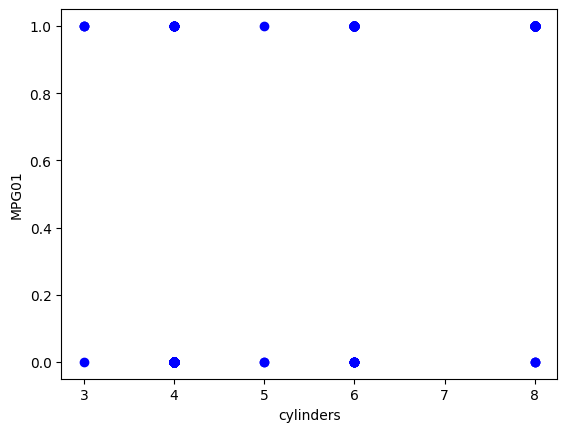

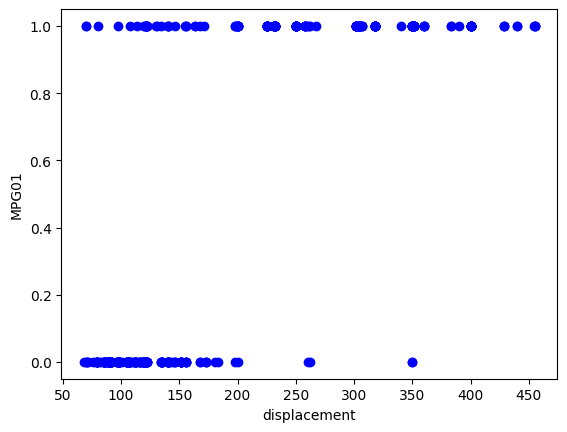

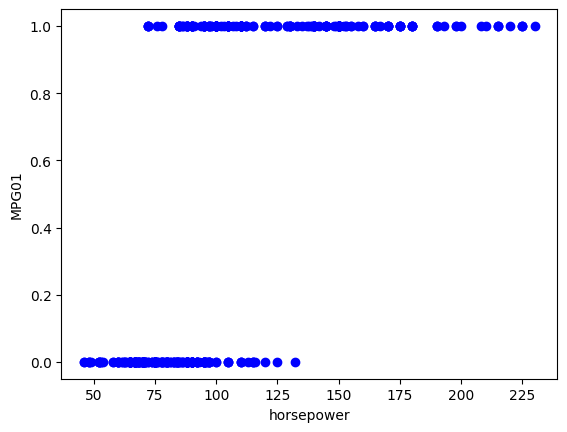

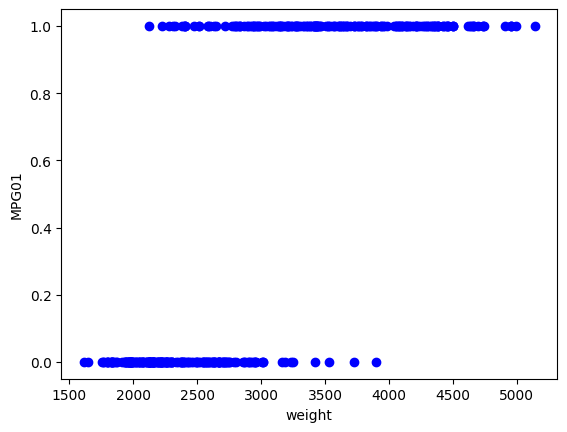

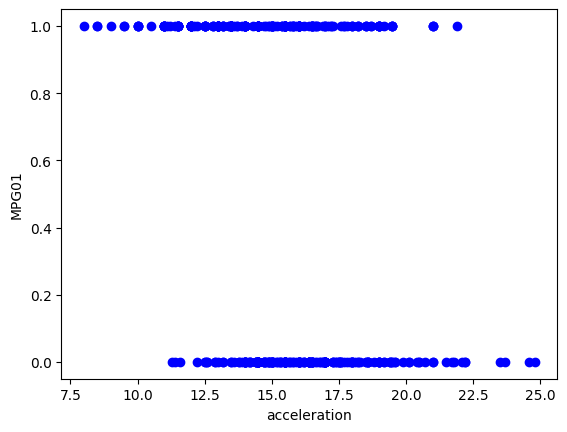

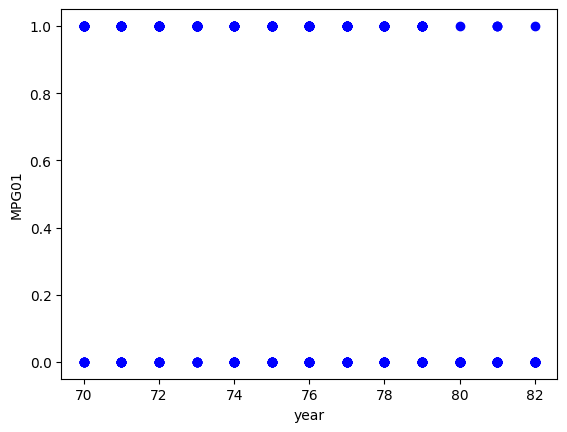

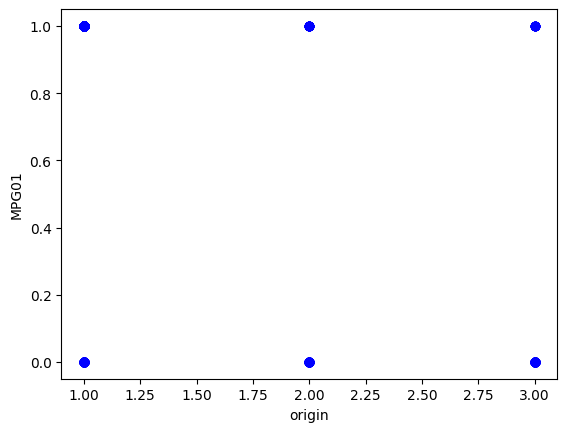

In [ ]:
for col in Auto.columns.drop(['mpg', 'mpg01','name']):
  plt.scatter(Auto[col], Auto['mpg01'], color='b')

  plt.xlabel(col)
  plt.ylabel('MPG01')

  plt.show()

In [ ]:
X = Auto.drop(['mpg', 'mpg01','name'], axis=1)
y = Auto['mpg01']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=Auto['mpg01'])


feature_df = X_train
scaler = StandardScaler(with_mean=True,
with_std=True,
copy=True)
scaler.fit(feature_df)
X_std = scaler.transform(feature_df)
lda = LDA(store_covariance=True)
lda.fit(X_train, y_train)
lda_pred = lda.predict(X_test)
print(confusion_table(lda_pred, y_test))
from sklearn.metrics import classification_report
print(accuracy_score(y_test, lda_pred))

print(classification_report(lda_pred, y_test))

Truth      False  True 
Predicted              
False          0      0
True          39     40
0.5063291139240507
              precision    recall  f1-score   support

       False       0.00      0.00      0.00         0
        True       1.00      0.51      0.67        79

    accuracy                           0.51        79
   macro avg       0.50      0.25      0.34        79
weighted avg       1.00      0.51      0.67        79



/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_

In [ ]:
qda = QDA(store_covariance=True)
qda.fit(X_train, y_train)
qda_pred = qda.predict(X_test)
print(confusion_table(qda_pred, y_test))
print(accuracy_score(y_test, qda_pred))
classification_report(qda_pred, y_test)

Truth      False  True 
Predicted              
False         37      3
True           3     36
0.9240506329113924


'              precision    recall  f1-score   support\n\n       False       0.93      0.93      0.93        40\n        True       0.92      0.92      0.92        39\n\n    accuracy                           0.92        79\n   macro avg       0.92      0.92      0.92        79\nweighted avg       0.92      0.92      0.92        79\n'

In [ ]:
logit = LogisticRegression(C=1e10, solver='liblinear')
logit.fit(X_std, y_train)
y_pred = logit.predict(scaler.fit_transform(X_test))
print(accuracy_score(y_test, y_pred))
confMat = confusion_matrix(y_test, y_pred)
print(confMat)

0.8227848101265823
[[31  8]
 [ 6 34]]


In [ ]:
NB = GaussianNB()
NB.fit(X_train, y_train)
nb_labels = NB.predict(X_test)
print(1-accuracy_score(y_test, nb_labels))

confusion_table(nb_labels, y_test)


0.05063291139240511


Truth,False,True
Predicted,,
False,38,3
True,1,37


In [ ]:
knn1 = KNeighborsClassifier(n_neighbors=10)
knn1.fit(X_train, y_train)
knn1_pred = knn1.predict(X_test)
print(1-accuracy_score(y_test, knn1_pred))
print(confusion_table(knn1_pred, y_test))
classification_report(knn1_pred, y_test)
# tried several values for n_neighbors, it leveled off after 10 at .94936 in terms of accuracy

0.05063291139240511
Truth      False  True 
Predicted              
False         39      4
True           0     36


'              precision    recall  f1-score   support\n\n       False       1.00      0.91      0.95        43\n        True       0.90      1.00      0.95        36\n\n    accuracy                           0.95        79\n   macro avg       0.95      0.95      0.95        79\nweighted avg       0.95      0.95      0.95        79\n'

15.

In [ ]:
# a.
def Power():
  print(2**3)
Power()

# b.
def Power2(x, a):
  print(x**a)
Power2(3,8)

8
6561


In [ ]:
# c.
Power2(10,3)
Power2(8,17)
Power2(131,3)

1000
2251799813685248
2248091


In [ ]:
# d.
def Power3(x,a):
  result = x**a
  return result

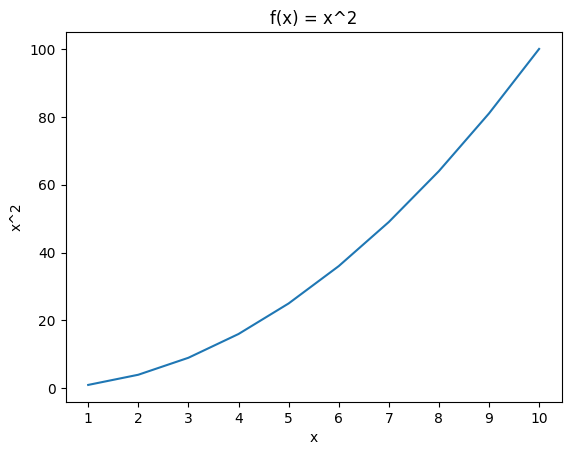

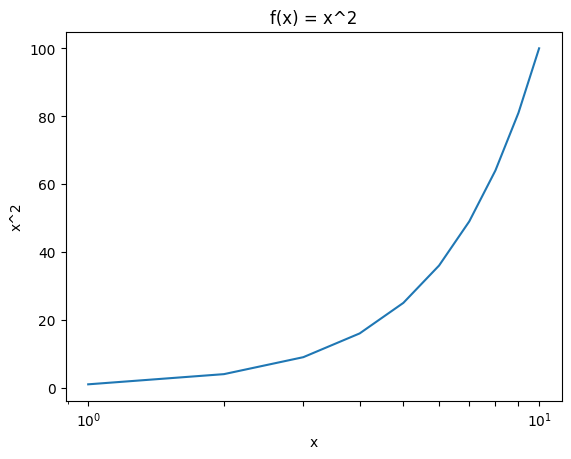

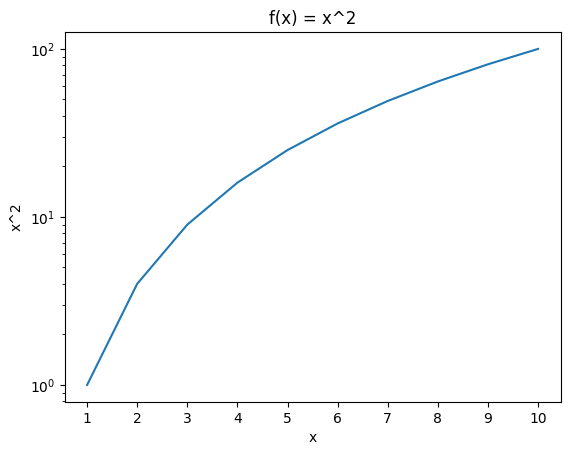

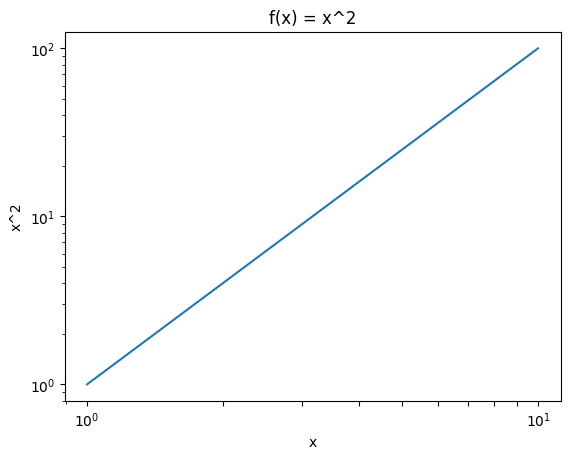

In [ ]:
# e.
x_data = list(range(1,11))
y_data = [Power3(x, 2) for x in x_data]

plt.plot(x_data, y_data)
plt.xlabel('x')
plt.ylabel('x^2')
plt.title('f(x) = x^2')
plt.xticks(range(1,11))
plt.show()

plt.plot(x_data, y_data)
plt.xlabel('x')
plt.ylabel('x^2')
plt.title('f(x) = x^2')
plt.xscale('log')
plt.xticks(range(1,11))
plt.show()

plt.plot(x_data, y_data)
plt.xlabel('x')
plt.ylabel('x^2')
plt.title('f(x) = x^2')
plt.yscale('log')
plt.xticks(range(1,11))
plt.show()

plt.plot(x_data, y_data)
plt.xlabel('x')
plt.ylabel('x^2')
plt.title('f(x) = x^2')
plt.xscale('log')
plt.yscale('log')
plt.xticks(range(1,11))
plt.show()

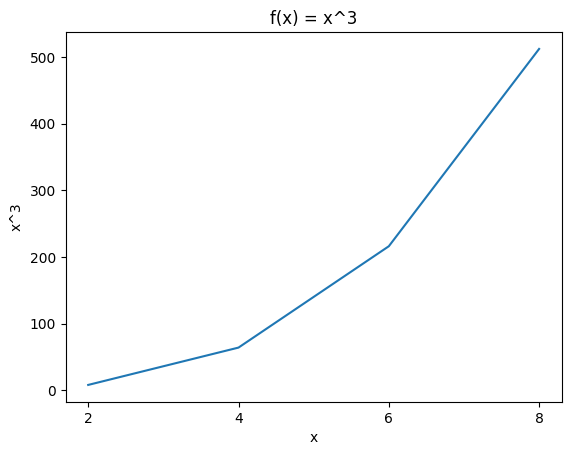

In [ ]:
def PlotPower(x_list, a):
  x_data = x_list
  y_data = [Power3(x, a) for x in x_data]

  plt.plot(x_data, y_data)
  plt.xlabel('x')
  plt.ylabel(f'x^{a}')
  plt.title(f'f(x) = x^{a}')
  plt.xticks(x_list)
  plt.show()
PlotPower(list(range(2,10,2)), 3)

# Chapter 5 Lab

In [ ]:
import numpy as np
import statsmodels.api as sm
from ISLP import load_data
from ISLP.models import (ModelSpec as MS,
summarize,
poly)
from sklearn.model_selection import train_test_split

from functools import partial
from sklearn.model_selection import \
(cross_validate,
KFold,
ShuffleSplit)
from sklearn.base import clone
from ISLP.models import sklearn_sm

In [ ]:
Auto = load_data('Auto')
Auto_train, Auto_valid = train_test_split(Auto,
test_size=196,
random_state=0)

In [ ]:
hp_mm = MS(['horsepower'])
X_train = hp_mm.fit_transform(Auto_train)
y_train = Auto_train['mpg']
model = sm.OLS(y_train, X_train)
results = model.fit()

In [ ]:
X_valid = hp_mm.transform(Auto_valid)
y_valid = Auto_valid['mpg']
valid_pred = results.predict(X_valid)
np.mean((y_valid - valid_pred)**2)

23.61661706966988

In [ ]:
def evalMSE(terms, response, train, test):
  mm = MS(terms)
  X_train = mm.fit_transform(train)
  y_train = train[response]
  X_test = mm.transform(test)
  y_test = test[response]
  results = sm.OLS(y_train, X_train).fit()
  test_pred = results.predict(X_test)
  return np.mean((y_test - test_pred)**2)

In [ ]:
MSE = np.zeros(3)
for idx, degree in enumerate(range(1, 4)):
  MSE[idx] = evalMSE([poly('horsepower', degree)],
  'mpg',
  Auto_train,
  Auto_valid)
MSE

array([23.61661707, 18.76303135, 18.79694163])

In [ ]:
Auto_train, Auto_valid = train_test_split(Auto, test_size=196, random_state=3)
MSE = np.zeros(3)
for idx, degree in enumerate(range(1, 4)):
  MSE[idx] = evalMSE([poly('horsepower', degree)],
  'mpg',
  Auto_train,
  Auto_valid)
MSE

array([20.75540796, 16.94510676, 16.97437833])

In [ ]:
hp_model = sklearn_sm(sm.OLS, MS(['horsepower']))
X, Y = Auto.drop(columns=['mpg']), Auto['mpg']
cv_results = cross_validate(hp_model,
X,
Y,
cv=Auto.shape[0])
cv_err = np.mean(cv_results['test_score'])
cv_err

24.23151351792922

In [ ]:
cv_error = np.zeros(5)
H = np.array(Auto['horsepower'])
M = sklearn_sm(sm.OLS)
for i, d in enumerate(range(1,6)):
  X = np.power.outer(H, np.arange(d+1))
  M_CV = cross_validate(M,
  X,
  Y,
  cv=Auto.shape[0])
  cv_error[i] = np.mean(M_CV['test_score'])
print(cv_error)

[24.23151352 19.24821312 19.33498406 19.42443029 19.03320648]


In [ ]:
A = np.array([3, 5, 9])
B = np.array([2, 4])
np.add.outer(A, B)

array([[ 5,  7],
       [ 7,  9],
       [11, 13]])

In [ ]:
cv_error = np.zeros(5)
cv = KFold(n_splits=10,
          shuffle=True,
          random_state=0) # use same splits for each degree
for i, d in enumerate(range(1,6)):
  X = np.power.outer(H, np.arange(d+1))
  M_CV = cross_validate(M,
  X,
  Y,
  cv=cv)
  cv_error[i] = np.mean(M_CV['test_score'])
cv_error

array([24.20766449, 19.18533142, 19.27626666, 19.47848403, 19.13720065])

In [ ]:
validation = ShuffleSplit(n_splits=1,
                          test_size=196,
                          random_state=0)
results = cross_validate(hp_model,
                          Auto.drop(['mpg'], axis=1),
                          Auto['mpg'],
                          cv=validation);
results['test_score']

array([23.61661707])

In [ ]:
validation = ShuffleSplit(n_splits=10,
                          test_size=196,
                          random_state=0)
results = cross_validate(hp_model,
                          Auto.drop(['mpg'], axis=1),
                          Auto['mpg'],
                          cv=validation)
results['test_score'].mean(), results['test_score'].std()

(23.802232661034168, 1.4218450941091842)

In [ ]:
Portfolio = load_data('Portfolio')
def alpha_func(D, idx):
  cov_ = np.cov(D[['X','Y']].loc[idx], rowvar=False)
  return ((cov_[1,1] - cov_[0,1]) / (cov_[0,0]+cov_[1,1]-2*cov_[0,1]))
alpha_func(Portfolio, range(100))

0.57583207459283

In [ ]:
rng = np.random.default_rng(0)
alpha_func(Portfolio,
          rng.choice(100,
          100,
          replace=True))

0.6074452469619004

In [ ]:
def boot_SE(func,D,n=None,B=1000, seed=0):
  rng = np.random.default_rng(seed)
  first_, second_ = 0, 0
  n = n or D.shape[0]
  for _ in range(B):
    idx = rng.choice(D.index,
                    n,
                    replace=True)
    value = func(D, idx)
    first_ += value
    second_ += value**2
  return np.sqrt(second_ / B - (first_ / B)**2)
alpha_SE = boot_SE(alpha_func,
                  Portfolio,
                  B=1000,
                  seed=0)
alpha_SE

0.09118176521277699

In [ ]:
def boot_OLS(model_matrix, response, D, idx):
  D_ = D.loc[idx]
  Y_ = D_[response]
  X_ = clone(model_matrix).fit_transform(D_)
  return sm.OLS(Y_, X_).fit().params
hp_func = partial(boot_OLS, MS(['horsepower']), 'mpg')
rng = np.random.default_rng(0)
np.array([hp_func(Auto,
          rng.choice(392,
          392,
          replace=True)) for _ in range(10)])

array([[39.88064456, -0.1567849 ],
       [38.73298691, -0.14699495],
       [38.31734657, -0.14442683],
       [39.91446826, -0.15782234],
       [39.43349349, -0.15072702],
       [40.36629857, -0.15912217],
       [39.62334517, -0.15449117],
       [39.0580588 , -0.14952908],
       [38.66688437, -0.14521037],
       [39.64280792, -0.15555698]])

In [ ]:
hp_se = boot_SE(hp_func,
                Auto,
                B=1000,
                seed=10)
hp_se

intercept     0.848807
horsepower    0.007352
dtype: float64

In [ ]:
hp_model.fit(Auto, Auto['mpg'])
model_se = summarize(hp_model.results_)['std err']
model_se

intercept     0.717
horsepower    0.006
Name: std err, dtype: float64

In [ ]:
quad_model = MS([poly('horsepower', 2, raw=True)])
quad_func = partial(boot_OLS,
                    quad_model,
                    'mpg')
boot_SE(quad_func, Auto, B=1000)

intercept                                  2.067840
poly(horsepower, degree=2, raw=True)[0]    0.033019
poly(horsepower, degree=2, raw=True)[1]    0.000120
dtype: float64

In [ ]:
M = sm.OLS(Auto['mpg'],
quad_model.fit_transform(Auto))
summarize(M.fit())['std err']

intercept                                  1.800
poly(horsepower, degree=2, raw=True)[0]    0.031
poly(horsepower, degree=2, raw=True)[1]    0.000
Name: std err, dtype: float64

# Chapter 5 Exercises

In [ ]:
Default = load_data('Default')
Default.head()
y.head()

0    No
1    No
2    No
3    No
4    No
Name: default, dtype: object

In [ ]:
from ISLP import confusion_table
from sklearn.linear_model import LogisticRegression

X = Default[["balance", "income"]]
y = Default["default"]
model = LogisticRegression(penalty = "none")
model.fit(X, y)
model.coef_

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


array([[5.64710291e-03, 2.08089921e-05]])

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, LeaveOneOut, KFold

# 90 - 10
X_train, X_test, y_train, y_test = train_test_split(Default[["balance", "income"]], Default["default"],
                                                   test_size = 0.1, random_state = 240)

model.fit(X_train, y_train)
print(1 - model.score(X_test, y_test))

# 75 - 25
X_train, X_test, y_train, y_test = train_test_split(Default[["balance", "income"]], Default["default"],
                                                   test_size = 0.25, random_state = 240)

model.fit(X_train, y_train)
print(1 - model.score(X_test, y_test))

# 50 - 50
X_train, X_test, y_train, y_test = train_test_split(Default[["balance", "income"]], Default["default"],
                                                   test_size = 0.5, random_state = 240)

model.fit(X_train, y_train)
print(1 - model.score(X_test, y_test))

# Interesting that it was lowest for the 90-10 split, then for the two subsequent models, it performed worse, but not in a
# linear way as I'd expect (that the 50-50 split would have greater error than 75-25)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


0.02300000000000002
0.03600000000000003
0.03600000000000003


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


In [ ]:
Default["student"] = Default["student"].map({"Yes":1,"No":0})

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(Default[["balance", "income", "student"]], Default["default"],
                                                   test_size = 0.1, random_state = 240)

model.fit(X_train, y_train)
print(1 - model.score(X_test, y_test))
# performs slightly worse than without "student" column

0.03400000000000003


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


In [ ]:
Default = load_data('Default')

Default_train, Default_valid = train_test_split(Default,
test_size=196,
random_state=0)

X_train = Default_train[['balance', 'income']]
y_train = Default_train['default'].map({"Yes": 1, "No": 0})
glm = sm.GLM(y_train,
X_train,
family=sm.families.Binomial())
results = glm.fit()
X_valid = Default_valid[['balance', 'income']]
y_valid = Default_valid['default'].map({"Yes": 1, "No": 0})
valid_pred = results.predict(X_valid)
labels = np.array(['No']*Default_valid.shape[0])
labels[valid_pred >0.5] = "Yes"
confusion_table(labels, valid_pred > .5)

Truth,False,No
Predicted,,
False,0,0
No,0,0


In [ ]:
from sklearn.preprocessing import StandardScaler
Default = load_data('Default')
print(Default['default'].value_counts())

allvars = Default.columns.drop(['default', 'student'])
design = MS(allvars)
X = design.fit_transform(Default)
y = Default.default.map({"Yes": 1, "No": 0})

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
print(y_train)

feature_df = X_train
scaler = StandardScaler(with_mean=True,
with_std=True,
copy=True)
scaler.fit(feature_df)
X_std = scaler.transform(X_train)
glm = sm.GLM(y_train,
X_std,
family=sm.families.Binomial())
results = glm.fit()
probs = results.predict(scaler.transform(X_test))
labels = np.array([0]*X_test.shape[0])
labels[probs >0.5] = 1
summary = summarize(results)
print(summary['coef'][1:3])

No     9667
Yes     333
Name: default, dtype: int64
7761    0
6369    0
8177    0
2253    0
3686    0
       ..
6812    0
4276    0
9258    0
1390    0
4444    0
Name: default, Length: 8000, dtype: int64
x1    0.2598
x2    0.0245
Name: coef, dtype: float64


In [ ]:
from sklearn.base import clone
def boot_fn(data, idx):

  data_train, data_valid = train_test_split(data, test_size=idx, random_state=3)
  allvars = data_train.columns.drop(['default', 'student'])
  design = MS(allvars)
  X = design.fit_transform(data_train)
  y = data_train.default.map({"Yes": 1, "No": 0})


  feature_df = X
  scaler = StandardScaler(with_mean=True,
  with_std=True,
  copy=True)
  scaler.fit(feature_df)
  X_std = scaler.transform(X)
  glm = sm.GLM(y,
  X_std,
  family=sm.families.Binomial())
  results = glm.fit()
  summary = summarize(results)
  return f"Coefficients: {summary['coef'][1:3]}      Error: {summary['std err'][1:3]}"
boot_fn(Default, 500)

'Coefficients: x1    0.2608\nx2    0.0248\nName: coef, dtype: float64      Error: x1    0.021\nx2    0.021\nName: std err, dtype: float64'

# Chapter 7 Lab

In [ ]:
import numpy as np, pandas as pd
from matplotlib.pyplot import subplots
import statsmodels.api as sm
from ISLP import load_data
from ISLP.models import (summarize,
poly,
ModelSpec as MS)
from statsmodels.stats.anova import anova_lm

from pygam import (s as s_gam,
                  l as l_gam,
                  f as f_gam,
                  LinearGAM,
                  LogisticGAM)
from ISLP.transforms import (BSpline, NaturalSpline)
from ISLP.models import bs, ns
from ISLP.pygam import (approx_lam, degrees_of_freedom, plot as plot_gam, anova as anova_gam)

In [ ]:
Wage = load_data('Wage')
y = Wage['wage']
age = Wage['age']

In [ ]:
poly_age = MS([poly('age', degree=4)]).fit(Wage)
M = sm.OLS(y, poly_age.transform(Wage)).fit()
summarize(M)

,coef,std err,t,P>|t|
intercept,111.7036,0.729,153.283,0.000
"poly(age, degree=4)[0]",447.0679,39.915,11.201,0.000
"poly(age, degree=4)[1]",-478.3158,39.915,-11.983,0.000
"poly(age, degree=4)[2]",125.5217,39.915,3.145,0.002
"poly(age, degree=4)[3]",-77.9112,39.915,-1.952,0.051


In [ ]:
age_grid = np.linspace(age.min(), age.max(), 100)
age_df = pd.DataFrame({'age': age_grid})

<Axes: title={'center': 'Degree-4 Polynomial'}, xlabel='Age', ylabel='Wage'>

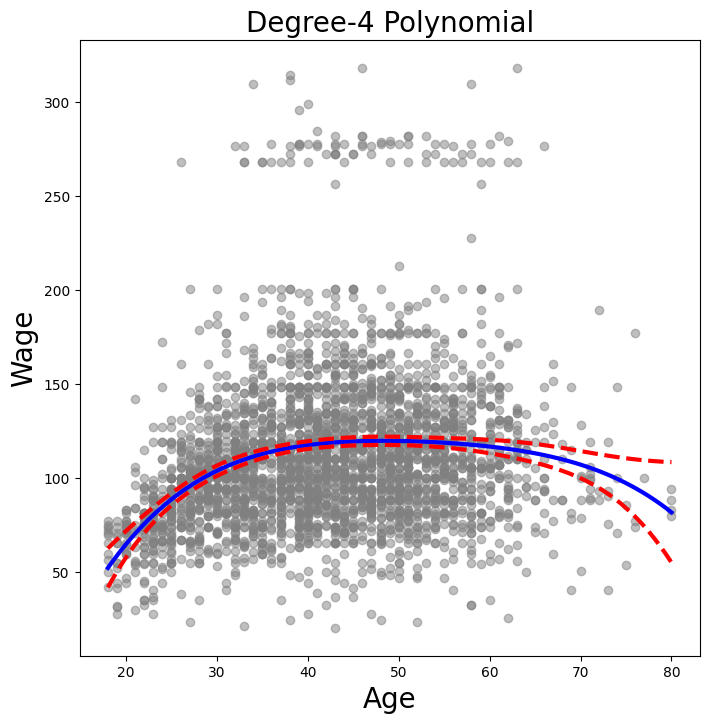

In [ ]:
def plot_wage_fit(age_df, basis, title):
  X = basis.transform(Wage)
  Xnew = basis.transform(age_df)
  M = sm.OLS(y, X).fit()
  preds = M.get_prediction(Xnew)
  bands = preds.conf_int(alpha=0.05)
  fig, ax = subplots(figsize=(8,8))
  ax.scatter(age, y, facecolor='gray', alpha=0.5)
  for val, ls in zip([preds.predicted_mean , bands[:,0], bands[:,1]], ['b','r--','r--']):
    ax.plot(age_df.values, val, ls, linewidth=3)
  ax.set_title(title, fontsize=20)
  ax.set_xlabel('Age', fontsize=20)
  ax.set_ylabel('Wage', fontsize=20)
  return ax

plot_wage_fit(age_df, poly_age, 'Degree-4 Polynomial')

In [ ]:
models = [MS([poly('age', degree=d)]) for d in range(1, 6)]
Xs = [model.fit_transform(Wage) for model in models]
anova_lm(*[sm.OLS(y, X_).fit() for X_ in Xs])

,df_resid,ssr,df_diff,ss_diff,F,Pr(>F)
0,2998.0,5.022216e+06,0.0,NaN,NaN,NaN
1,2997.0,4.793430e+06,1.0,228786.010128,143.593107,2.363850e-32
2,2996.0,4.777674e+06,1.0,15755.693664,9.888756,1.679202e-03
3,2995.0,4.771604e+06,1.0,6070.152124,3.809813,5.104620e-02
4,2994.0,4.770322e+06,1.0,1282.563017,0.804976,3.696820e-01


In [ ]:
summarize(M)

,coef,std err,t,P>|t|
intercept,111.7036,0.729,153.283,0.000
"poly(age, degree=4)[0]",447.0679,39.915,11.201,0.000
"poly(age, degree=4)[1]",-478.3158,39.915,-11.983,0.000
"poly(age, degree=4)[2]",125.5217,39.915,3.145,0.002
"poly(age, degree=4)[3]",-77.9112,39.915,-1.952,0.051


In [ ]:
models = [MS(['education', poly('age', degree=d)])
for d in range(1, 4)]
XEs = [model.fit_transform(Wage)
for model in models]
anova_lm(*[sm.OLS(y, X_).fit() for X_ in XEs])

,df_resid,ssr,df_diff,ss_diff,F,Pr(>F)
0,2997.0,3.902335e+06,0.0,NaN,NaN,NaN
1,2996.0,3.759472e+06,1.0,142862.701185,113.991883,3.838075e-26
2,2995.0,3.753546e+06,1.0,5926.207070,4.728593,2.974318e-02


In [ ]:
X = poly_age.transform(Wage)
high_earn = Wage['high_earn'] = y > 250 # shorthand
glm = sm.GLM(y > 250,
X,
family=sm.families.Binomial())
B = glm.fit()
summarize(B)

,coef,std err,z,P>|z|
intercept,-4.3012,0.345,-12.457,0.000
"poly(age, degree=4)[0]",71.9642,26.133,2.754,0.006
"poly(age, degree=4)[1]",-85.7729,35.929,-2.387,0.017
"poly(age, degree=4)[2]",34.1626,19.697,1.734,0.083
"poly(age, degree=4)[3]",-47.4008,24.105,-1.966,0.049


In [ ]:
newX = poly_age.transform(age_df)
preds = B.get_prediction(newX)
bands = preds.conf_int(alpha=0.05)

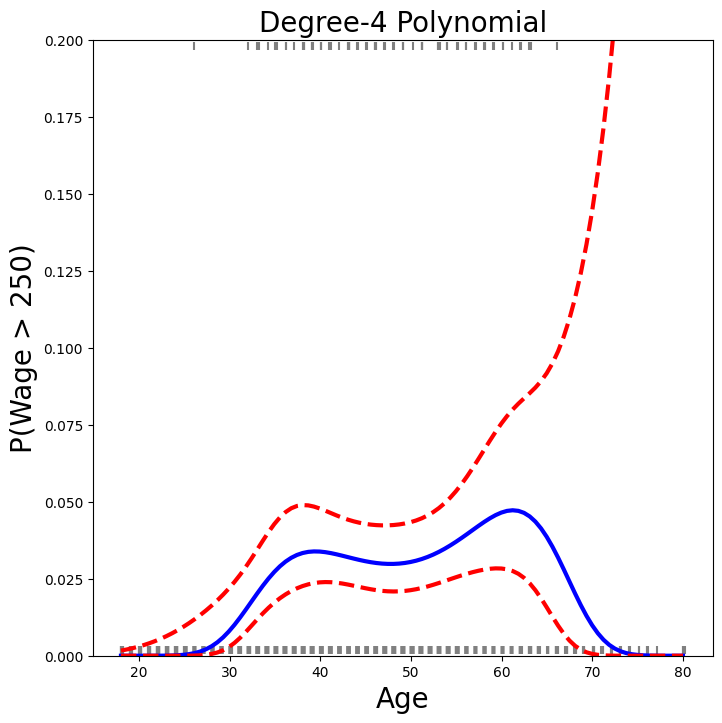

In [ ]:
fig, ax = subplots(figsize=(8,8))
rng = np.random.default_rng(0)
ax.scatter(age + 0.2 * rng.uniform(size=y.shape[0]),
np.where(high_earn, 0.198, 0.002), fc='gray', marker='|')
for val, ls in zip([preds.predicted_mean , bands[:,0], bands[:,1]], ['b','r--','r--']):
  ax.plot(age_df.values, val, ls, linewidth=3)
ax.set_title('Degree-4 Polynomial', fontsize=20)
ax.set_xlabel('Age', fontsize=20)
ax.set_ylim([0,0.2])
ax.set_ylabel('P(Wage > 250)', fontsize=20);

In [ ]:
cut_age = pd.qcut(age, 4)
summarize(sm.OLS(y, pd.get_dummies(cut_age)).fit())

,coef,std err,t,P>|t|
"(17.999, 33.75]",94.1584,1.478,63.692,0.0
"(33.75, 42.0]",116.6608,1.470,79.385,0.0
"(42.0, 51.0]",119.1887,1.416,84.147,0.0
"(51.0, 80.0]",116.5717,1.559,74.751,0.0


In [ ]:
bs_ = BSpline(internal_knots=[25,40,60], intercept=True).fit(age)
bs_age = bs_.transform(age)
bs_age.shape

(3000, 7)

In [ ]:
bs_age = MS([bs('age', internal_knots=[25,40,60])])
Xbs = bs_age.fit_transform(Wage)
M = sm.OLS(y, Xbs).fit()
summarize(M)

,coef,std err,t,P>|t|
intercept,60.4937,9.460,6.394,0.000
"bs(age, internal_knots=[25, 40, 60])[0]",3.9805,12.538,0.317,0.751
"bs(age, internal_knots=[25, 40, 60])[1]",44.6310,9.626,4.636,0.000
"bs(age, internal_knots=[25, 40, 60])[2]",62.8388,10.755,5.843,0.000
"bs(age, internal_knots=[25, 40, 60])[3]",55.9908,10.706,5.230,0.000
"bs(age, internal_knots=[25, 40, 60])[4]",50.6881,14.402,3.520,0.000
"bs(age, internal_knots=[25, 40, 60])[5]",16.6061,19.126,0.868,0.385


In [ ]:
bs_age = MS([bs('age',
internal_knots=[25,40,60],
name='bs(age)')])
Xbs = bs_age.fit_transform(Wage)
M = sm.OLS(y, Xbs).fit()
summarize(M)

,coef,std err,t,P>|t|
intercept,60.4937,9.460,6.394,0.000
bs(age)[0],3.9805,12.538,0.317,0.751
bs(age)[1],44.6310,9.626,4.636,0.000
bs(age)[2],62.8388,10.755,5.843,0.000
bs(age)[3],55.9908,10.706,5.230,0.000
bs(age)[4],50.6881,14.402,3.520,0.000
bs(age)[5],16.6061,19.126,0.868,0.385


In [ ]:
BSpline(df=6).fit(age).internal_knots_

array([33.75, 42.  , 51.  ])

In [ ]:
bs_age0 = MS([bs('age',
df=3,
degree=0)]).fit(Wage)
Xbs0 = bs_age0.transform(Wage)
summarize(sm.OLS(y, Xbs0).fit())

,coef,std err,t,P>|t|
intercept,94.1584,1.478,63.687,0.0
"bs(age, df=3, degree=0)[0]",22.3490,2.152,10.388,0.0
"bs(age, df=3, degree=0)[1]",24.8076,2.044,12.137,0.0
"bs(age, df=3, degree=0)[2]",22.7814,2.087,10.917,0.0


In [ ]:
ns_age = MS([ns('age', df=5)]).fit(Wage)
M_ns = sm.OLS(y, ns_age.transform(Wage)).fit()
summarize(M_ns)

,coef,std err,t,P>|t|
intercept,60.4752,4.708,12.844,0.000
"ns(age, df=5)[0]",61.5267,4.709,13.065,0.000
"ns(age, df=5)[1]",55.6912,5.717,9.741,0.000
"ns(age, df=5)[2]",46.8184,4.948,9.463,0.000
"ns(age, df=5)[3]",83.2036,11.918,6.982,0.000
"ns(age, df=5)[4]",6.8770,9.484,0.725,0.468


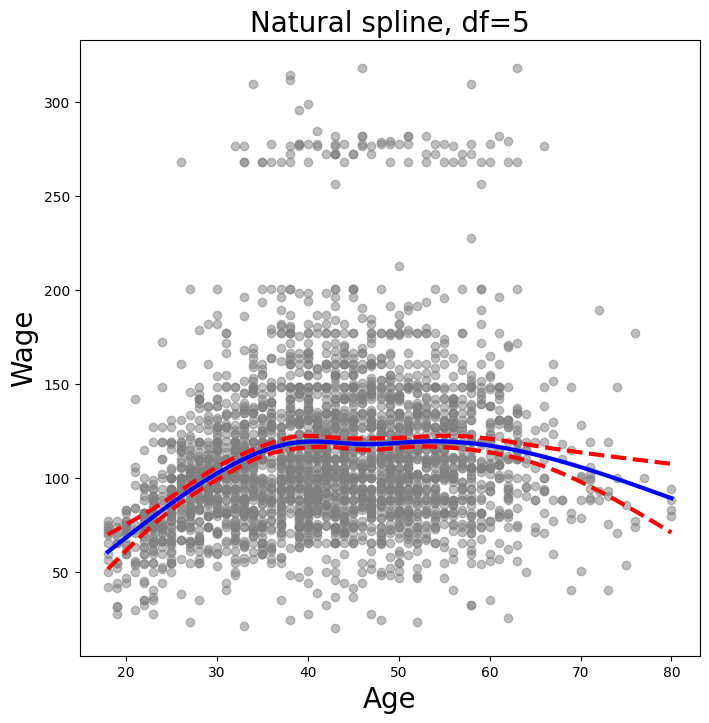

In [ ]:
plot_wage_fit(age_df,
ns_age,
'Natural spline, df=5');

In [ ]:
ns_age = MS([ns('age', df=5)]).fit(Wage)
M_ns = sm.OLS(y, ns_age.transform(Wage)).fit()
summarize(M_ns)

,coef,std err,t,P>|t|
intercept,60.4752,4.708,12.844,0.000
"ns(age, df=5)[0]",61.5267,4.709,13.065,0.000
"ns(age, df=5)[1]",55.6912,5.717,9.741,0.000
"ns(age, df=5)[2]",46.8184,4.948,9.463,0.000
"ns(age, df=5)[3]",83.2036,11.918,6.982,0.000
"ns(age, df=5)[4]",6.8770,9.484,0.725,0.468


<Axes: title={'center': 'Natural spline, df=5'}, xlabel='Age', ylabel='Wage'>

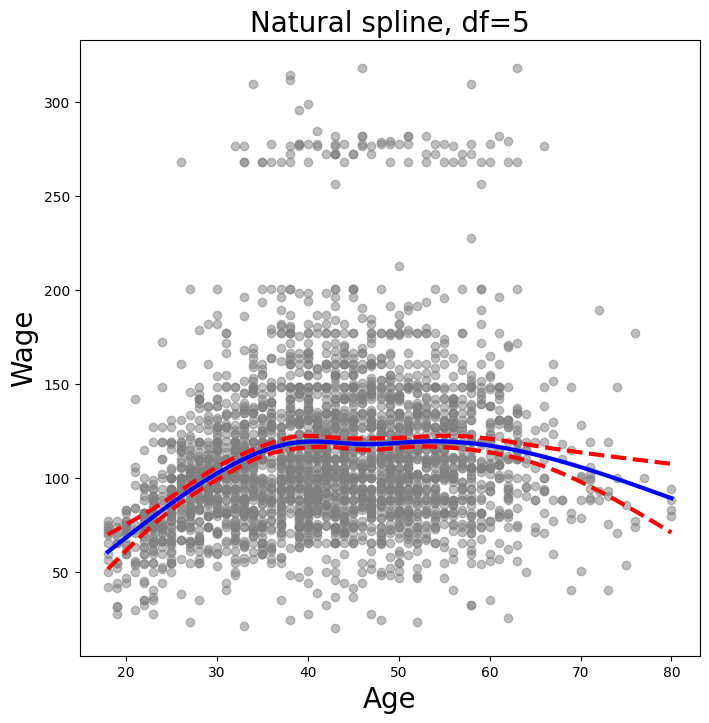

In [ ]:
plot_wage_fit(age_df,ns_age,'Natural spline, df=5')

In [ ]:
X_age = np.asarray(age).reshape((-1,1))
gam = LinearGAM(s_gam(0, lam=0.6))
gam.fit(X_age, y)

LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, terms=s(0) + intercept, tol=0.0001, 
   verbose=False)

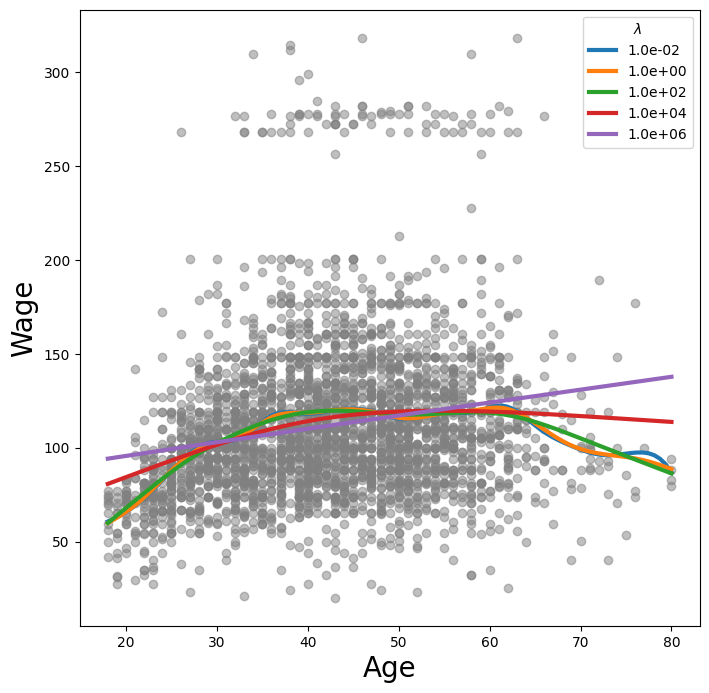

In [ ]:
fig, ax = subplots(figsize=(8,8))
ax.scatter(age, y, facecolor='gray', alpha=0.5)
for lam in np.logspace(-2, 6, 5):
  gam = LinearGAM(s_gam(0, lam=lam)).fit(X_age, y)
  ax.plot(age_grid,
  gam.predict(age_grid),
  label='{:.1e}'.format(lam),
  linewidth=3)
ax.set_xlabel('Age', fontsize=20)
ax.set_ylabel('Wage', fontsize=20)
ax.legend(title='$\lambda$')

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00


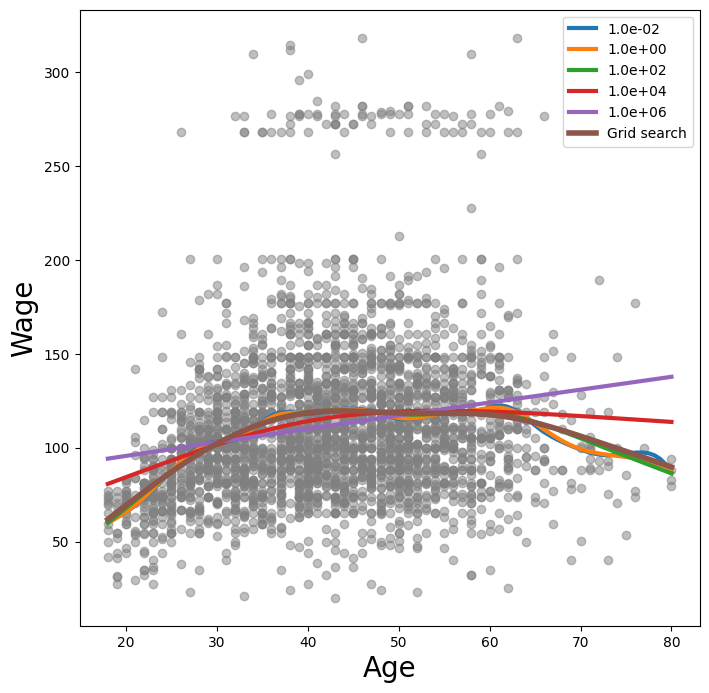

In [ ]:
gam_opt = gam.gridsearch(X_age, y)
ax.plot(age_grid,
gam_opt.predict(age_grid),
label='Grid search',
linewidth=4)
ax.legend()
fig

In [ ]:
age_term = gam.terms[0]
lam_4 = approx_lam(X_age, age_term, 4)
age_term.lam = lam_4
degrees_of_freedom(X_age, age_term)

4.0000001000034

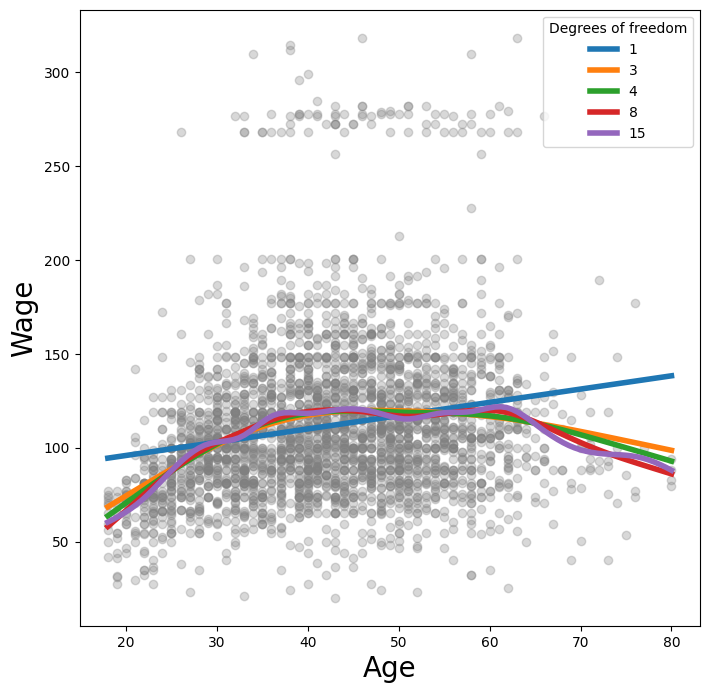

In [ ]:
fig, ax = subplots(figsize=(8,8))
ax.scatter(X_age,
y,
facecolor='gray',
alpha=0.3)
for df in [1,3,4,8,15]:
  lam = approx_lam(X_age, age_term, df+1)
  age_term.lam = lam
  gam.fit(X_age, y)
  ax.plot(age_grid,
  gam.predict(age_grid),
  label='{:d}'.format(df),
  linewidth=4)
ax.set_xlabel('Age', fontsize=20)
ax.set_ylabel('Wage', fontsize=20);
ax.legend(title='Degrees of freedom');

In [ ]:
ns_age = NaturalSpline(df=4).fit(age)
ns_year = NaturalSpline(df=5).fit(Wage['year'])
Xs = [ns_age.transform(age),
ns_year.transform(Wage['year']),
pd.get_dummies(Wage['education']).values]
X_bh = np.hstack(Xs)
gam_bh = sm.OLS(y, X_bh).fit()

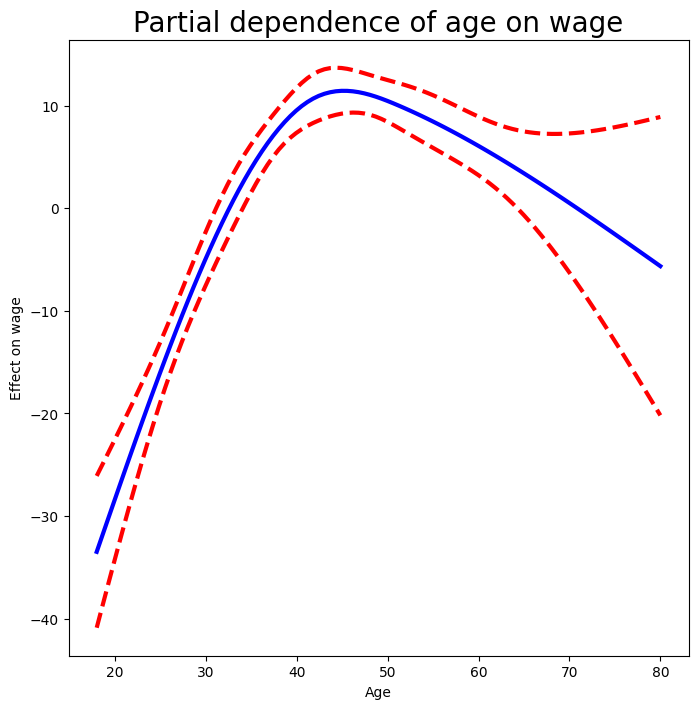

In [ ]:
age_grid = np.linspace(age.min(),
age.max(),
100)
X_age_bh = X_bh.copy()[:100]
X_age_bh[:] = X_bh[:].mean(0)[None,:]
X_age_bh[:,:4] = ns_age.transform(age_grid)
preds = gam_bh.get_prediction(X_age_bh)
bounds_age = preds.conf_int(alpha=0.05)
partial_age = preds.predicted_mean
center = partial_age.mean()
partial_age -= center
bounds_age -= center
fig, ax = subplots(figsize=(8,8))
ax.plot(age_grid, partial_age, 'b', linewidth=3)
ax.plot(age_grid, bounds_age[:,0], 'r--', linewidth=3)
ax.plot(age_grid, bounds_age[:,1], 'r--', linewidth=3)
ax.set_xlabel('Age')
ax.set_ylabel('Effect on wage')
ax.set_title('Partial dependence of age on wage', fontsize=20);

Text(0.5, 1.0, 'Partial dependence of year on wage')

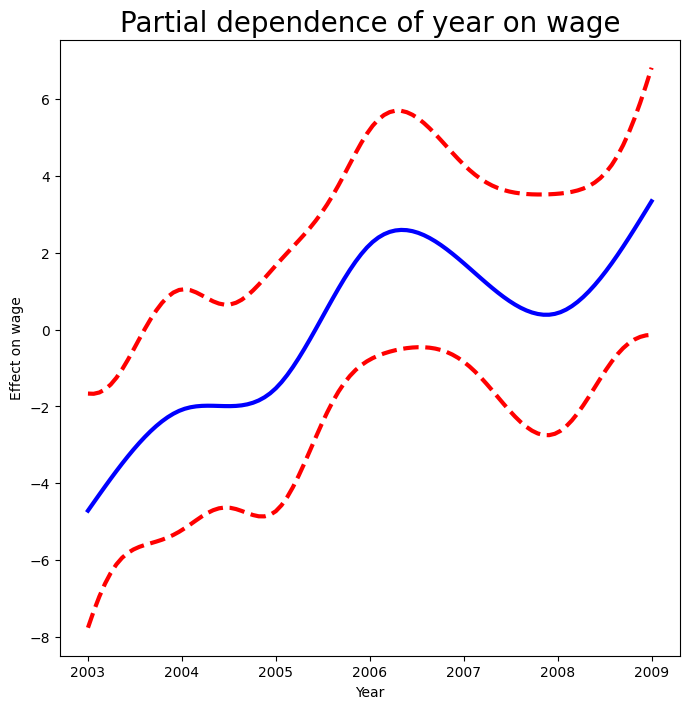

In [ ]:
year_grid = np.linspace(2003, 2009, 100)
year_grid = np.linspace(Wage['year'].min(),
Wage['year'].max(),
100)
X_year_bh = X_bh.copy()[:100]
X_year_bh[:] = X_bh[:].mean(0)[None,:]
X_year_bh[:,4:9] = ns_year.transform(year_grid)
preds = gam_bh.get_prediction(X_year_bh)
bounds_year = preds.conf_int(alpha=0.05)
partial_year = preds.predicted_mean
center = partial_year.mean()
partial_year -= center
bounds_year -= center
fig, ax = subplots(figsize=(8,8))
ax.plot(year_grid, partial_year , 'b', linewidth=3)
ax.plot(year_grid, bounds_year[:,0], 'r--', linewidth=3)
ax.plot(year_grid, bounds_year[:,1], 'r--', linewidth=3)
ax.set_xlabel('Year')
ax.set_ylabel('Effect on wage')
ax.set_title('Partial dependence of year on wage', fontsize=20)

In [ ]:
gam_full = LinearGAM(s_gam(0) +
s_gam(1, n_splines=7) +
f_gam(2, lam=0))
Xgam = np.column_stack([age,
Wage['year'],
Wage['education'].cat.codes])
gam_full = gam_full.fit(Xgam, y)

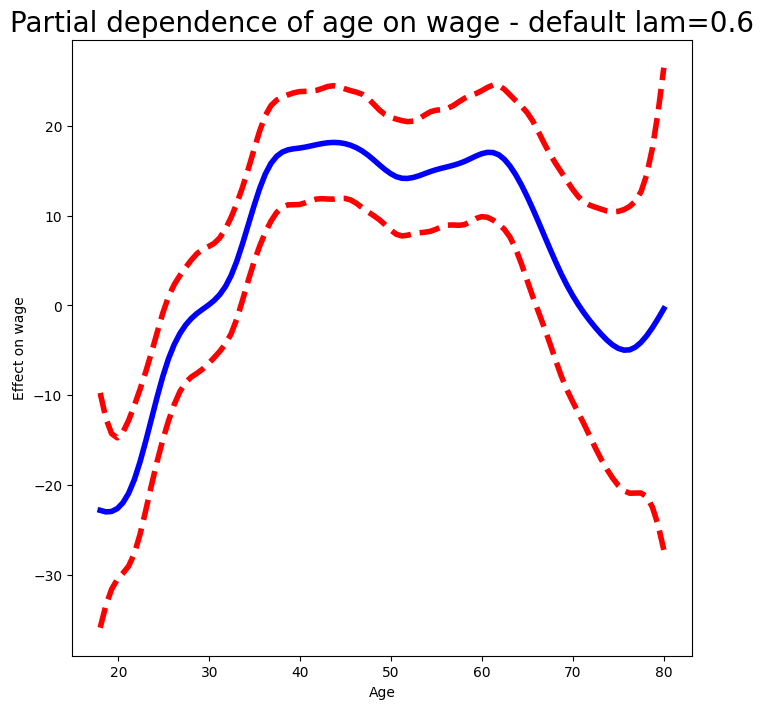

In [ ]:
fig, ax = subplots(figsize=(8,8))
plot_gam(gam_full, 0, ax=ax)
ax.set_xlabel('Age')
ax.set_ylabel('Effect on wage')
ax.set_title('Partial dependence of age on wage - default lam=0.6',
fontsize=20);

In [ ]:
age_term = gam_full.terms[0]
age_term.lam = approx_lam(Xgam, age_term, df=4+1)
year_term = gam_full.terms[1]
year_term.lam = approx_lam(Xgam, year_term, df=4+1)
gam_full = gam_full.fit(Xgam, y)

Text(0.5, 1.0, 'Partial dependence of year on wage')

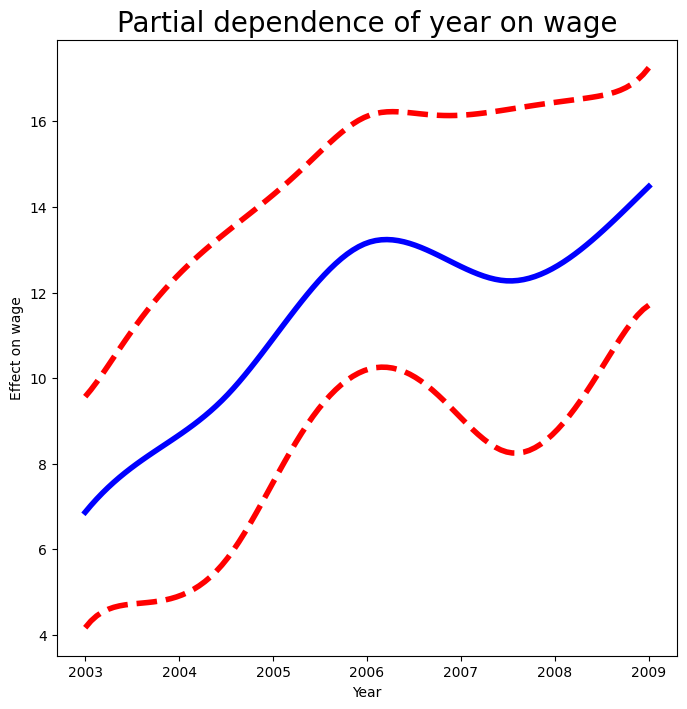

In [ ]:
fig, ax = subplots(figsize=(8,8))
plot_gam(gam_full,
1,
ax=ax)
ax.set_xlabel('Year')
ax.set_ylabel('Effect on wage')
ax.set_title('Partial dependence of year on wage', fontsize=20)

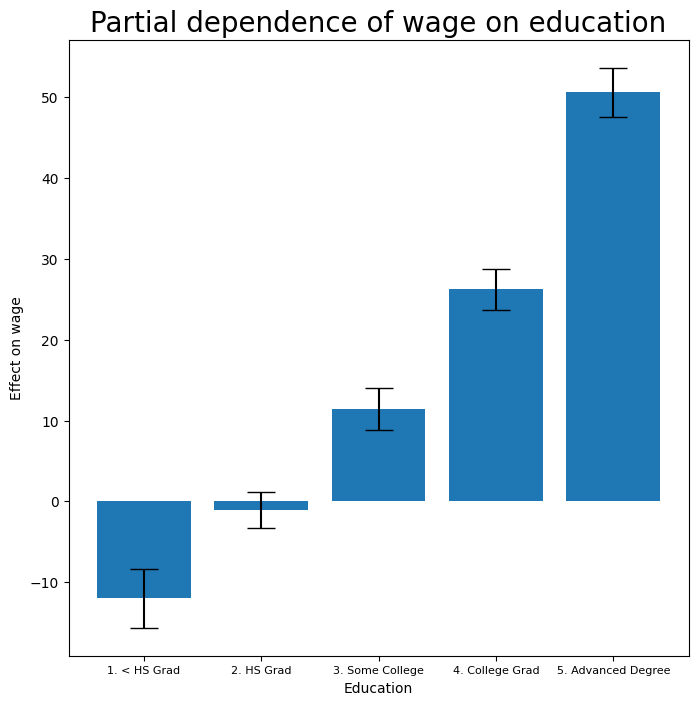

In [ ]:
fig, ax = subplots(figsize=(8, 8))
ax = plot_gam(gam_full, 2)
ax.set_xlabel('Education')
ax.set_ylabel('Effect on wage')
ax.set_title('Partial dependence of wage on education',
fontsize=20);
ax.set_xticklabels(Wage['education'].cat.categories, fontsize=8);

In [ ]:
gam_0 = LinearGAM(age_term + f_gam(2, lam=0))
gam_0.fit(Xgam, y)
gam_linear = LinearGAM(age_term +
l_gam(1, lam=0) +
f_gam(2, lam=0))
gam_linear.fit(Xgam, y)

LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, terms=s(0) + l(1) + f(2) + intercept, 
   tol=0.0001, verbose=False)

In [ ]:
anova_gam(gam_0, gam_linear, gam_full)

,deviance,df,deviance_diff,df_diff,F,pvalue
0,3.714362e+06,2991.004005,NaN,NaN,NaN,NaN
1,3.696746e+06,2990.005190,17616.542840,0.998815,14.265131,0.002314
2,3.693143e+06,2987.007254,3602.893655,2.997936,0.972007,0.435579


In [ ]:
gam_0 = LinearGAM(year_term +
f_gam(2, lam=0))
gam_linear = LinearGAM(l_gam(0, lam=0) +
year_term +
f_gam(2, lam=0))
gam_0.fit(Xgam, y)
gam_linear.fit(Xgam, y)
anova_gam(gam_0, gam_linear, gam_full)

,deviance,df,deviance_diff,df_diff,F,pvalue
0,3.975443e+06,2991.000589,NaN,NaN,NaN,NaN
1,3.850247e+06,2990.000704,125196.137317,0.999884,101.270106,1.681120e-07
2,3.693143e+06,2987.007254,157103.978302,2.993450,42.447812,5.669414e-07


In [ ]:
Yhat = gam_full.predict(Xgam)

In [ ]:
gam_logit = LogisticGAM(age_term +
l_gam(1, lam=0) +
f_gam(2, lam=0))
gam_logit.fit(Xgam, high_earn)

LogisticGAM(callbacks=[Deviance(), Diffs(), Accuracy()], 
   fit_intercept=True, max_iter=100, 
   terms=s(0) + l(1) + f(2) + intercept, tol=0.0001, verbose=False)

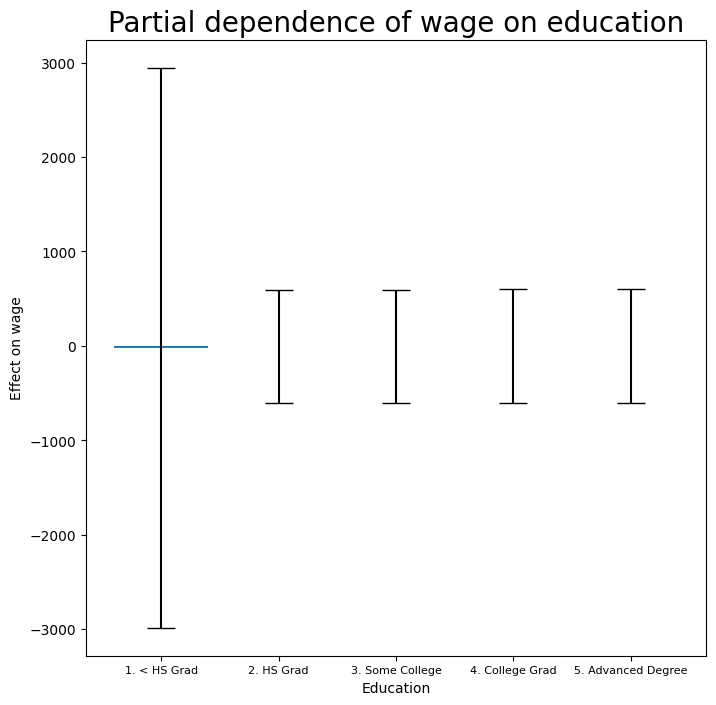

In [ ]:
fig, ax = subplots(figsize=(8, 8))
ax = plot_gam(gam_logit, 2)
ax.set_xlabel('Education')
ax.set_ylabel('Effect on wage')
ax.set_title('Partial dependence of wage on education',
fontsize=20);
ax.set_xticklabels(Wage['education'].cat.categories, fontsize=8);

In [ ]:
only_hs = Wage['education'] == '1. < HS Grad'
Wage_ = Wage.loc[-only_hs]
Xgam_ = np.column_stack([Wage_['age'],
Wage_['year'],
Wage_['education'].cat.codes -1])
high_earn_ = Wage_['high_earn']

In [ ]:
gam_logit_ = LogisticGAM(age_term +
year_term +
f_gam(2, lam=0))
gam_logit_.fit(Xgam_, high_earn_)

LogisticGAM(callbacks=[Deviance(), Diffs(), Accuracy()], 
   fit_intercept=True, max_iter=100, 
   terms=s(0) + s(1) + f(2) + intercept, tol=0.0001, verbose=False)

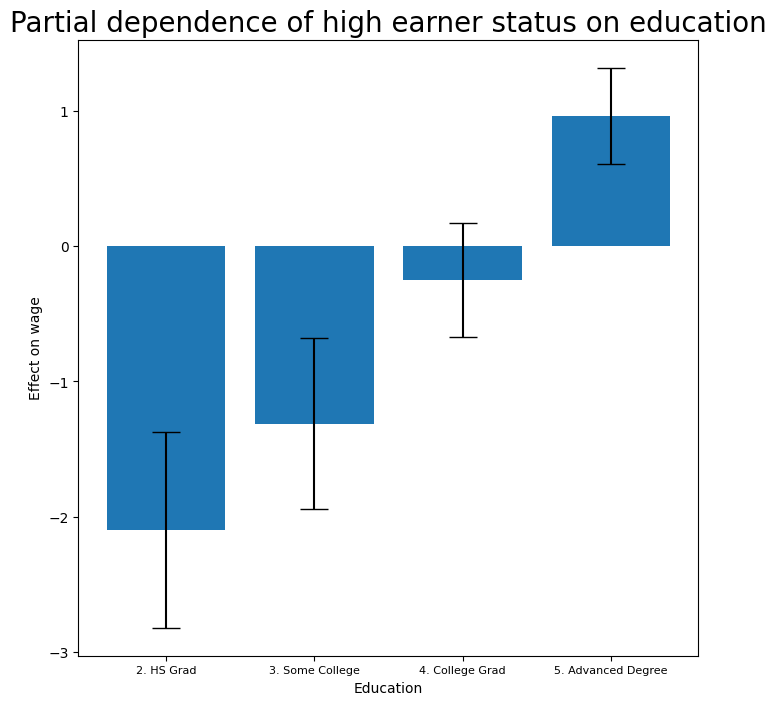

In [ ]:
fig, ax = subplots(figsize=(8, 8))
ax = plot_gam(gam_logit_, 2)
ax.set_xlabel('Education')
ax.set_ylabel('Effect on wage')
ax.set_title('Partial dependence of high earner status on education', fontsize=20);
ax.set_xticklabels(Wage['education'].cat.categories[1:],
fontsize=8);

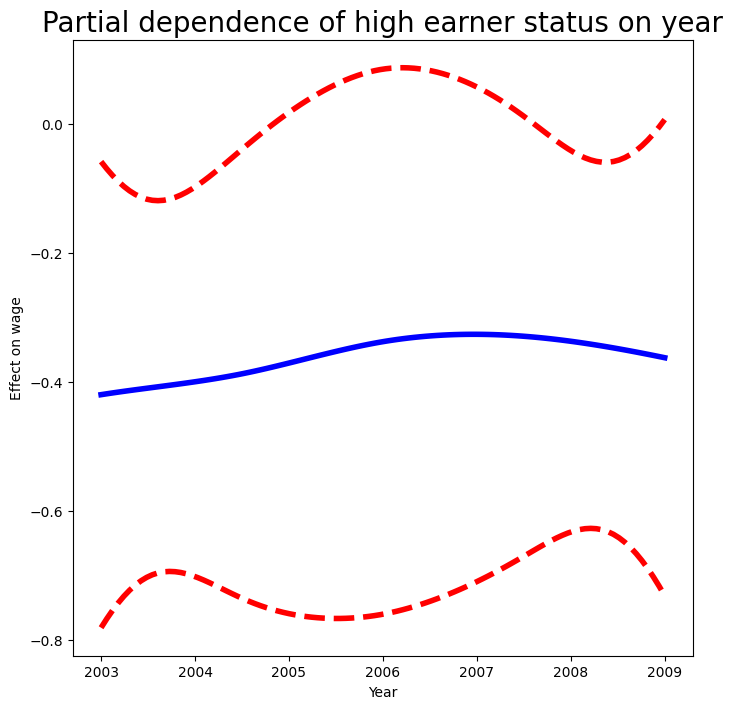

In [ ]:
fig, ax = subplots(figsize=(8, 8))
ax = plot_gam(gam_logit_, 1)
ax.set_xlabel('Year')
ax.set_ylabel('Effect on wage')
ax.set_title('Partial dependence of high earner status on year',
fontsize=20);

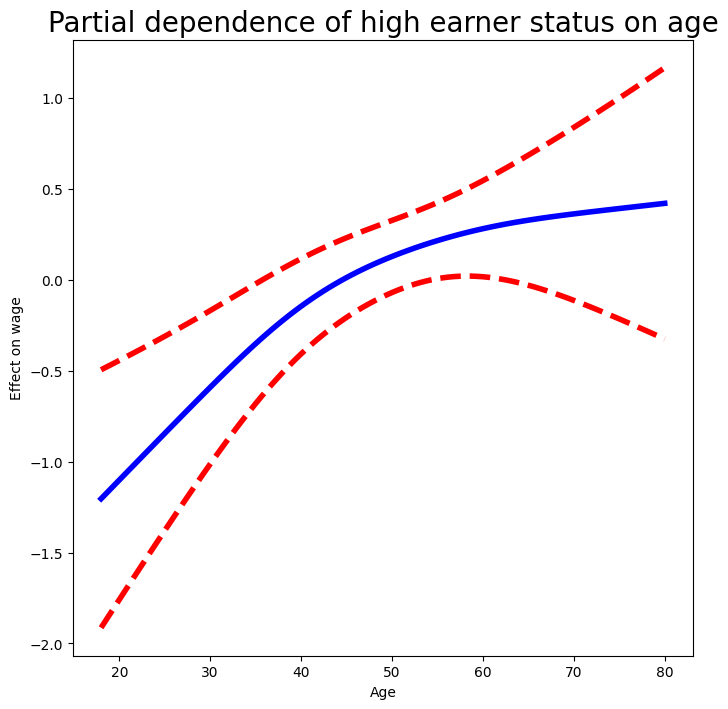

In [ ]:
fig, ax = subplots(figsize=(8, 8))
ax = plot_gam(gam_logit_, 0)
ax.set_xlabel('Age')
ax.set_ylabel('Effect on wage')
ax.set_title('Partial dependence of high earner status on age',
fontsize=20);

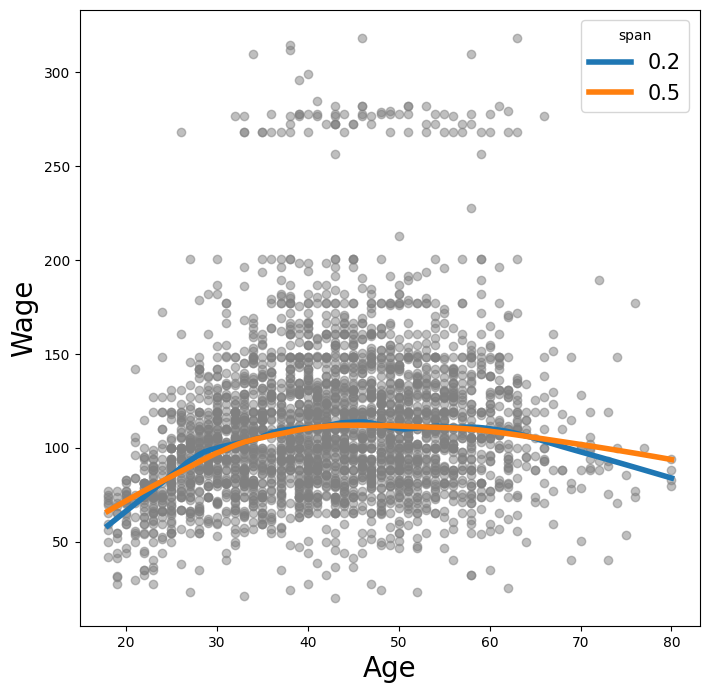

In [ ]:
lowess = sm.nonparametric.lowess
fig, ax = subplots(figsize=(8,8))
ax.scatter(age, y, facecolor='gray', alpha=0.5)
for span in [0.2, 0.5]:
  fitted = lowess(y, age, frac=span, xvals=age_grid)
  ax.plot(age_grid, fitted, label='{:.1f}'.format(span), linewidth=4)
ax.set_xlabel('Age', fontsize=20)
ax.set_ylabel('Wage', fontsize=20);
ax.legend(title='span', fontsize=15);

# Chapter 7 Exercises

1.

a. We can start by setting them equal to each other and substituting the coefficients:
B0 + B1x + B2x^2 + B3x^3 = B0 + B1x + B2x^2 + B3x^3 + B4(x-ξ)^3
then, we cancel out all of the variables on both sides, leaving us with:
0=B4(x-ξ)^3
Going based off their statement:
where (x − ξ)3
 = (x − ξ)3 if x > ξ and equals 0 otherwise
They also state that x < ξ, so that would set the whole term (x-ξ)^3 = 0, which would make the right side of B4(x-ξ)^3=0. This means that our cubic polynomial is simply f(x) with the last B4(x-ξ)^3 term removed is our answer, or B0 + B1x + B2x^2 + B3x^3

b. Following the same logic, we would have a2 = B0 + B4(x-ξ)^3 and all the other constants equal to their b counterparts (b2=B2, c2 = B3, etc)

c. We can take the limit of this expression using simple substitution. We can see that the B4 term in the f2(x) function zeros out, considering the (x-ξ)^3 works out to (ξ-ξ)^3. When we substitute the rest of the x's with ξ, we get an equality of
B0 + B1ξ + B2ξ^2 + B3ξ^3 = B0 + B1ξ + B2ξ^2 + B3ξ^3

d. We can see that the original equation works out to an equality, and taking the derivative of 2 equal functions would result in another equality. d/dx(B0 + B1x + B2x^2 + B3x^3) = B1 + 2B2x + 3B3x^2
**Substitute ξ into x**
B1 + 2B2ξ + 3B3ξ^2

e. same logic as above


In [ ]:
import numpy as np, pandas as pd
from matplotlib.pyplot import subplots
import statsmodels.api as sm
from ISLP import load_data
from ISLP.models import (summarize,
poly,
ModelSpec as MS)
from statsmodels.stats.anova import anova_lm
from pygam import (s as s_gam,
l as l_gam,
f as f_gam,
LinearGAM,
LogisticGAM)
from ISLP.transforms import (BSpline,
NaturalSpline)
from ISLP.models import bs, ns
from ISLP.pygam import (approx_lam,
degrees_of_freedom,
plot as plot_gam,
anova as anova_gam)

In [ ]:
# 6.
from functools import partial
from sklearn.model_selection import \
(cross_validate,
KFold,
ShuffleSplit)
from sklearn.base import clone
from ISLP.models import sklearn_sm
Wage = load_data('Wage')
y = Wage['wage']
age = Wage['age']
poly_age = MS([poly('age', degree=4)]).fit_transform(Wage)
print(poly_age)
M = sm.OLS(y, poly_age).fit()


wage_model = sklearn_sm(sm.OLS)
X, Y = poly_age, Wage['wage']
cv_results = cross_validate(wage_model, X, Y, cv=Wage.shape[0])
print(cv_results)


      intercept  poly(age, degree=4)[0]  poly(age, degree=4)[1]  \
0           1.0               -0.038625                0.055909   
1           1.0               -0.029133                0.026298   
2           1.0                0.004090               -0.014507   
3           1.0                0.000926               -0.014831   
4           1.0                0.012000               -0.009816   
...         ...                     ...                     ...   
2995        1.0                0.002508               -0.014780   
2996        1.0               -0.019640                0.004666   
2997        1.0               -0.024387                0.014485   
2998        1.0               -0.024387                0.014485   
2999        1.0                0.019910                0.000416   

      poly(age, degree=4)[2]  poly(age, degree=4)[3]  
0                  -0.071741                0.086730  
1                  -0.014550               -0.002599  
2                  -0.000133  

In [ ]:
def plot_wage_fit(age_df,basis,title):
  X = basis.transform(Wage)
  Xnew = basis.transform(age_df)
  M = sm.OLS(y, X).fit()
  preds = M.get_prediction(Xnew)
  bands = preds.conf_int(alpha=0.05)
  fig, ax = subplots(figsize=(8,8))
  ax.scatter(age, y, facecolor='gray', alpha=0.5)
  for val, ls in zip([preds.predicted_mean , bands[:,0], bands[:,1]], ['b','r--','r--']):
    ax.plot(age_df.values, val, ls, linewidth=3)
  ax.set_title(title, fontsize=20)
  ax.set_xlabel('Age', fontsize=20)
  ax.set_ylabel('Wage', fontsize=20);
  return ax

In [ ]:
cv_err = np.mean(cv_results['test_score'])
cv_err

1594.5958669712531

In [ ]:
cv_error = np.zeros(5)
W = np.array(Wage['wage'])
M = sklearn_sm(sm.OLS)
for i, d in enumerate(range(1,6)):
  X = np.power.outer(W, np.arange(d+1))
  M_CV = cross_validate(M,
  X,
  Y,
  cv=Wage.shape[0])
  cv_error[i] = np.mean(M_CV['test_score'])
cv_error

KeyboardInterrupt: ignored

In [ ]:
# models = [MS(['wage', poly('age', degree=d)]) for d in range(1, 6)]
# XEs = [model.fit_transform(Wage) for model in models]
# anova_lm(*[sm.OLS(y, X_).fit() for X_ in XEs])

models = [MS([poly('age', degree=d)]) for d in range(1, 6)]
Xs = [model.fit_transform(Wage) for model in models]
anova_lm(*[sm.OLS(y, X_).fit() for X_ in Xs])

# Degree 1 has the 2nd lowest test error rate and the lowest p-value

,df_resid,ssr,df_diff,ss_diff,F,Pr(>F)
0,2998.0,5.022216e+06,0.0,NaN,NaN,NaN
1,2997.0,4.793430e+06,1.0,228786.010128,143.593107,2.363850e-32
2,2996.0,4.777674e+06,1.0,15755.693664,9.888756,1.679202e-03
3,2995.0,4.771604e+06,1.0,6070.152124,3.809813,5.104620e-02
4,2994.0,4.770322e+06,1.0,1282.563017,0.804976,3.696820e-01


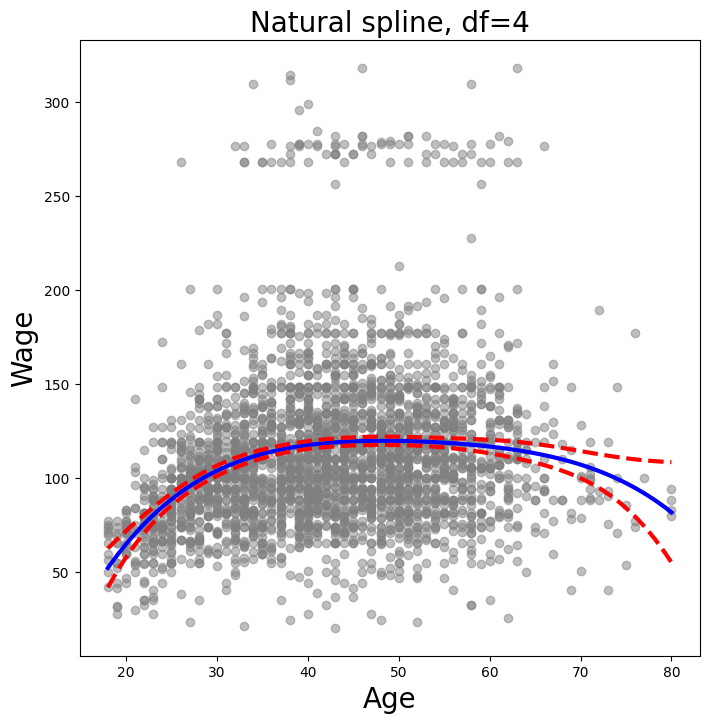

In [ ]:
age_grid = np.linspace(age.min(), age.max(), 100)
age_df = pd.DataFrame({'age': age_grid})
polyAge = MS([poly('age', degree=4)]).fit(Wage)
plot_wage_fit(age_df,
polyAge,
'Natural spline, df=4');

In [ ]:
# b.
cv_error = np.zeros(100)
W = np.array(Wage['wage'])
M = sklearn_sm(sm.OLS)
for i, d in enumerate(range(1,100)):
  cut_age, bins = pd.qcut(age, d, retbins=True)
  X = pd.get_dummies(cut_age)
  M_CV = cross_validate(M,
  X,
  Y,
  cv=Wage.shape[0])
  cv_error[i] = np.mean(M_CV['test_score'])
print(cv_error)



ValueError: ignored

In [ ]:
cut_age, bins = pd.qcut(age, np.where(np.isclose(cv_error, 1605.44293887))[0][0], retbins=True)
X = pd.get_dummies(cut_age)
model = sm.OLS(y, X).fit()

preds = model.get_prediction(X)
predicted_means = preds.predicted_mean
conf_int = preds.conf_int(alpha=0.05)

fig, ax = plt.subplots(figsize=(8,8))
ax.scatter(age, y, facecolor='gray', alpha=0.5)

for i in range(len(bins) - 1):
    bin_range = (age >= bins[i]) & (age < bins[i+1])
    ax.plot(age[bin_range], [predicted_means[i]] * sum(bin_range), 'b-', linewidth=3)
    ax.plot(age[bin_range], [conf_int[i, 0]] * sum(bin_range), 'r--', linewidth=2)
    ax.plot(age[bin_range], [conf_int[i, 1]] * sum(bin_range), 'r--', linewidth=2)

ax.set_title('Age vs Wage split func', fontsize=20)
ax.set_xlabel('Age', fontsize=20)
ax.set_ylabel('Wage', fontsize=20)
plt.show()


IndexError: ignored

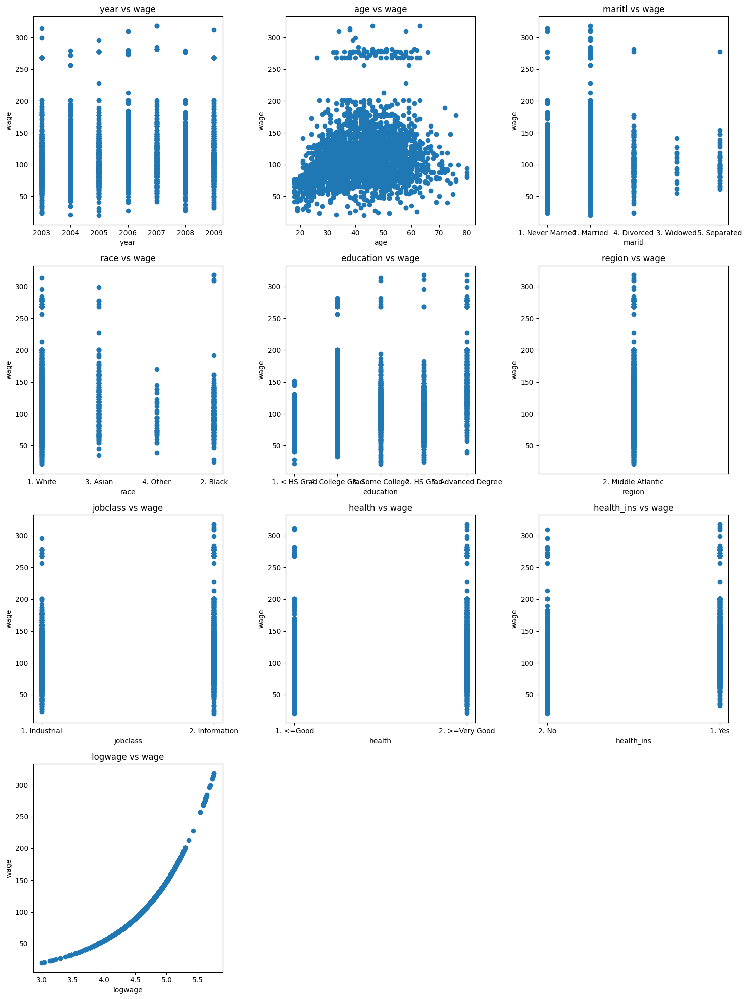

In [ ]:
# 7.
import pandas as pd
import matplotlib.pyplot as plt

def plot_x_vs_y(data, y_var, x_vars=None):

    if x_vars is None:
        x_vars = [col for col in data.columns if col != y_var]

    num_plots = len(x_vars)
    num_rows = (num_plots // 3) + (num_plots % 3 > 0)  # Up to 3 columns per row

    fig, axes = plt.subplots(num_rows, min(3, num_plots), figsize=(5 * min(3, num_plots), 5 * num_rows))

    if num_plots > 3:
        axes = axes.flatten()

    for i, x_var in enumerate(x_vars):
        if num_plots > 1:
            ax = axes[i]
        else:
            ax = axes

        ax.scatter(data[x_var], data[y_var])
        ax.set_xlabel(x_var)
        ax.set_ylabel(y_var)
        ax.set_title(f'{x_var} vs {y_var}')

    if num_plots > 1:
        for j in range(i+1, len(axes)):
            fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()
plot_x_vs_y(Wage, 'wage')
# Judging by these plots, it looks like many of these can be modeled with piecewise step functions, considering all
# except age (and logwage, which is just log of wage and we'll ignore) are categorical

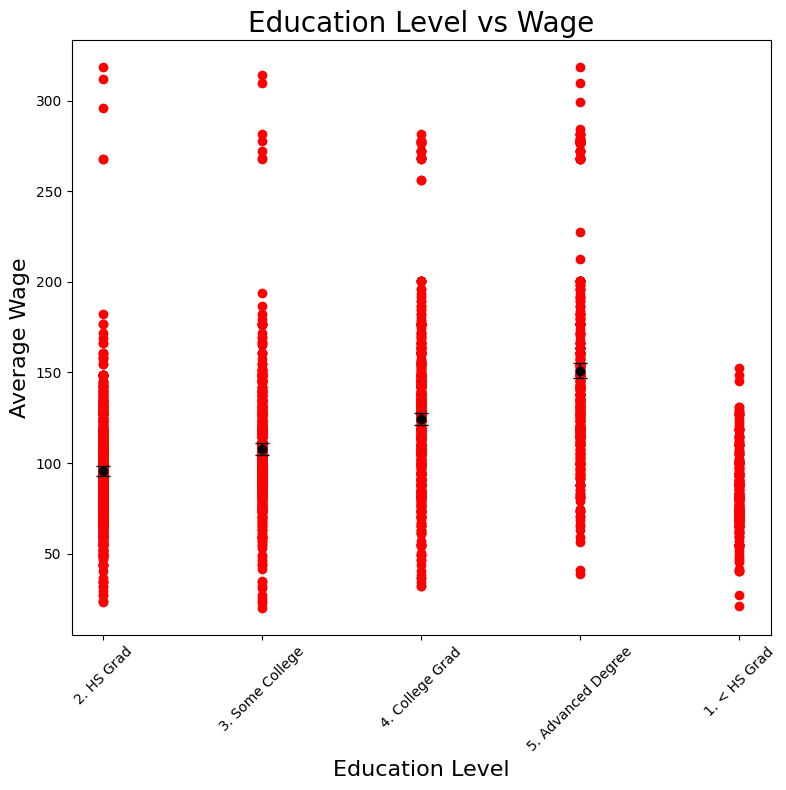

In [ ]:
X = pd.get_dummies(Wage['education'], drop_first=True)
y = Wage['wage']

model = sm.OLS(y, X).fit()

preds = model.get_prediction(X)
predicted_means = preds.predicted_mean
conf_int = preds.conf_int(alpha=0.05)

fig, ax = plt.subplots(figsize=(8,8))

education_categories = X.columns
category_means = {}
category_conf_int = {}

for i, category in enumerate(education_categories):
    category_means[category] = predicted_means[X[category] == 1].mean()
    category_conf_int[category] = conf_int[X[category] == 1].mean(axis=0)

ax.scatter(category_means.keys(), category_means.values(), color='skyblue', edgecolor='black')
ax.scatter(Wage['education'], y, color='red')

for category in education_categories:
    ax.errorbar(category, category_means[category],
                yerr=[[category_means[category] - category_conf_int[category][0]],
                      [category_conf_int[category][1] - category_means[category]]],
                fmt='o', color='black', capsize=5)

ax.set_title('Education Level vs Wage', fontsize=20)
ax.set_xlabel('Education Level', fontsize=16)
ax.set_ylabel('Average Wage', fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
Auto = load_data('Auto')
Auto.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


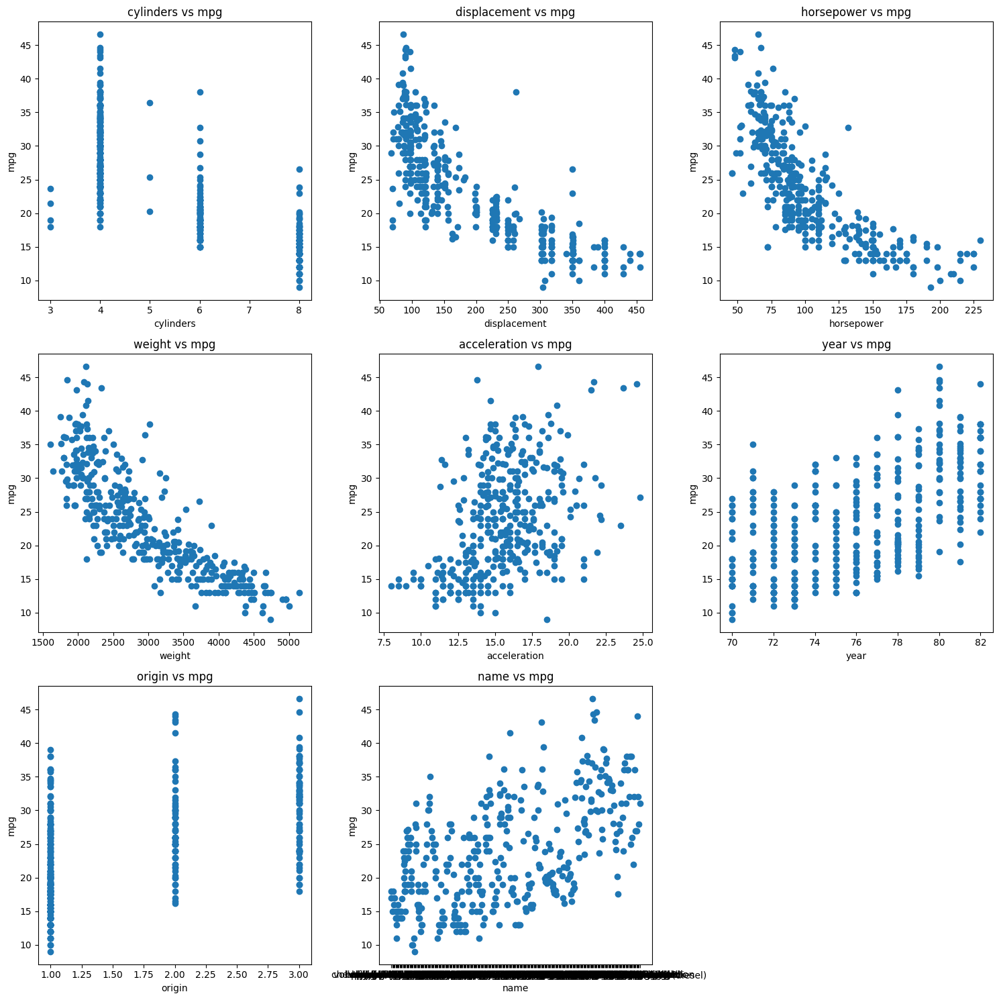

In [ ]:
# 8
plot_x_vs_y(Auto, 'mpg')
# these indicate that certain categorical features would be good for split functions, and others like horsepower and
# weight would be good polynomial fits (particularly x**-1)

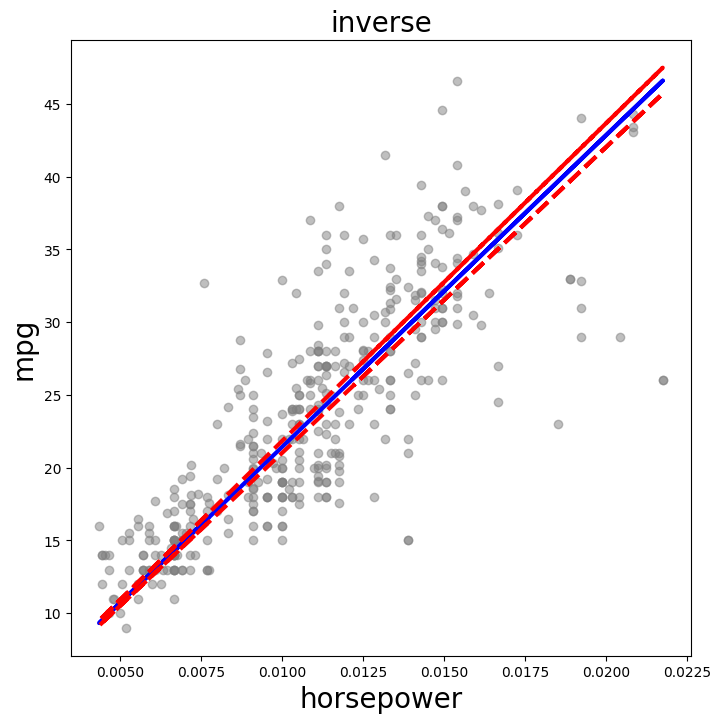

In [ ]:

Auto['inverse_horsepower'] = 1 / Auto['horsepower']
X = Auto['inverse_horsepower']
results = sm.OLS(Auto['mpg'], X).fit()
summarize(results)
preds = results.get_prediction(X)
bands = preds.conf_int(alpha=0.05)
fig, ax = subplots(figsize=(8,8))
ax.scatter(X, Auto['mpg'], facecolor='gray', alpha=0.5)
for val, ls in zip([preds.predicted_mean , bands[:,0], bands[:,1]], ['b','r--','r--']):
  ax.plot(X, val, ls, linewidth=3)
ax.set_title('inverse', fontsize=20)
ax.set_xlabel('horsepower', fontsize=20)
ax.set_ylabel('mpg', fontsize=20);



In [ ]:
len(X)

392

# Chapter 8 Lab

In [ ]:
import numpy as np
import pandas as pd
from matplotlib.pyplot import subplots
from statsmodels.datasets import get_rdataset
import sklearn.model_selection as skm
from ISLP import load_data, confusion_table
from ISLP.models import ModelSpec as MS

In [ ]:
from sklearn.tree import (DecisionTreeClassifier as DTC,
DecisionTreeRegressor as DTR,
plot_tree,
export_text)
from sklearn.metrics import (accuracy_score,
log_loss)
from sklearn.ensemble import \
(RandomForestRegressor as RF,
GradientBoostingRegressor as GBR)
from ISLP.bart import BART

In [ ]:
Carseats = load_data('Carseats')
High = np.where(Carseats.Sales > 8, "Yes", "No")

In [ ]:
model = MS(Carseats.columns.drop('Sales'), intercept=False)
D = model.fit_transform(Carseats)
feature_names = list(D.columns)
X = np.asarray(D)

In [ ]:
clf = DTC(criterion='entropy', max_depth=3, random_state=0)
clf.fit(X, High)

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=0)

In [ ]:
accuracy_score(High, clf.predict(X))

0.79

In [ ]:
resid_dev = np.sum(log_loss(High, clf.predict_proba(X)))
resid_dev

0.4710647062649358

[Text(0.5, 0.875, 'ShelveLoc[Good] <= 0.5\nentropy = 0.977\nsamples = 400\nvalue = [236, 164]'),
 Text(0.25, 0.625, 'Price <= 92.5\nentropy = 0.894\nsamples = 315\nvalue = [217, 98]'),
 Text(0.125, 0.375, 'Income <= 57.0\nentropy = 0.887\nsamples = 46\nvalue = [14, 32]'),
 Text(0.0625, 0.125, 'entropy = 0.881\nsamples = 10\nvalue = [7, 3]'),
 Text(0.1875, 0.125, 'entropy = 0.711\nsamples = 36\nvalue = [7, 29]'),
 Text(0.375, 0.375, 'Advertising <= 13.5\nentropy = 0.804\nsamples = 269\nvalue = [203, 66]'),
 Text(0.3125, 0.125, 'entropy = 0.687\nsamples = 224\nvalue = [183, 41]'),
 Text(0.4375, 0.125, 'entropy = 0.991\nsamples = 45\nvalue = [20, 25]'),
 Text(0.75, 0.625, 'Price <= 135.0\nentropy = 0.767\nsamples = 85\nvalue = [19, 66]'),
 Text(0.625, 0.375, 'US[Yes] <= 0.5\nentropy = 0.523\nsamples = 68\nvalue = [8, 60]'),
 Text(0.5625, 0.125, 'entropy = 0.937\nsamples = 17\nvalue = [6, 11]'),
 Text(0.6875, 0.125, 'entropy = 0.239\nsamples = 51\nvalue = [2, 49]'),
 Text(0.875, 0.375, 'In

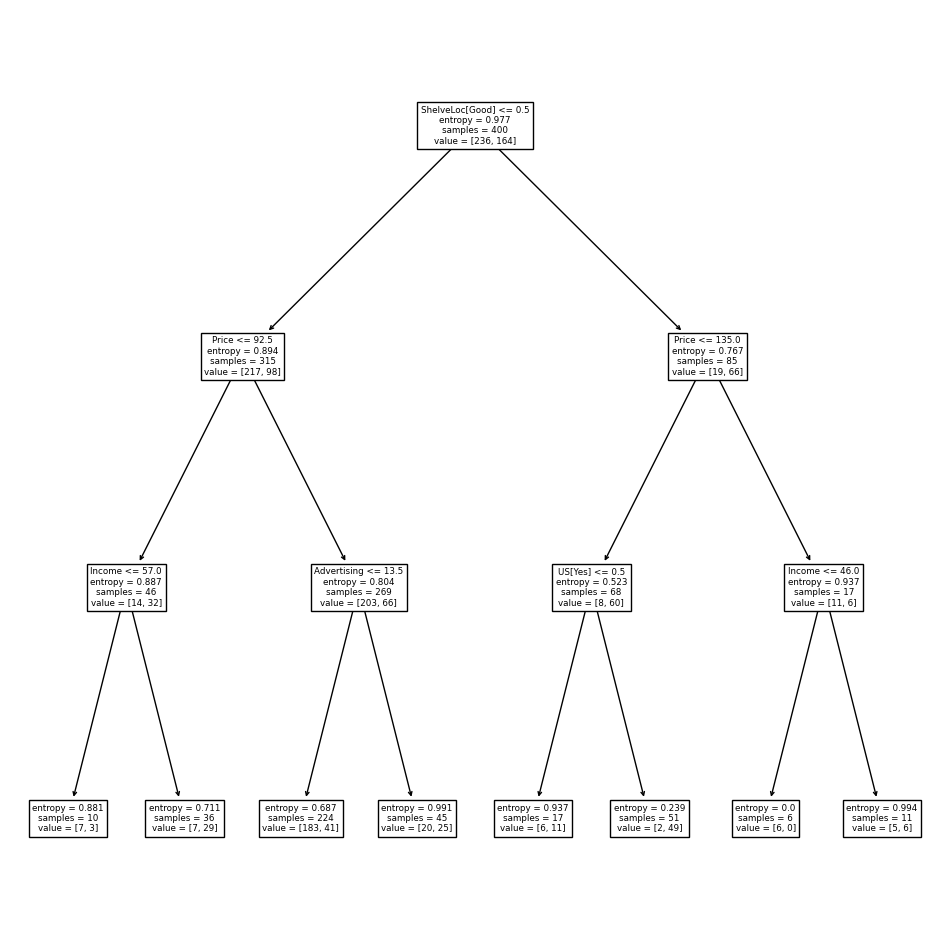

In [ ]:
ax = subplots(figsize=(12,12))[1]
plot_tree(clf, feature_names=feature_names, ax=ax)

In [ ]:
print(export_text(clf,
feature_names=feature_names,
show_weights=True))

|--- ShelveLoc[Good] <= 0.50
|   |--- Price <= 92.50
|   |   |--- Income <= 57.00
|   |   |   |--- weights: [7.00, 3.00] class: No
|   |   |--- Income >  57.00
|   |   |   |--- weights: [7.00, 29.00] class: Yes
|   |--- Price >  92.50
|   |   |--- Advertising <= 13.50
|   |   |   |--- weights: [183.00, 41.00] class: No
|   |   |--- Advertising >  13.50
|   |   |   |--- weights: [20.00, 25.00] class: Yes
|--- ShelveLoc[Good] >  0.50
|   |--- Price <= 135.00
|   |   |--- US[Yes] <= 0.50
|   |   |   |--- weights: [6.00, 11.00] class: Yes
|   |   |--- US[Yes] >  0.50
|   |   |   |--- weights: [2.00, 49.00] class: Yes
|   |--- Price >  135.00
|   |   |--- Income <= 46.00
|   |   |   |--- weights: [6.00, 0.00] class: No
|   |   |--- Income >  46.00
|   |   |   |--- weights: [5.00, 6.00] class: Yes



In [ ]:
validation = skm.ShuffleSplit(n_splits=1,
test_size=200,
random_state=0)
results = skm.cross_validate(clf,
D,
High,
cv=validation)
results['test_score']

array([0.685])

In [ ]:
(X_train,
X_test,
High_train,
High_test) = skm.train_test_split(X,
High,
test_size=0.5,
random_state=0)

In [ ]:
clf = DTC(criterion='entropy', random_state=0)
clf.fit(X_train, High_train)
accuracy_score(High_test, clf.predict(X_test))

0.735

In [ ]:
ccp_path = clf.cost_complexity_pruning_path(X_train, High_train)
kfold = skm.KFold(10,
random_state=1,
shuffle=True)

In [ ]:
grid = skm.GridSearchCV(clf, {'ccp_alpha': ccp_path.ccp_alphas}, refit=True, cv=kfold, scoring='accuracy')
grid.fit(X_train, High_train)
grid.best_score_

0.685

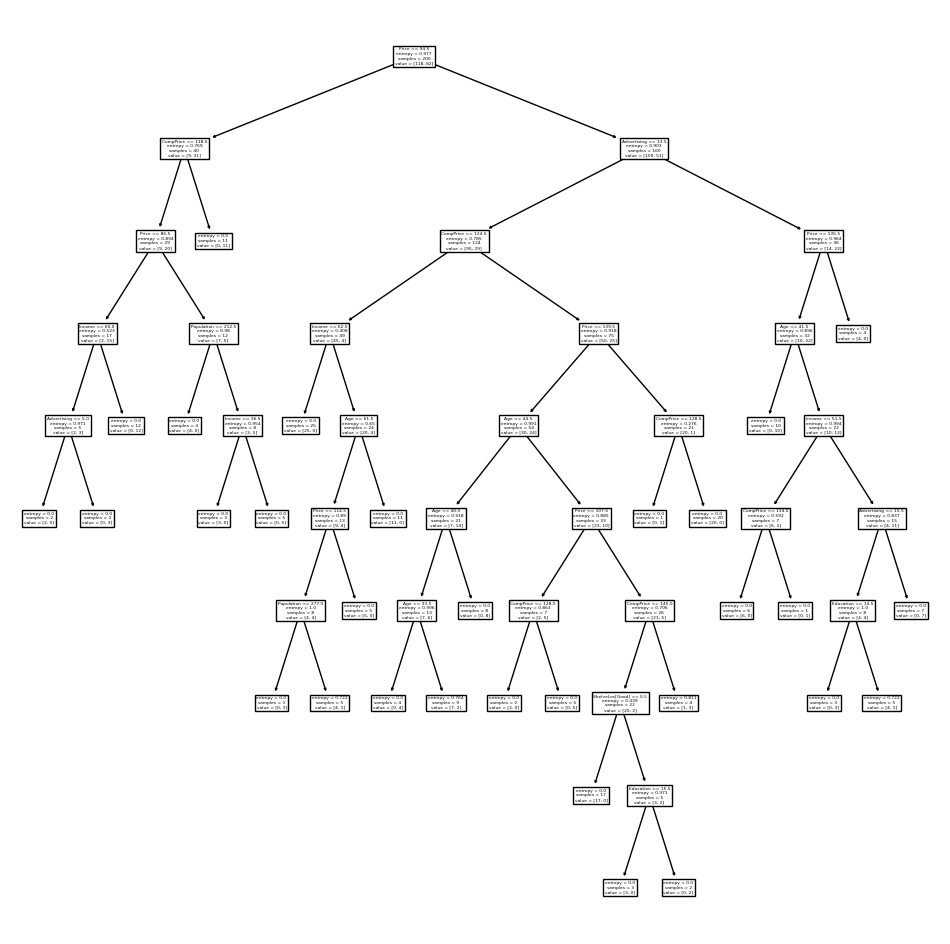

In [ ]:
ax = subplots(figsize=(12, 12))[1]
best_ = grid.best_estimator_
plot_tree(best_,
feature_names=feature_names,
ax=ax);

In [ ]:
best_.tree_.n_leaves

30

In [ ]:
print(accuracy_score(High_test,
best_.predict(X_test)))
confusion = confusion_table(best_.predict(X_test),
High_test)
confusion

0.72


Truth,No,Yes
Predicted,,
No,94,32
Yes,24,50


In [ ]:
Boston = load_data("Boston")
model = MS(Boston.columns.drop('medv'), intercept=False)
D = model.fit_transform(Boston)
feature_names = list(D.columns)
X = np.asarray(D)

In [ ]:
(X_train, X_test, y_train, y_test) = skm.train_test_split(X, Boston['medv'], test_size=0.3, random_state=0)

[Text(0.5, 0.875, 'rm <= 6.797\nsquared_error = 84.765\nsamples = 354\nvalue = 22.745'),
 Text(0.25, 0.625, 'lstat <= 14.405\nsquared_error = 35.011\nsamples = 284\nvalue = 19.614'),
 Text(0.125, 0.375, 'dis <= 1.474\nsquared_error = 20.776\nsamples = 167\nvalue = 22.981'),
 Text(0.0625, 0.125, 'squared_error = 0.0\nsamples = 2\nvalue = 50.0'),
 Text(0.1875, 0.125, 'squared_error = 12.072\nsamples = 165\nvalue = 22.653'),
 Text(0.375, 0.375, 'crim <= 5.782\nsquared_error = 16.049\nsamples = 117\nvalue = 14.808'),
 Text(0.3125, 0.125, 'squared_error = 10.345\nsamples = 67\nvalue = 16.872'),
 Text(0.4375, 0.125, 'squared_error = 10.334\nsamples = 50\nvalue = 12.042'),
 Text(0.75, 0.625, 'rm <= 7.435\nsquared_error = 85.388\nsamples = 70\nvalue = 35.451'),
 Text(0.625, 0.375, 'crim <= 7.393\nsquared_error = 44.147\nsamples = 47\nvalue = 30.921'),
 Text(0.5625, 0.125, 'squared_error = 19.597\nsamples = 43\nvalue = 32.465'),
 Text(0.6875, 0.125, 'squared_error = 6.997\nsamples = 4\nvalue = 

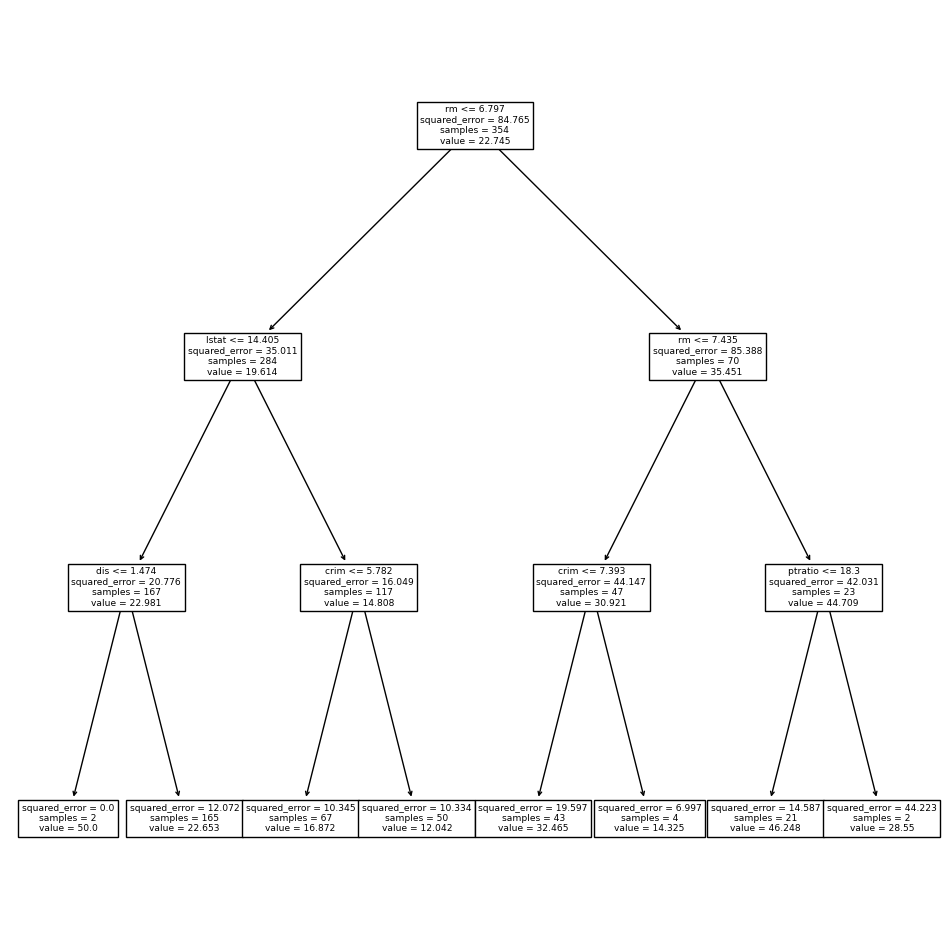

In [ ]:
reg = DTR(max_depth=3)
reg.fit(X_train, y_train)
ax = subplots(figsize=(12,12))[1]
plot_tree(reg, feature_names=feature_names, ax=ax)

In [ ]:
ccp_path = reg.cost_complexity_pruning_path(X_train, y_train)
kfold = skm.KFold(5,
shuffle=True,
random_state=10)
grid = skm.GridSearchCV(reg, {'ccp_alpha': ccp_path.ccp_alphas}, refit=True, cv=kfold, scoring='neg_mean_squared_error')
G = grid.fit(X_train, y_train)

In [ ]:
best_ = grid.best_estimator_
np.mean((y_test - best_.predict(X_test))**2)

28.06985754975404

[Text(0.5, 0.875, 'rm <= 6.797\nsquared_error = 84.765\nsamples = 354\nvalue = 22.745'),
 Text(0.25, 0.625, 'lstat <= 14.405\nsquared_error = 35.011\nsamples = 284\nvalue = 19.614'),
 Text(0.125, 0.375, 'dis <= 1.474\nsquared_error = 20.776\nsamples = 167\nvalue = 22.981'),
 Text(0.0625, 0.125, 'squared_error = 0.0\nsamples = 2\nvalue = 50.0'),
 Text(0.1875, 0.125, 'squared_error = 12.072\nsamples = 165\nvalue = 22.653'),
 Text(0.375, 0.375, 'crim <= 5.782\nsquared_error = 16.049\nsamples = 117\nvalue = 14.808'),
 Text(0.3125, 0.125, 'squared_error = 10.345\nsamples = 67\nvalue = 16.872'),
 Text(0.4375, 0.125, 'squared_error = 10.334\nsamples = 50\nvalue = 12.042'),
 Text(0.75, 0.625, 'rm <= 7.435\nsquared_error = 85.388\nsamples = 70\nvalue = 35.451'),
 Text(0.625, 0.375, 'crim <= 7.393\nsquared_error = 44.147\nsamples = 47\nvalue = 30.921'),
 Text(0.5625, 0.125, 'squared_error = 19.597\nsamples = 43\nvalue = 32.465'),
 Text(0.6875, 0.125, 'squared_error = 6.997\nsamples = 4\nvalue = 

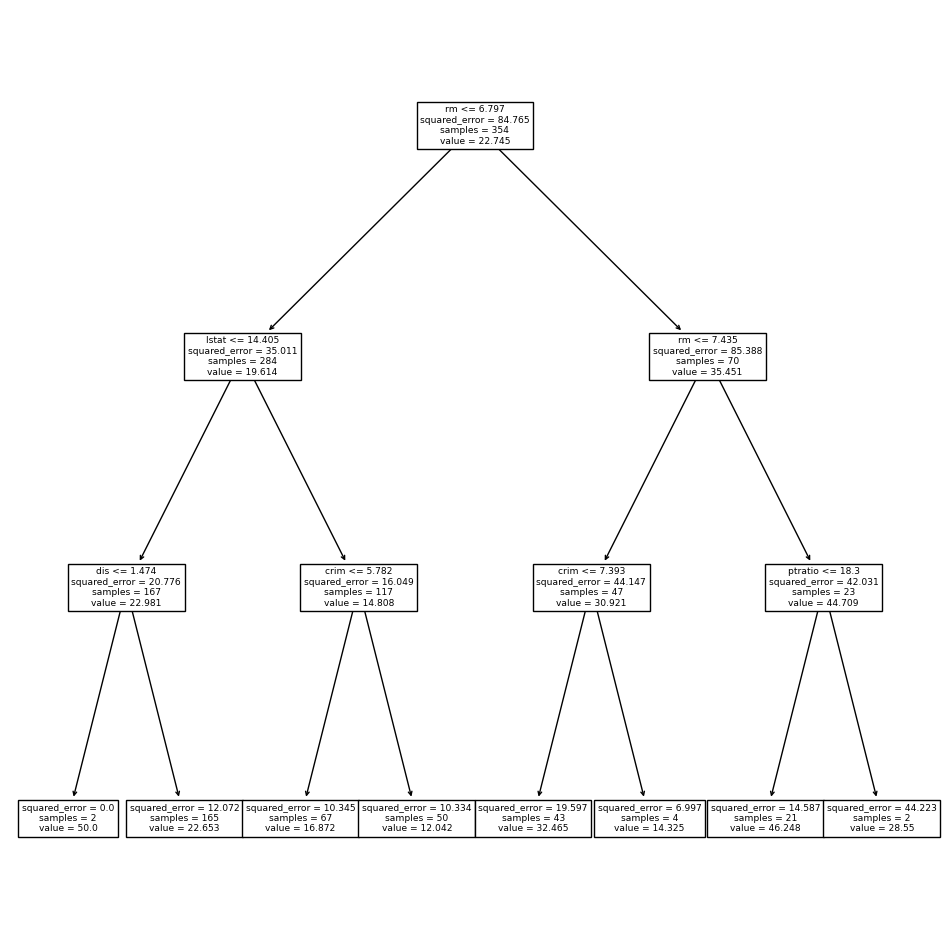

In [ ]:
ax = subplots(figsize=(12,12))[1]
plot_tree(G.best_estimator_, feature_names=feature_names, ax=ax)

In [ ]:
bag_boston = RF(max_features=X_train.shape[1], random_state=0)
bag_boston.fit(X_train, y_train)

RandomForestRegressor(max_features=12, random_state=0)

14.634700151315787

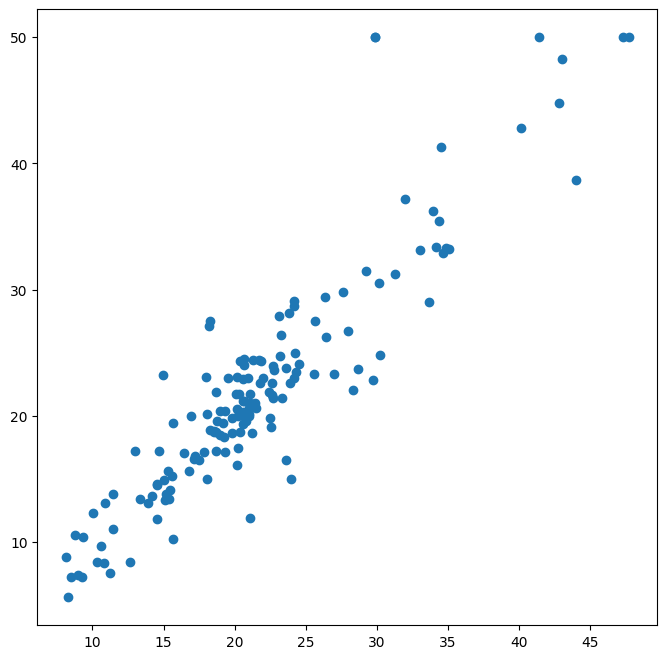

In [ ]:
 ax = subplots(figsize=(8,8))[1]
y_hat_bag = bag_boston.predict(X_test)
ax.scatter(y_hat_bag, y_test)
np.mean((y_test - y_hat_bag)**2)

In [ ]:
bag_boston = RF(max_features=X_train.shape[1],
n_estimators=500,
random_state=0).fit(X_train, y_train)
y_hat_bag = bag_boston.predict(X_test)
np.mean((y_test - y_hat_bag)**2)

14.605662565263161

In [ ]:
RF_boston = RF(max_features=6,
random_state=0).fit(X_train, y_train)
y_hat_RF = RF_boston.predict(X_test)
np.mean((y_test - y_hat_RF)**2)

20.04276446710527

In [ ]:
feature_imp = pd.DataFrame({'importance':RF_boston.feature_importances_}, index=feature_names)
feature_imp.sort_values(by='importance', ascending=False)

,importance
lstat,0.356203
rm,0.332163
ptratio,0.067270
crim,0.055404
indus,0.053851
dis,0.041582
nox,0.035225
tax,0.025355
age,0.021506
rad,0.004784


In [ ]:
boost_boston = GBR(n_estimators=5000, learning_rate=0.001, max_depth=3, random_state=0)
boost_boston.fit(X_train, y_train)

GradientBoostingRegressor(learning_rate=0.001, n_estimators=5000,
                          random_state=0)

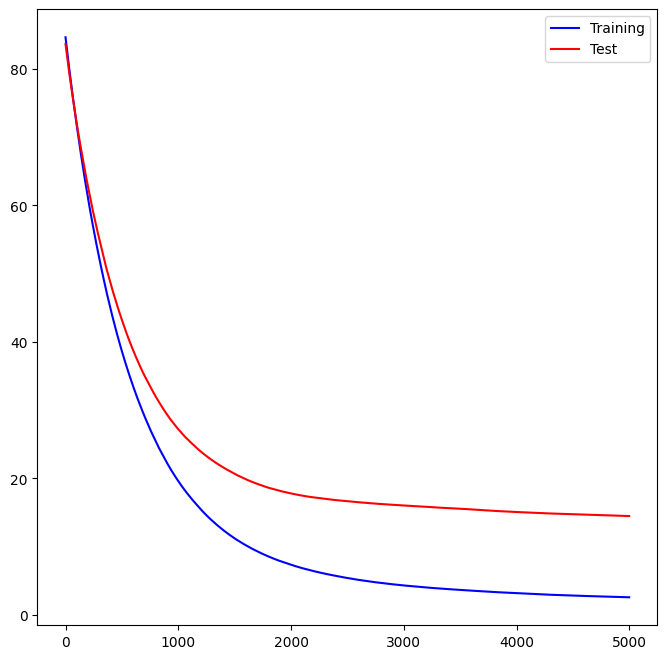

In [ ]:
test_error = np.zeros_like(boost_boston.train_score_)
for idx, y_ in enumerate(boost_boston.staged_predict(X_test)):
  test_error[idx] = np.mean((y_test - y_)**2)
plot_idx = np.arange(boost_boston.train_score_.shape[0])
ax = subplots(figsize=(8,8))[1]
ax.plot(plot_idx,boost_boston.train_score_,'b',label='Training')
ax.plot(plot_idx,test_error,'r',label='Test')
ax.legend();

In [ ]:
y_hat_boost = boost_boston.predict(X_test);
np.mean((y_test - y_hat_boost)**2)

14.481405918831591

In [ ]:
boost_boston = GBR(n_estimators=5000,
learning_rate=0.2,
max_depth=3,
random_state=0)
boost_boston.fit(X_train,
y_train)
y_hat_boost = boost_boston.predict(X_test);
np.mean((y_test - y_hat_boost)**2)

14.501514553719565

In [ ]:
bart_boston = BART(random_state=0, burnin=5, ndraw=15)
bart_boston.fit(X_train, y_train)

BART(burnin=5, ndraw=15, random_state=0)

In [ ]:
yhat_test = bart_boston.predict(X_test.astype(np.float32))
np.mean((y_test - yhat_test)**2)

22.145009458109225

In [ ]:
var_inclusion = pd.Series(bart_boston.variable_inclusion_.mean(0),
index=D.columns)
var_inclusion

crim       26.933333
zn         27.866667
indus      26.466667
chas       22.466667
nox        26.600000
rm         29.800000
age        22.733333
dis        26.466667
rad        23.666667
tax        24.133333
ptratio    24.266667
lstat      31.000000
dtype: float64

# Chapter 8 Exercises

In [ ]:
import numpy as np
import statsmodels.api as sm
from ISLP import load_data
from ISLP.models import (ModelSpec as MS,
summarize,
poly)
from sklearn.model_selection import train_test_split
from functools import partial
from sklearn.model_selection import \
(cross_validate,
KFold,
ShuffleSplit)
from sklearn.base import clone
from ISLP.models import sklearn_sm

In [ ]:
Boston = load_data('Boston')
X = Boston.drop('medv', axis=1)
(X_train, X_test, y_train, y_test) = skm.train_test_split(X, Boston['medv'], test_size=0.3, random_state=0)
from sklearn.ensemble import RandomForestRegressor as RF
from sklearn.model_selection import cross_validate

cv_error = [[] for _ in range(1, 12)]

for i in range(1, 12):
    for j in range(100, 200):
        M = RF(max_features=i, n_estimators=j, random_state=0)

        M_CV = cross_validate(M, X, Boston['medv'], cv=5)
        cv_error[i-1].append(np.mean(M_CV['test_score']))

cv_error


[[0.427150105711173,
  0.4259186959541338,
  0.4280390679410594,
  0.4267310119503123,
  0.4283353669709995,
  0.42471981195168224,
  0.4261194505031197,
  0.42779189464053713,
  0.42759718300681654,
  0.43041246581589465,
  0.4330815224313273,
  0.4321721953071037,
  0.4336102270999683,
  0.43482569963846684,
  0.43590709559432794,
  0.4381901870236116,
  0.4410694557431462,
  0.44305693875764784,
  0.44354792225281126,
  0.44559574351607995,
  0.4470541908986612,
  0.4484076652665351,
  0.44456049103574724,
  0.44685543096315994,
  0.44834322158325063,
  0.44376290095325166,
  0.4426444424530992,
  0.4426252364429521,
  0.4432805022127678,
  0.44111996729616704,
  0.4422864483121217,
  0.44173848758753015,
  0.4433849664857396,
  0.4394615359455717,
  0.4392864229889878,
  0.44062573865540766,
  0.4402625163241386,
  0.4383123311354532,
  0.43902803762271364,
  0.4382631518096531,
  0.4389577760920999,
  0.44117038692583443,
  0.44203388479580424,
  0.4422199727038648,
  0.4451382462

[0.427150105711173, 0.4259186959541338, 0.4280390679410594, 0.4267310119503123, 0.4283353669709995, 0.42471981195168224, 0.4261194505031197, 0.42779189464053713, 0.42759718300681654, 0.43041246581589465, 0.4330815224313273, 0.4321721953071037, 0.4336102270999683, 0.43482569963846684, 0.43590709559432794, 0.4381901870236116, 0.4410694557431462, 0.44305693875764784, 0.44354792225281126, 0.44559574351607995, 0.4470541908986612, 0.4484076652665351, 0.44456049103574724, 0.44685543096315994, 0.44834322158325063, 0.44376290095325166, 0.4426444424530992, 0.4426252364429521, 0.4432805022127678, 0.44111996729616704, 0.4422864483121217, 0.44173848758753015, 0.4433849664857396, 0.4394615359455717, 0.4392864229889878, 0.44062573865540766, 0.4402625163241386, 0.4383123311354532, 0.43902803762271364, 0.4382631518096531, 0.4389577760920999, 0.44117038692583443, 0.44203388479580424, 0.4422199727038648, 0.4451382462894836, 0.4459565664657358, 0.4487396500474065, 0.44761621443787314, 0.44653120642748834,

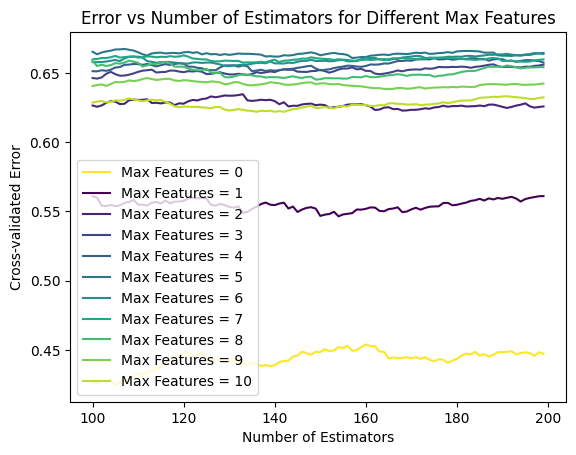

In [ ]:
colors = plt.cm.viridis(np.linspace(0, 1, 11))

for i, errors in enumerate(cv_error):
    print(errors)
    plt.plot(range(100, 200), errors, color=colors[i-1], label=f'Max Features = {i}')

plt.title('Error vs Number of Estimators for Different Max Features')
plt.xlabel('Number of Estimators')
plt.ylabel('Cross-validated Error')
plt.legend()
plt.show()


[Text(0.5, 0.875, 'ShelveLoc[Good] <= 0.5\nsquared_error = 8.438\nsamples = 280\nvalue = 7.378'),
 Text(0.25, 0.625, 'ShelveLoc[Medium] <= 0.5\nsquared_error = 6.26\nsamples = 226\nvalue = 6.705'),
 Text(0.125, 0.375, 'Price <= 102.5\nsquared_error = 5.251\nsamples = 71\nvalue = 5.159'),
 Text(0.0625, 0.125, 'squared_error = 4.795\nsamples = 21\nvalue = 6.697'),
 Text(0.1875, 0.125, 'squared_error = 4.031\nsamples = 50\nvalue = 4.512'),
 Text(0.375, 0.375, 'Price <= 106.5\nsquared_error = 5.127\nsamples = 155\nvalue = 7.413'),
 Text(0.3125, 0.125, 'squared_error = 4.149\nsamples = 55\nvalue = 8.743'),
 Text(0.4375, 0.125, 'squared_error = 4.156\nsamples = 100\nvalue = 6.681'),
 Text(0.75, 0.625, 'Price <= 107.5\nsquared_error = 7.698\nsamples = 54\nvalue = 10.198'),
 Text(0.625, 0.375, 'Age <= 55.5\nsquared_error = 3.888\nsamples = 20\nvalue = 12.344'),
 Text(0.5625, 0.125, 'squared_error = 2.928\nsamples = 11\nvalue = 13.395'),
 Text(0.6875, 0.125, 'squared_error = 2.068\nsamples = 9\

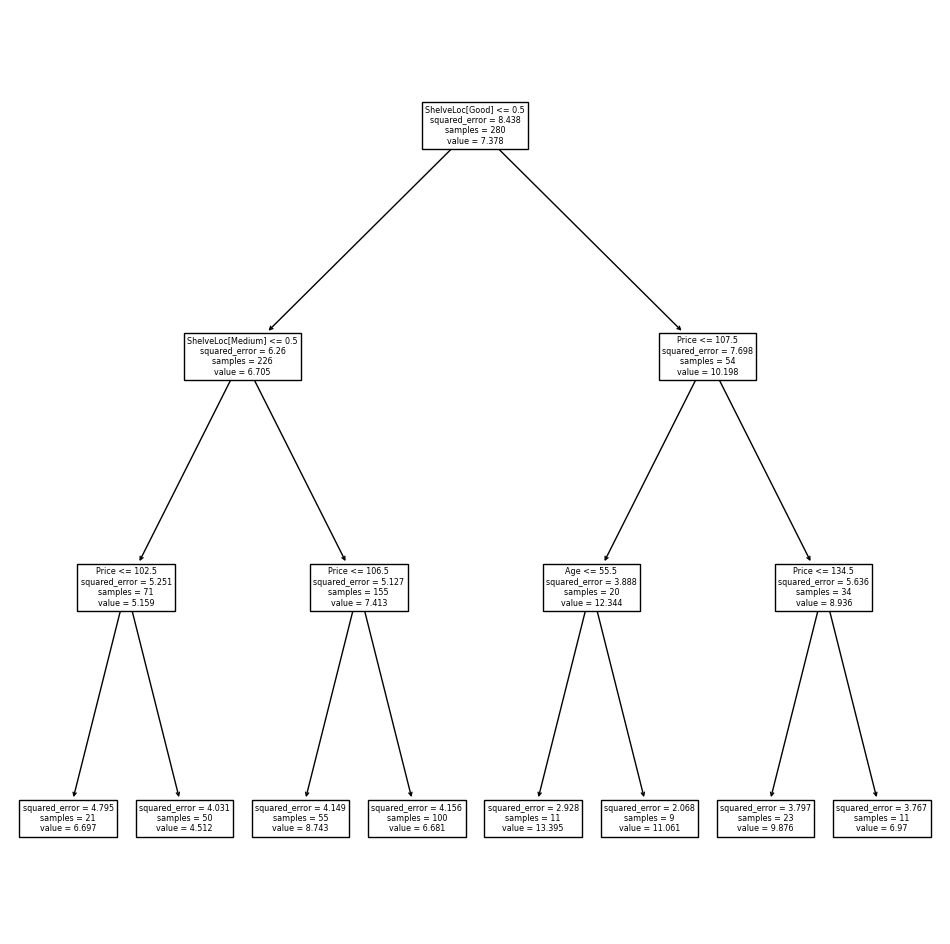

In [ ]:
# 8.
Carseats = load_data('Carseats')
X = Carseats.drop('Sales', axis=1)
model = MS(Carseats.columns.drop('Sales'), intercept=False)
D = model.fit_transform(Carseats)
feature_names = list(D.columns)
X = np.asarray(D)
(X_train, X_test, y_train, y_test) = skm.train_test_split(X, Carseats['Sales'], test_size=0.3, random_state=0)
reg = DTR(max_depth=3,random_state=0)
reg.fit(X_train, y_train)
ax = subplots(figsize=(12,12))[1]
plot_tree(reg, feature_names=feature_names, ax=ax)



In [ ]:
from sklearn.metrics import mean_squared_error

predictions = reg.predict(X_test)

mse = mean_squared_error(y_test, predictions)
print(mse)

3.7038582752360942


In [ ]:
ccp_path = reg.cost_complexity_pruning_path(X_train, y_train)
kfold = skm.KFold(5,
shuffle=True,
random_state=10)
grid = skm.GridSearchCV(reg,
{'ccp_alpha': ccp_path.ccp_alphas},
refit=True,
cv=kfold,
scoring='neg_mean_squared_error')
G = grid.fit(X_train, y_train)
best_ = grid.best_estimator_
np.mean((y_test - best_.predict(X_test))**2)

3.7038582752360942

In [ ]:
bag_carseats= RF(max_features=X_train.shape[1], random_state=0)
bag_carseats.fit(X_train, y_train)

RandomForestRegressor(max_features=11, random_state=0)

In [ ]:
predictions = bag_carseats.predict(X_test)

mse = mean_squared_error(y_test, predictions)
feature_names = list(D.columns)
print(mse)
feature_imp = pd.DataFrame(
{'importance':bag_carseats.feature_importances_},
index=feature_names)
feature_imp.sort_values(by='importance', ascending=False)

2.0077445197500015


,importance
Price,0.278666
ShelveLoc[Good],0.222431
Age,0.108637
CompPrice,0.097085
ShelveLoc[Medium],0.082965
Advertising,0.074627
Income,0.051799
Population,0.040945
Education,0.030836
US[Yes],0.006815


In [ ]:
for i in range(1, round(X_train.shape[1]/2)):
  rf_carseats= RF(max_features=i, random_state=0)
  rf_carseats.fit(X_train, y_train)
  predictions = rf_carseats.predict(X_test)

  mse = mean_squared_error(y_test, predictions)
  feature_names = list(D.columns)
  print(mse)
  feature_imp = pd.DataFrame(
  {'importance':rf_carseats.feature_importances_},
  index=feature_names)
  print(f'features at {i}')
  print(feature_imp.sort_values(by='importance', ascending=False))
# performance goes up (error rate goes down) as max_features increasess

3.2264418846041663
features at 1
                   importance
Price                0.188783
Age                  0.129831
ShelveLoc[Good]      0.119280
Population           0.109784
Income               0.108738
CompPrice            0.105645
Advertising          0.089324
Education            0.078532
ShelveLoc[Medium]    0.028787
US[Yes]              0.025778
Urban[Yes]           0.015519
2.9053707589999997
features at 2
                   importance
Price                0.214452
ShelveLoc[Good]      0.140092
Age                  0.129840
Income               0.098358
CompPrice            0.096274
Population           0.088062
Advertising          0.087858
Education            0.066192
ShelveLoc[Medium]    0.040284
US[Yes]              0.022545
Urban[Yes]           0.016043
2.303643984083332
features at 3
                   importance
Price                0.251444
ShelveLoc[Good]      0.152043
Age                  0.122974
CompPrice            0.094041
Advertising          0.093369
In

In [ ]:
bart_carseats = BART(random_state=0, burnin=5, ndraw=15)
bart_carseats.fit(X_train, y_train)
predictions = bart_carseats.predict(X_test)

mse = mean_squared_error(y_test, predictions)
feature_names = list(D.columns)
print(mse)

1.7171824254893668


In [ ]:
# 9
OJ = load_data('OJ')
OJ['Store7'] = OJ['Store7'].map({'Yes': 1, 'No': 0})
X = OJ.drop('Purchase', axis=1)
y = OJ['Purchase'].map({'CH': 1, 'MM': 0})
model = MS(OJ.columns.drop('Purchase'), intercept=False)
D = model.fit_transform(OJ)
feature_names = list(D.columns)
X = np.asarray(D)
(X_train, X_test, y_train, y_test) = skm.train_test_split(X, y, test_size=1-(800/OJ.shape[0]), random_state=0)

In [ ]:
from sklearn.metrics import confusion_matrix
clf = DTC(criterion='entropy',max_depth=3,random_state=0)
clf.fit(X_train, y_train)
predictions_train = clf.predict(X_train)
predictions_test = clf.predict(X_test)
mse_train = mean_squared_error(y_train, predictions_train)
mse_test = mean_squared_error(y_test, predictions_test)
feature_names = list(D.columns)
print('Training MSE: ', mse_train)
print('Test MSE: ', mse_test)
print('Test Accuracy: ', accuracy_score(y_test, predictions_test))
print(export_text(clf,
feature_names=feature_names,
show_weights=True))
confusion_matrix(y_test, predictions_test)

Training MSE:  0.17772215269086358
Test MSE:  0.1881918819188192
Test Accuracy:  0.8118081180811808
|--- LoyalCH <= 0.51
|   |--- LoyalCH <= 0.28
|   |   |--- LoyalCH <= 0.04
|   |   |   |--- weights: [48.00, 1.00] class: 0
|   |   |--- LoyalCH >  0.04
|   |   |   |--- weights: [90.00, 21.00] class: 0
|   |--- LoyalCH >  0.28
|   |   |--- PriceDiff <= 0.05
|   |   |   |--- weights: [56.00, 14.00] class: 0
|   |   |--- PriceDiff >  0.05
|   |   |   |--- weights: [47.00, 63.00] class: 1
|--- LoyalCH >  0.51
|   |--- LoyalCH <= 0.71
|   |   |--- PriceDiff <= 0.27
|   |   |   |--- weights: [41.00, 45.00] class: 1
|   |   |--- PriceDiff >  0.27
|   |   |   |--- weights: [3.00, 60.00] class: 1
|   |--- LoyalCH >  0.71
|   |   |--- PriceDiff <= -0.39
|   |   |   |--- weights: [4.00, 9.00] class: 1
|   |   |--- PriceDiff >  -0.39
|   |   |   |--- weights: [11.00, 286.00] class: 1



array([[ 81,  36],
       [ 15, 139]])

[Text(0.5, 0.875, 'LoyalCH <= 0.509\nentropy = 0.955\nsamples = 799\nvalue = [300, 499]'),
 Text(0.25, 0.625, 'LoyalCH <= 0.282\nentropy = 0.87\nsamples = 340\nvalue = [241, 99]'),
 Text(0.125, 0.375, 'LoyalCH <= 0.035\nentropy = 0.578\nsamples = 160\nvalue = [138, 22]'),
 Text(0.0625, 0.125, 'entropy = 0.144\nsamples = 49\nvalue = [48, 1]'),
 Text(0.1875, 0.125, 'entropy = 0.7\nsamples = 111\nvalue = [90, 21]'),
 Text(0.375, 0.375, 'PriceDiff <= 0.05\nentropy = 0.985\nsamples = 180\nvalue = [103, 77]'),
 Text(0.3125, 0.125, 'entropy = 0.722\nsamples = 70\nvalue = [56, 14]'),
 Text(0.4375, 0.125, 'entropy = 0.985\nsamples = 110\nvalue = [47, 63]'),
 Text(0.75, 0.625, 'LoyalCH <= 0.705\nentropy = 0.553\nsamples = 459\nvalue = [59, 400]'),
 Text(0.625, 0.375, 'PriceDiff <= 0.265\nentropy = 0.875\nsamples = 149\nvalue = [44, 105]'),
 Text(0.5625, 0.125, 'entropy = 0.998\nsamples = 86\nvalue = [41, 45]'),
 Text(0.6875, 0.125, 'entropy = 0.276\nsamples = 63\nvalue = [3, 60]'),
 Text(0.875, 

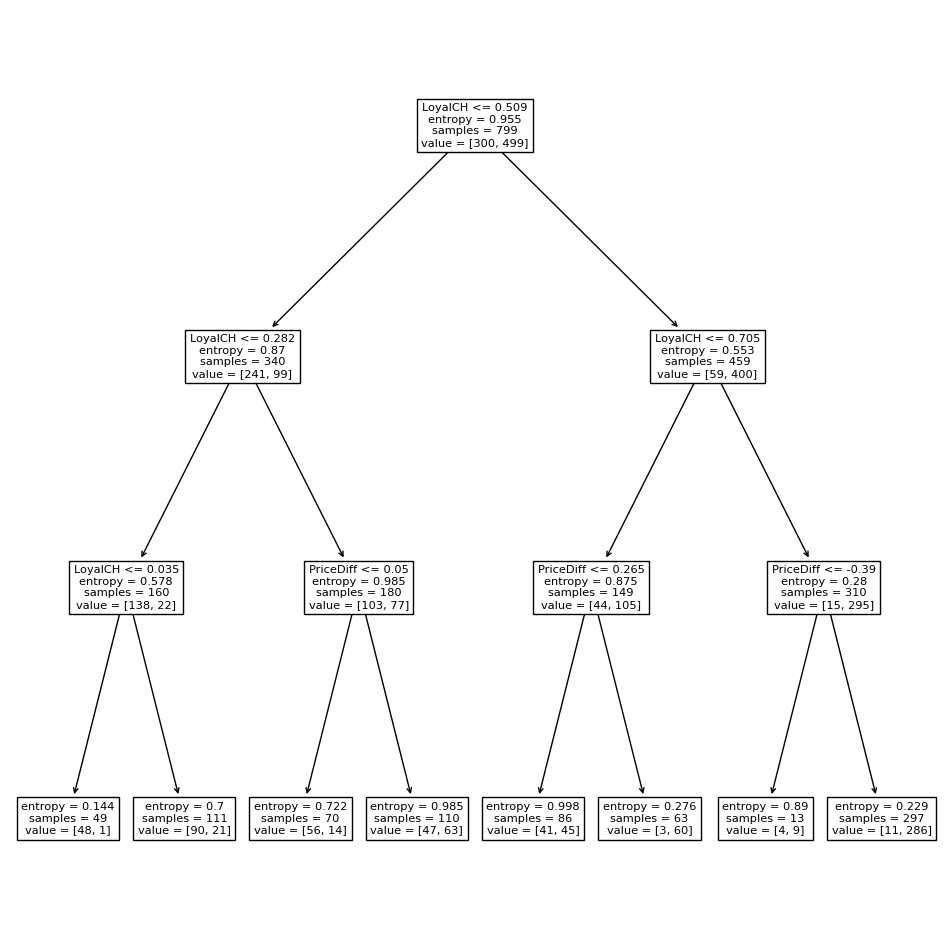

In [ ]:
ax = subplots(figsize=(12,12))[1]
plot_tree(clf, feature_names=feature_names, ax=ax)
# there are 8 terminal nodes/leafs

In [ ]:
ccp_path = clf.cost_complexity_pruning_path(X_train, y_train)
kfold = skm.KFold(5,
shuffle=True,
random_state=10)
grid = skm.GridSearchCV(clf,
{'ccp_alpha': ccp_path.ccp_alphas},
refit=True,
cv=kfold,
scoring='neg_mean_squared_error')
G = grid.fit(X_train, y_train)

MSE Train:  0.19774718397997496
MSE Test:  0.2140221402214022
<bound method BaseEstimator.get_params of DecisionTreeClassifier(ccp_alpha=0.04621818984161502, criterion='entropy',
                       max_depth=3, random_state=0)>


[Text(0.5, 0.75, 'LoyalCH <= 0.509\nentropy = 0.955\nsamples = 799\nvalue = [300, 499]'),
 Text(0.25, 0.25, 'entropy = 0.87\nsamples = 340\nvalue = [241, 99]'),
 Text(0.75, 0.25, 'entropy = 0.553\nsamples = 459\nvalue = [59, 400]')]

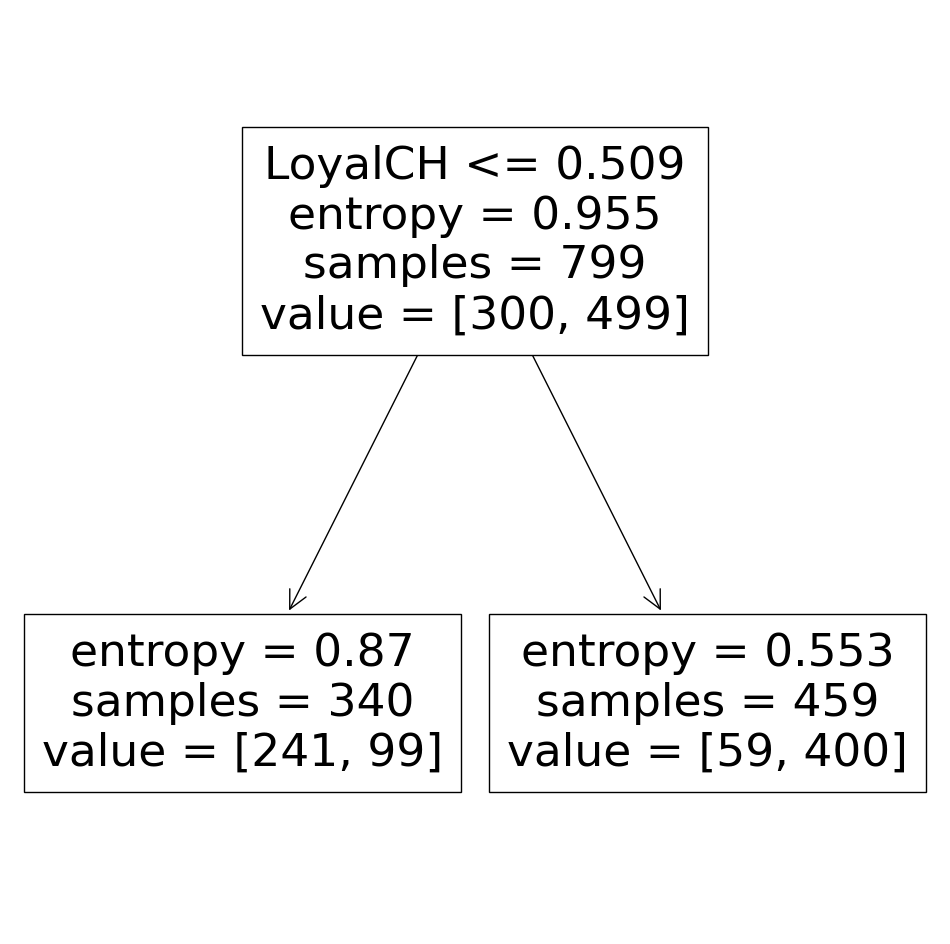

In [ ]:
best_ = grid.best_estimator_
print('MSE Train: ', np.mean((y_train - best_.predict(X_train))**2))
print('MSE Test: ', np.mean((y_test - best_.predict(X_test))**2))
print(best_.get_params)
ax = subplots(figsize=(12,12))[1]
plot_tree(best_, feature_names=feature_names, ax=ax)


In [ ]:
cv_error = []

for i in range(1, 12):
  M = DTC(criterion='entropy',max_depth=i,random_state=0)

  M_CV = cross_validate(M, X_train, y_train, cv=5)
  cv_error.append(np.mean(M_CV['test_score']))

cv_error


[0.7709355345911949,
 0.7809355345911949,
 0.795935534591195,
 0.7972248427672955,
 0.8022405660377359,
 0.794748427672956,
 0.7859748427672957,
 0.778435534591195,
 0.777130503144654,
 0.7759355345911949,
 0.7771855345911949]

# Chapter 9 Lab

In [2]:
import numpy as np
from matplotlib.pyplot import subplots, cm
import sklearn.model_selection as skm
from ISLP import load_data, confusion_table

In [3]:
from sklearn.svm import SVC
from ISLP.svm import plot as plot_svm
from sklearn.metrics import RocCurveDisplay

In [4]:
roc_curve = RocCurveDisplay.from_estimator

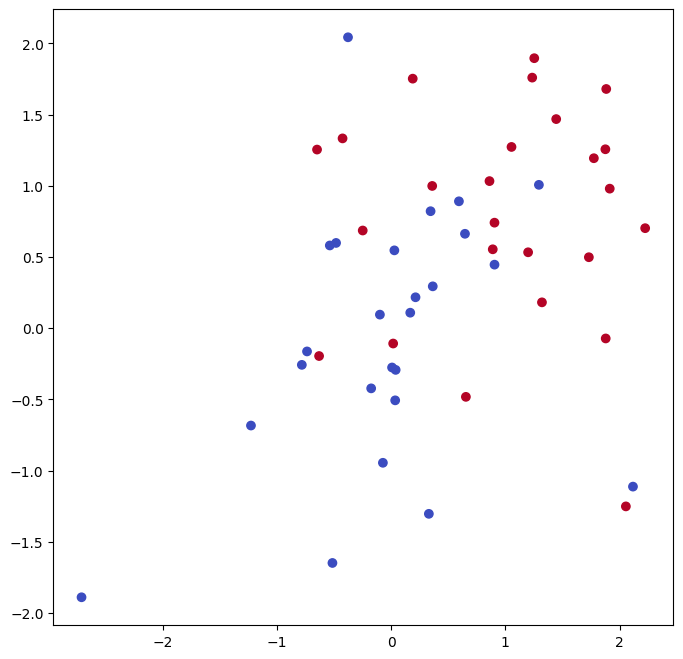

In [5]:
rng = np.random.default_rng(1)
X = rng.standard_normal((50, 2))
y = np.array([-1]*25+[1]*25)
X[y==1] += 1
fig, ax = subplots(figsize=(8,8))
ax.scatter(X[:,0],
X[:,1],
c=y,
cmap=cm.coolwarm);

In [ ]:
svm_linear = SVC(C=10, kernel='linear')
svm_linear.fit(X, y)

SVC(C=10, kernel='linear')

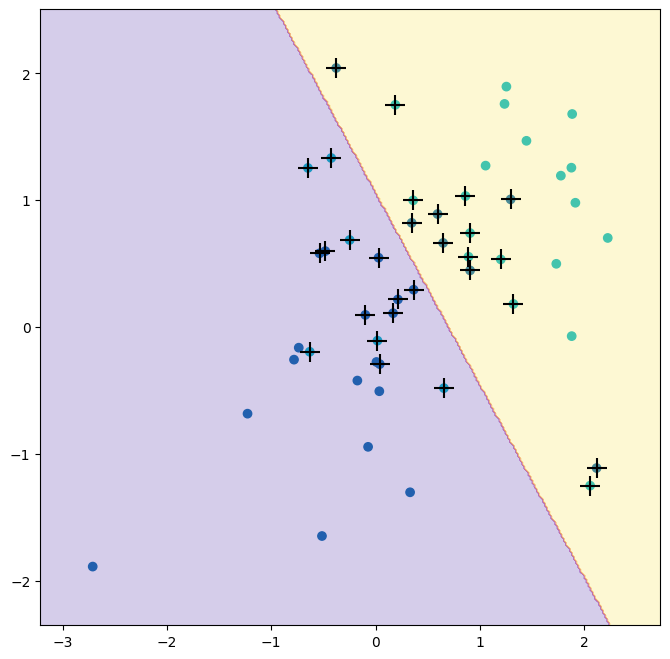

In [ ]:
fig, ax = subplots(figsize=(8,8))
plot_svm(X,
y,
svm_linear,
ax=ax)

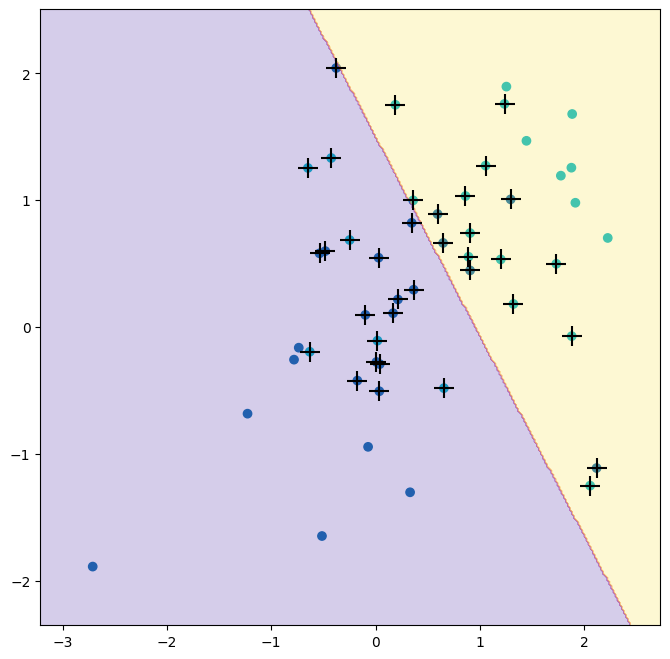

In [ ]:
svm_linear_small = SVC(C=0.1, kernel='linear')
svm_linear_small.fit(X, y)
fig, ax = subplots(figsize=(8,8))
plot_svm(X,
y,
svm_linear_small,
ax=ax)

In [ ]:
svm_linear.coef_

array([[1.17303943, 0.77348227]])

In [ ]:
kfold = skm.KFold(5,
random_state=0,
shuffle=True)
grid = skm.GridSearchCV(svm_linear,
{'C':[0.001,0.01,0.1,1,5,10,100]},
refit=True,
cv=kfold,
scoring='accuracy')
grid.fit(X, y)
grid.best_params_

{'C': 1}

In [ ]:
grid.cv_results_[('mean_test_score')]

array([0.46, 0.46, 0.72, 0.74, 0.74, 0.74, 0.74])

In [ ]:
X_test = rng.standard_normal((20, 2))
y_test = np.array([-1]*10+[1]*10)
X_test[y_test==1] += 1

In [ ]:
best_ = grid.best_estimator_
y_test_hat = best_.predict(X_test)
confusion_table(y_test_hat, y_test)

Truth,-1,1
Predicted,,
-1,8,4
1,2,6


In [ ]:
svm_ = SVC(C=0.001,
kernel='linear').fit(X, y)
y_test_hat = svm_.predict(X_test)
confusion_table(y_test_hat, y_test)

Truth,-1,1
Predicted,,
-1,2,0
1,8,10


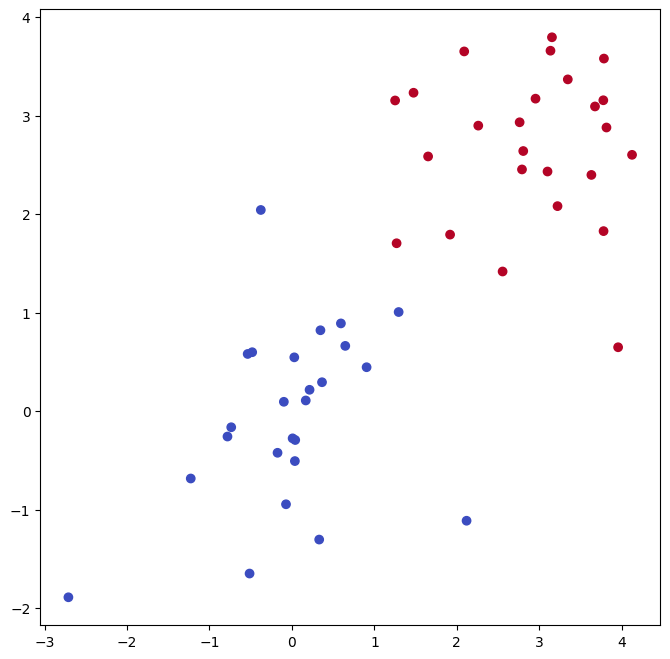

In [ ]:
X[y==1] += 1.9;
fig, ax = subplots(figsize=(8,8))
ax.scatter(X[:,0], X[:,1], c=y, cmap=cm.coolwarm);

In [ ]:
svm_ = SVC(C=1e5, kernel='linear').fit(X, y)
y_hat = svm_.predict(X)
confusion_table(y_hat, y)

Truth,-1,1
Predicted,,
-1,25,0
1,0,25


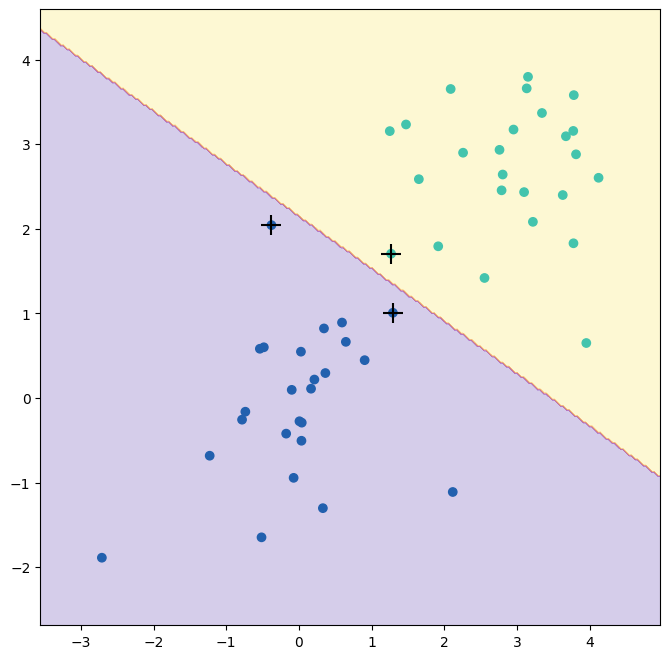

In [ ]:
fig, ax = subplots(figsize=(8,8))
plot_svm(X,
y,
svm_,
ax=ax)

In [ ]:
svm_ = SVC(C=0.1, kernel='linear').fit(X, y)
y_hat = svm_.predict(X)
confusion_table(y_hat, y)

Truth,-1,1
Predicted,,
-1,25,0
1,0,25


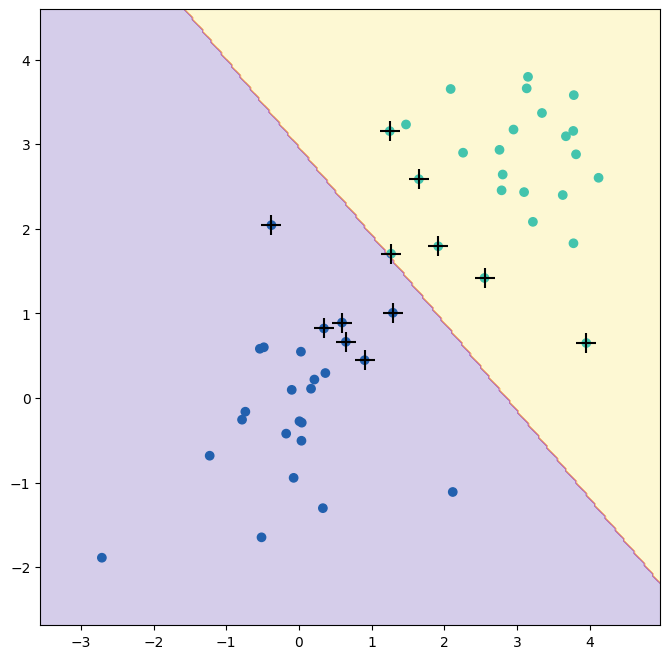

In [ ]:
fig, ax = subplots(figsize=(8,8))
plot_svm(X,
y,
svm_,
ax=ax)

In [ ]:
X = rng.standard_normal((200, 2))
X[:100] += 2
X[100:150] -= 2
y = np.array([1]*150+[2]*50)

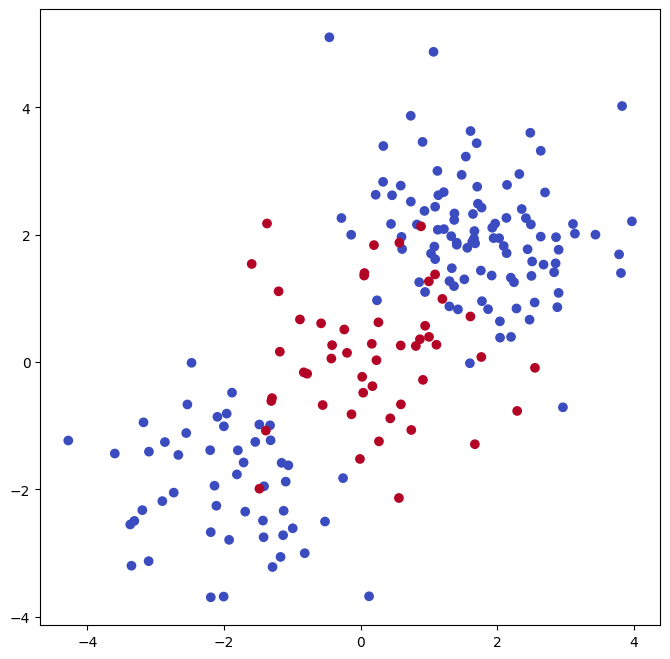

In [ ]:
fig, ax = subplots(figsize=(8,8))
ax.scatter(X[:,0],
X[:,1],
c=y,
cmap=cm.coolwarm)

In [ ]:
(X_train,
X_test,
y_train,
y_test) = skm.train_test_split(X,
y,
test_size=0.5,
random_state=0)
svm_rbf = SVC(kernel="rbf", gamma=1, C=1)
svm_rbf.fit(X_train, y_train)

SVC(C=1, gamma=1)

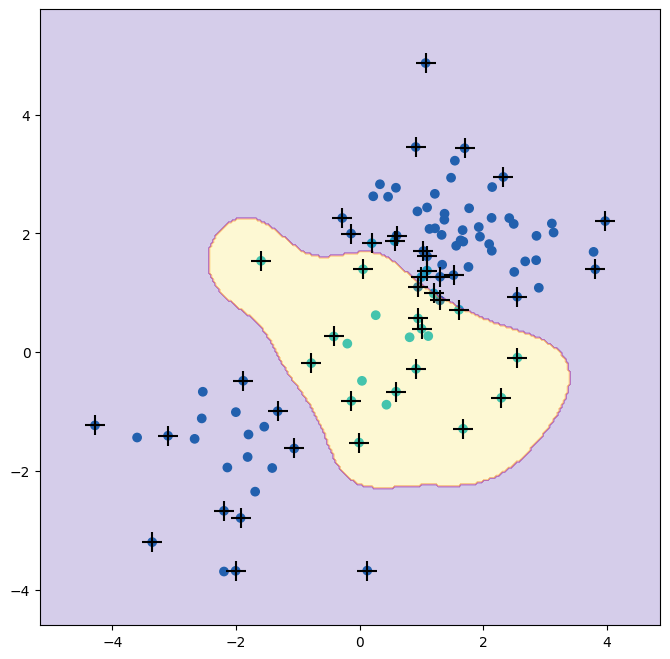

In [ ]:
fig, ax = subplots(figsize=(8,8))
plot_svm(X_train,
y_train,
svm_rbf,
ax=ax)

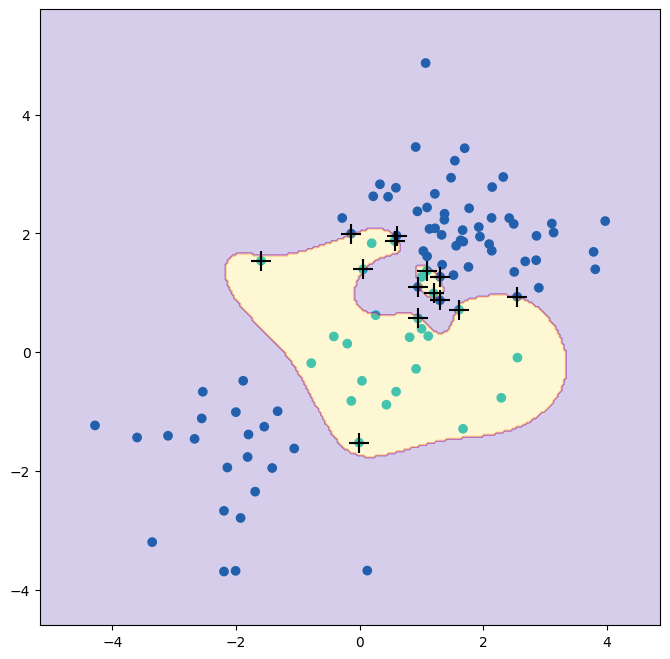

In [ ]:
svm_rbf = SVC(kernel="rbf", gamma=1, C=1e5)
svm_rbf.fit(X_train, y_train)
fig, ax = subplots(figsize=(8,8))
plot_svm(X_train,
y_train,
svm_rbf,
ax=ax)

In [ ]:
kfold = skm.KFold(5,
random_state=0,
shuffle=True)
grid = skm.GridSearchCV(svm_rbf,
{'C':[0.1,1,10,100,1000],
'gamma':[0.5,1,2,3,4]},
refit=True,
cv=kfold,
scoring='accuracy');
grid.fit(X_train, y_train)
grid.best_params_

{'C': 1, 'gamma': 0.5}

Truth,1,2
Predicted,,
1,69,6
2,6,19


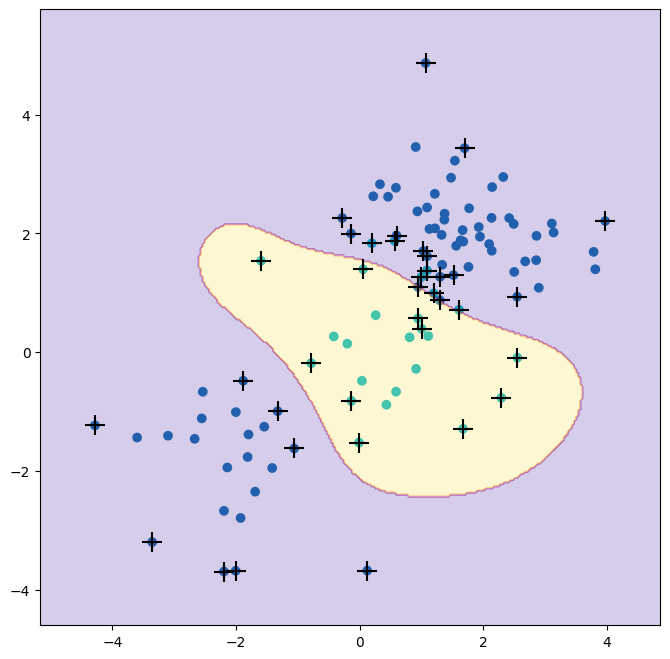

In [ ]:
best_svm = grid.best_estimator_
fig, ax = subplots(figsize=(8,8))
plot_svm(X_train,
y_train,
best_svm,
ax=ax)
y_hat_test = best_svm.predict(X_test)
confusion_table(y_hat_test, y_test)

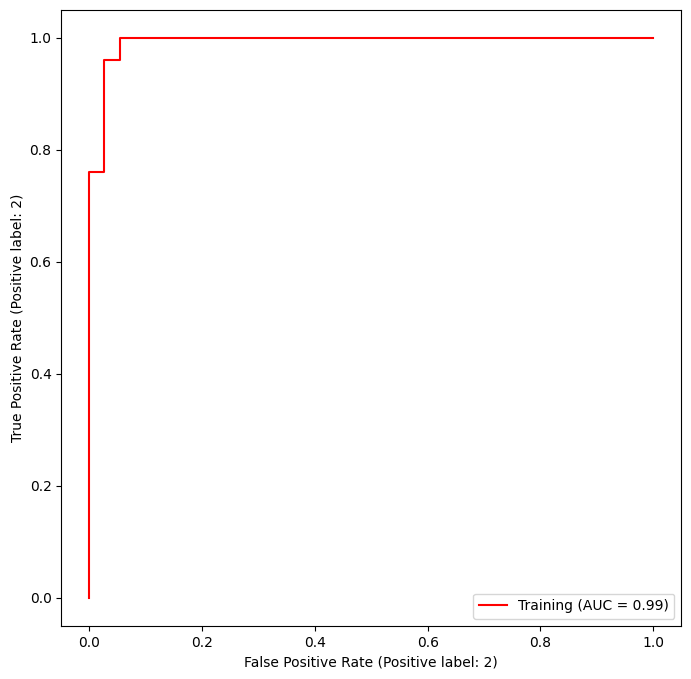

In [ ]:
fig, ax = subplots(figsize=(8,8))
roc_curve(best_svm,
X_train,
y_train,
name='Training',
color='r',
ax=ax);

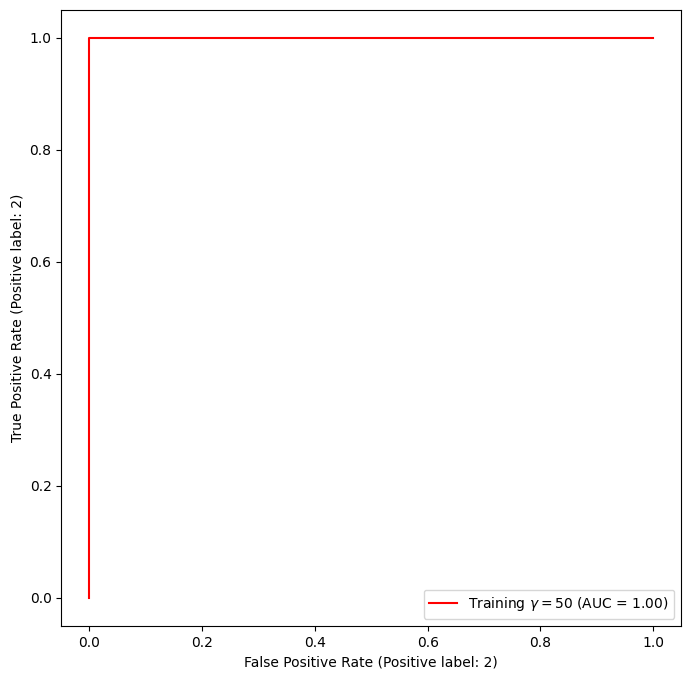

In [ ]:
svm_flex = SVC(kernel="rbf",
gamma=50,
C=1)
svm_flex.fit(X_train, y_train)
fig, ax = subplots(figsize=(8,8))
roc_curve(svm_flex,
X_train,
y_train,
name='Training $\gamma=50$',
color='r',
ax=ax);

In [ ]:
roc_curve(svm_flex,
X_test,
y_test,
name='Test $\gamma=50$',
color='b',
ax=ax)
fig;

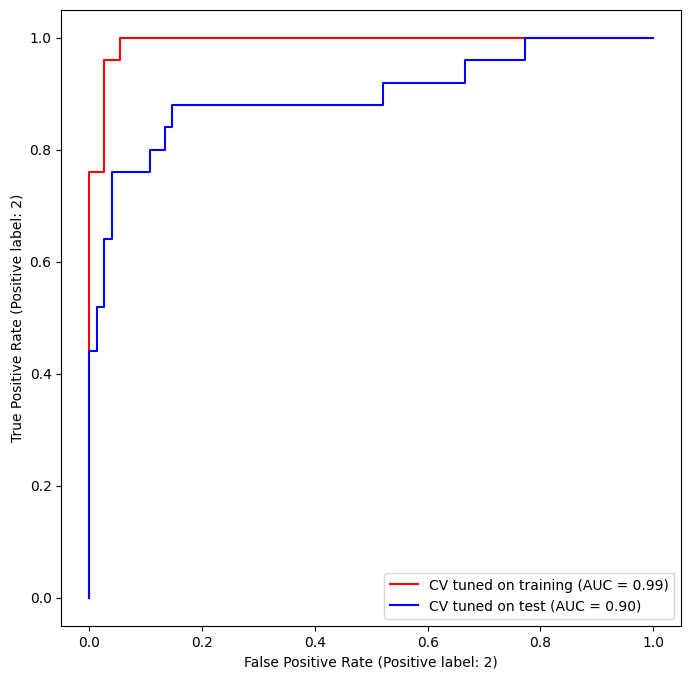

In [ ]:
fig, ax = subplots(figsize=(8,8))
for (X_, y_, c, name) in zip((X_train, X_test), (y_train, y_test), ('r', 'b'), ('CV tuned on training', 'CV tuned on test')):
  roc_curve(best_svm,
  X_,
  y_,
  name=name,
  ax=ax,
  color=c)

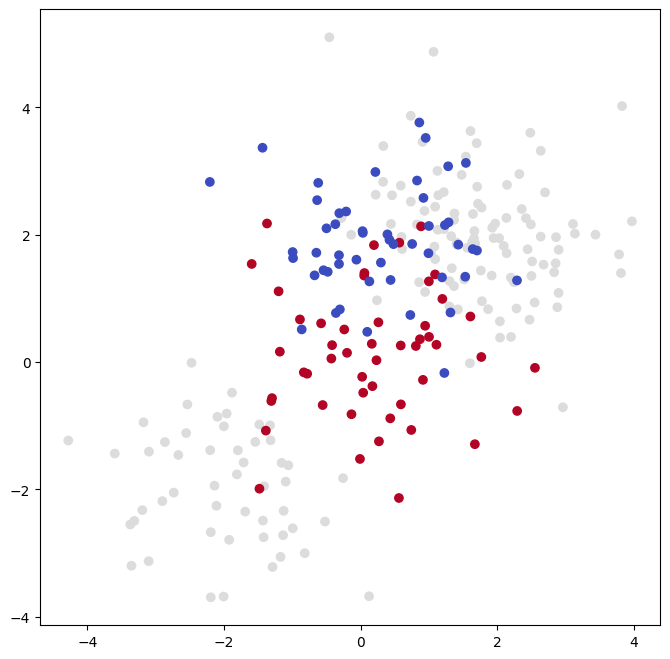

In [ ]:
rng = np.random.default_rng(123)
X = np.vstack([X, rng.standard_normal((50, 2))])
y = np.hstack([y, [0]*50])
X[y==0,1] += 2
fig, ax = subplots(figsize=(8,8))
ax.scatter(X[:,0], X[:,1], c=y, cmap=cm.coolwarm);

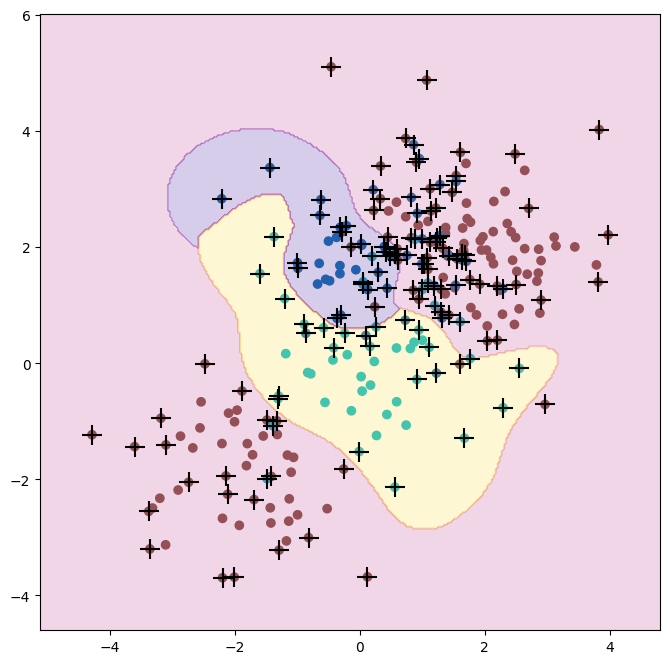

In [ ]:
svm_rbf_3 = SVC(kernel="rbf",
C=10,
gamma=1,
decision_function_shape='ovo');
svm_rbf_3.fit(X, y)
fig, ax = subplots(figsize=(8,8))
plot_svm(X,
y,
svm_rbf_3,
scatter_cmap=cm.tab10,
ax=ax)

In [ ]:
Khan = load_data('Khan')
Khan['xtrain'].shape, Khan['xtest'].shape

((63, 2308), (20, 2308))

In [ ]:
khan_linear = SVC(kernel='linear', C=10)
khan_linear.fit(Khan['xtrain'], Khan['ytrain'])
confusion_table(khan_linear.predict(Khan['xtrain']),
Khan['ytrain'])

Truth,1,2,3,4
Predicted,,,,
1,8,0,0,0
2,0,23,0,0
3,0,0,12,0
4,0,0,0,20


In [ ]:
confusion_table(khan_linear.predict(Khan['xtest']),
Khan['ytest'])

Truth,1,2,3,4
Predicted,,,,
1,3,0,0,0
2,0,6,2,0
3,0,0,4,0
4,0,0,0,5


# Chapter 9 Exercises

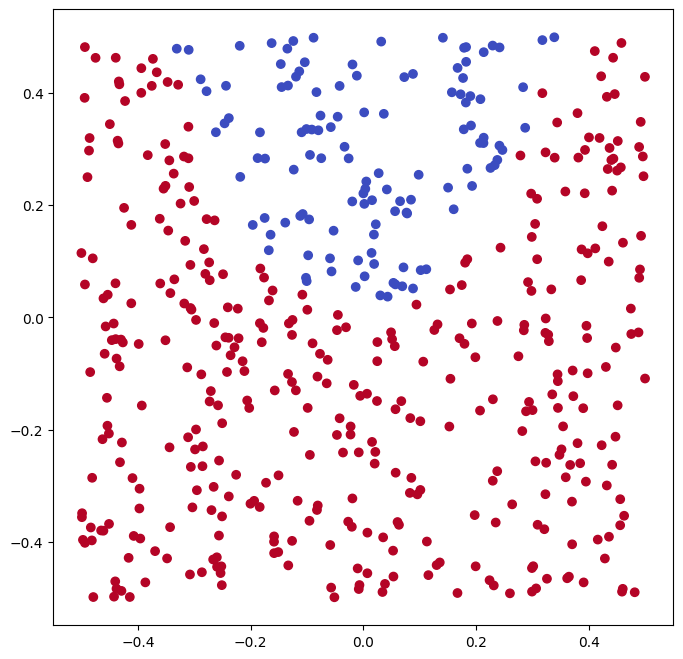

In [81]:
# 4
rng = np.random.default_rng(5)
x1 = rng.uniform(size=500) - 0.5
x2 = rng.uniform(size=500) - 0.5
y = 4*x1**2 - x2 > 0
X = np.column_stack((x1, x2))
fig, ax = subplots(figsize=(8,8))
ax.scatter(x1,
x2,
c=y,
cmap=cm.coolwarm);

Truth,False,True
Predicted,,
False,34,23
True,25,168


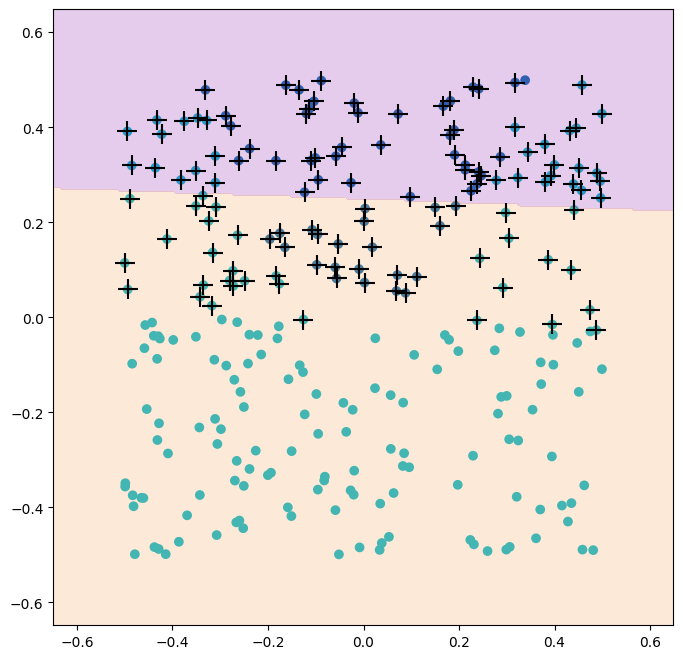

In [82]:
(X_train,
X_test,
y_train,
y_test) = skm.train_test_split(X,
y,
test_size=0.5,
random_state=0)
svm_linear = SVC(kernel="linear", gamma=1, C=1)
svm_linear.fit(X_train, y_train)
fig, ax = subplots(figsize=(8,8))
plot_svm(X_train,
y_train,
svm_linear,
ax=ax)
y_test_hat = svm_linear.predict(X_test)
confusion_table(y_test_hat, y_test)

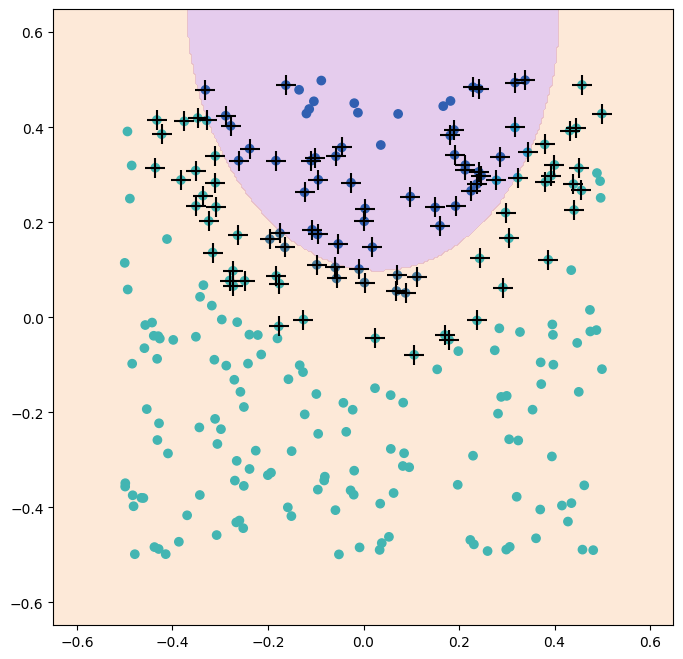

In [83]:
(X_train,
X_test,
y_train,
y_test) = skm.train_test_split(X,
y,
test_size=0.5,
random_state=0)
svm_rbf = SVC(kernel="rbf", gamma=1, C=1)
svm_rbf.fit(X_train, y_train)
fig, ax = subplots(figsize=(8,8))
plot_svm(X_train,
y_train,
svm_rbf,
ax=ax)

In [84]:
y_test_hat = svm_rbf.predict(X_test)
confusion_table(y_test_hat, y_test)

Truth,False,True
Predicted,,
False,49,0
True,10,191


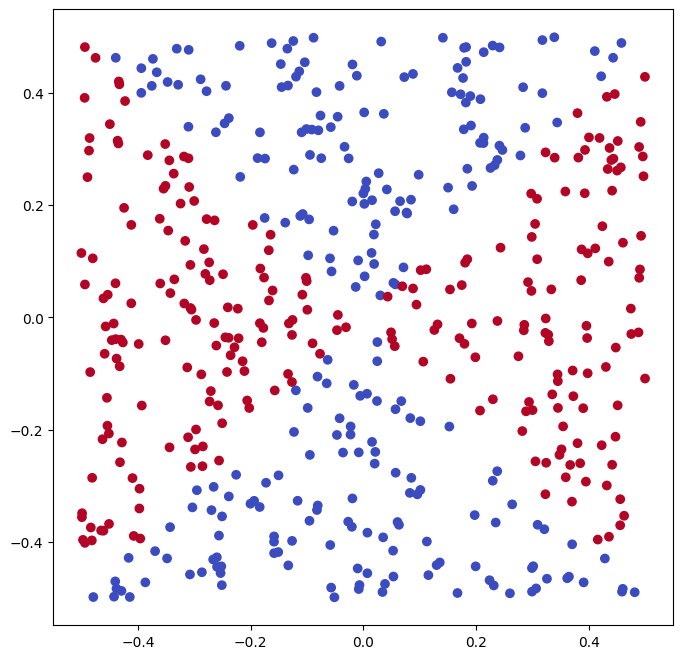

In [85]:
# 5
rng = np.random.default_rng(5)
x1 = rng.uniform(size=500) - 0.5
x2 = rng.uniform(size=500) - 0.5
y = x1**2 - x2**2 > 0
X = np.column_stack((x1, x2))
fig, ax = subplots(figsize=(8,8))
ax.scatter(x1,
x2,
c=y,
cmap=cm.coolwarm);

AttributeError: ignored

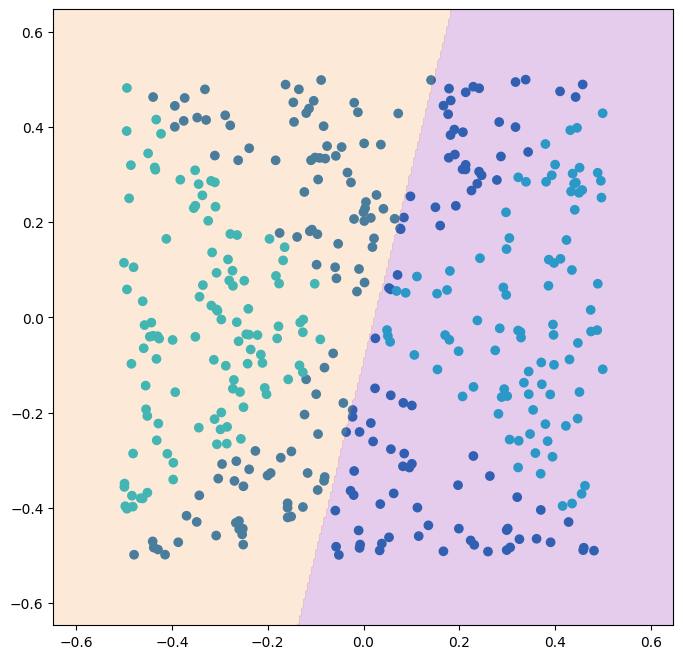

In [86]:
from sklearn.linear_model import LogisticRegression
(X_train,
X_test,
y_train,
y_test) = skm.train_test_split(X,
y,
test_size=0.2,
random_state=0)
logit = LogisticRegression(C=1e10, solver='liblinear')
logit.fit(X_train, y_train)
logit_pred = logit.predict_proba(X_train)
fig, ax = subplots(figsize=(8,8))
plot_svm(X_train,
y_train,
logit,
ax=ax)

Training accuracy: 1.00


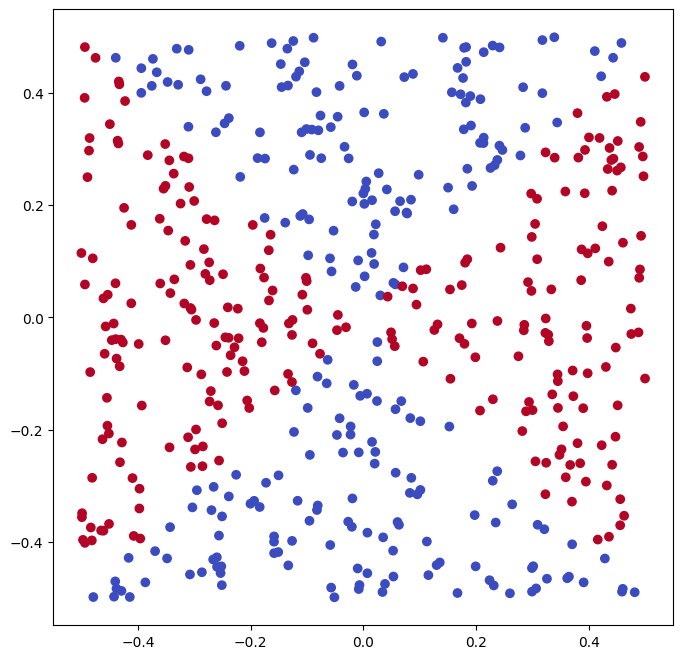

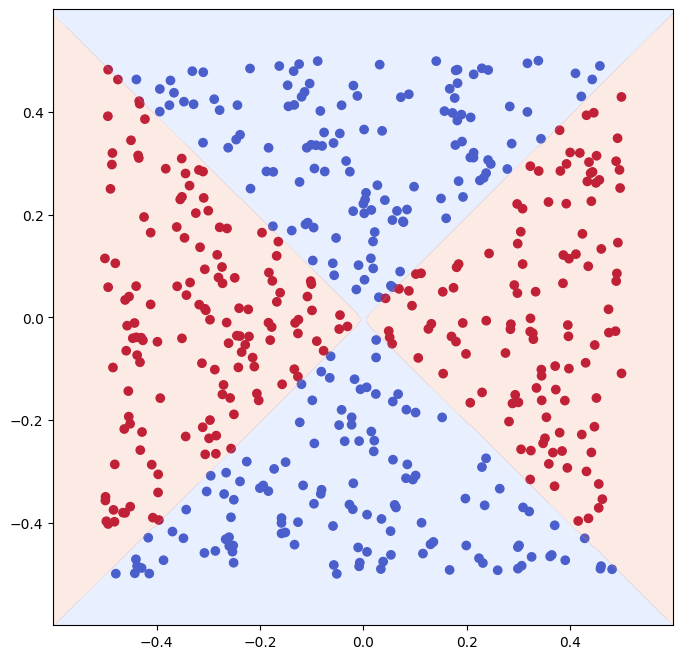

In [95]:
from sklearn.preprocessing import PolynomialFeatures

rng = np.random.default_rng(5)
x1 = rng.uniform(size=500) - 0.5
x2 = rng.uniform(size=500) - 0.5
y = x1**2 - x2**2 > 0
X = np.column_stack((x1, x2))
fig, ax = subplots(figsize=(8,8))
ax.scatter(x1,
x2,
c=y,
cmap=cm.coolwarm);
degree = 2  # Degree of polynomial features
poly = PolynomialFeatures(degree)
X_poly = poly.fit_transform(X)
(X_train,
X_test,
y_train,
y_test) = skm.train_test_split(X_poly,
y,
test_size=0.2,
random_state=0)
logit = LogisticRegression(C=1e10, solver='liblinear')
logit.fit(X_train, y_train)
logit_pred = logit.predict_proba(X_train)
x_min, x_max = x1.min() - 0.1, x1.max() + 0.1
y_min, y_max = x2.min() - 0.1, x2.max() + 0.1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500), np.linspace(y_min, y_max, 500))

mesh_poly = poly.transform(np.c_[xx.ravel(), yy.ravel()])

Z = logit.predict(mesh_poly)

Z = Z.reshape(xx.shape)
y_train_pred = logit.predict(X_train)

train_accuracy = np.mean(y_train_pred == y_train)
print(f"Training accuracy: {train_accuracy:.2f}")


fig, ax = plt.subplots(figsize=(8,8))
ax.scatter(x1, x2, c=y, cmap=plt.cm.coolwarm)

ax.contourf(xx, yy, Z, alpha=0.2, levels=[-1, 0, 1], cmap=plt.cm.coolwarm)

plt.show()

Training accuracy: 0.53


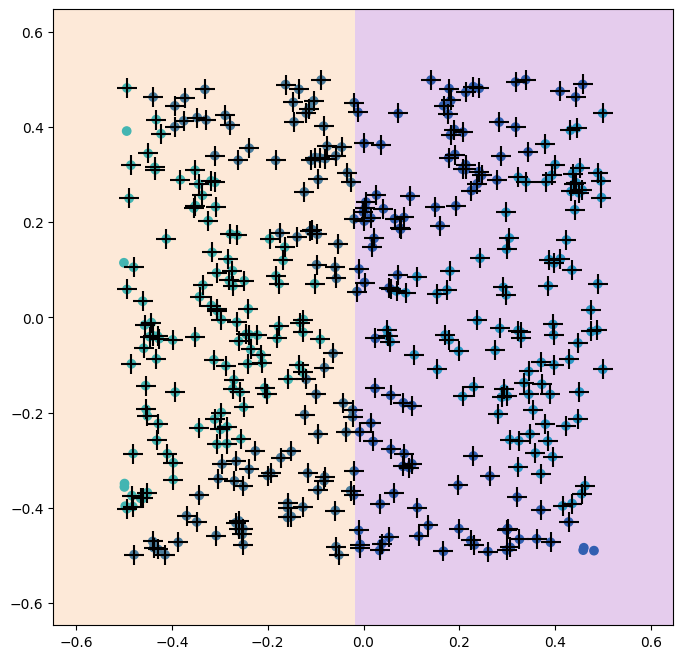

In [102]:
(X_train,
X_test,
y_train,
y_test) = skm.train_test_split(X,
y,
test_size=0.2,
random_state=0)
svm_linear = SVC(C=10, kernel='linear')
svm_linear.fit(X_train, y_train)
fig, ax = subplots(figsize=(8,8))
plot_svm(X_train,
y_train,
svm_linear,
ax=ax)
y_train_pred = svm_linear.predict(X_train)

train_accuracy = np.mean(y_train_pred == y_train)
print(f"Training accuracy: {train_accuracy:.2f}")



Training accuracy: 0.98


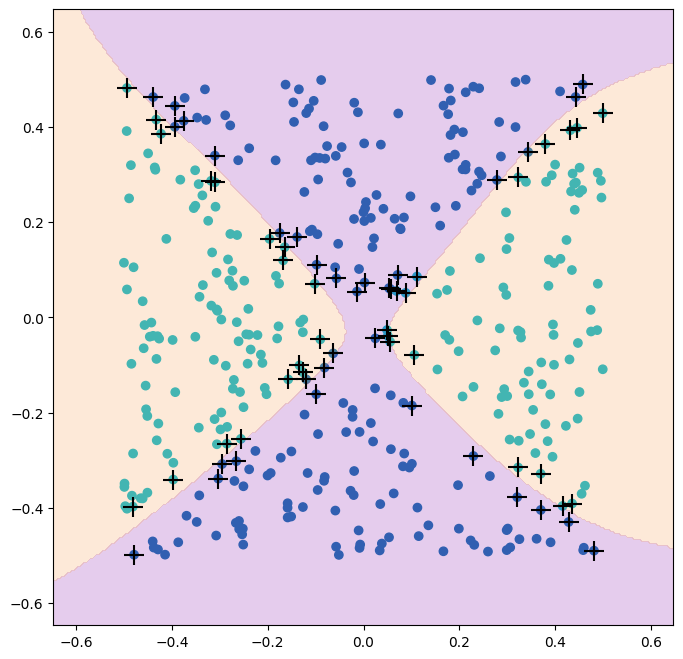

In [103]:
(X_train,
X_test,
y_train,
y_test) = skm.train_test_split(X,
y,
test_size=0.2,
random_state=0)
svm_rbf = SVC(C=10, kernel='rbf')
svm_rbf.fit(X_train, y_train)
fig, ax = subplots(figsize=(8,8))
plot_svm(X_train,
y_train,
svm_rbf,
ax=ax)
y_train_pred = svm_rbf.predict(X_train)

train_accuracy = np.mean(y_train_pred == y_train)
print(f"Training accuracy: {train_accuracy:.2f}")


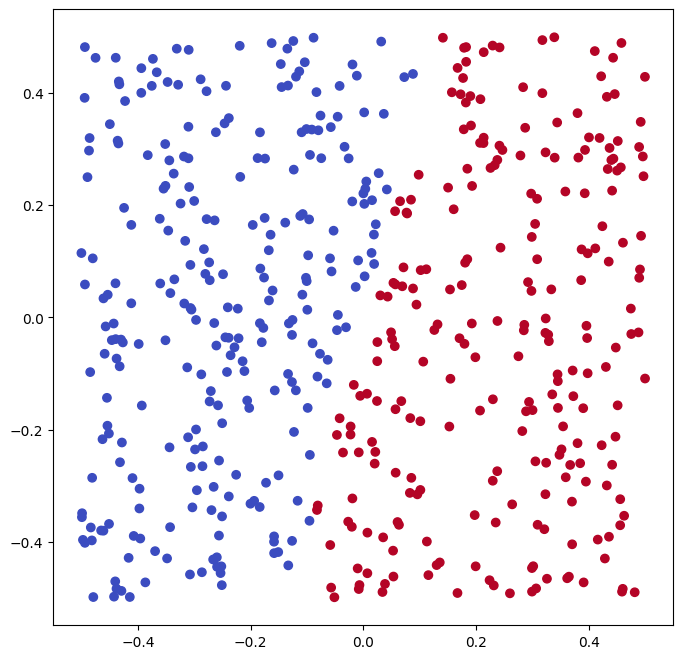

In [12]:
# 6
rng = np.random.default_rng(5)
x1 = rng.uniform(size=500) - 0.5
x2 = rng.uniform(size=500) - 0.5
y = 4*x1 - x2 > 0
X = np.column_stack((x1, x2))
(X_train,
X_test,
y_train,
y_test) = skm.train_test_split(X,
y,
test_size=0.2,
random_state=0)
fig, ax = subplots(figsize=(8,8))
ax.scatter(x1,
x2,
c=y,
cmap=cm.coolwarm);

{'C': 100}
[0.522 0.522 0.972 0.99  0.994 0.992 0.998]


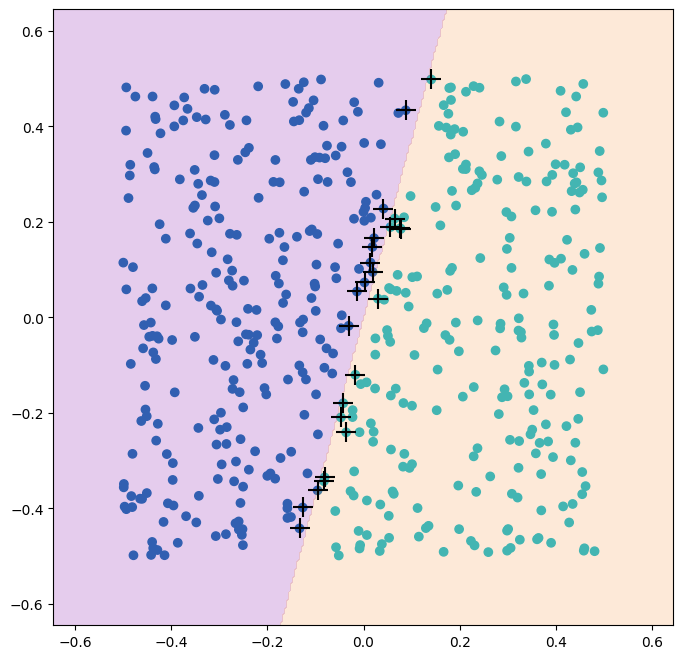

In [11]:
svm_linear = SVC(C=100, kernel='linear')
svm_linear.fit(X, y)
kfold = skm.KFold(5,
random_state=0,
shuffle=True)
grid = skm.GridSearchCV(svm_linear,
{'C':[0.001,0.01,0.1,1,5,10,100]},
refit=True,
cv=kfold,
scoring='accuracy')
grid.fit(X, y)
print(grid.best_params_)
print(grid.cv_results_[('mean_test_score')])
fig, ax = subplots(figsize=(8,8))
plot_svm(X,
y,
svm_linear,
ax=ax)
y_train_pred = svm_linear.predict(X)

{'C': 10}
[0.5275 0.5275 0.965  0.9875 0.9925 0.9975 0.9925]
Test accuracy: 1.00


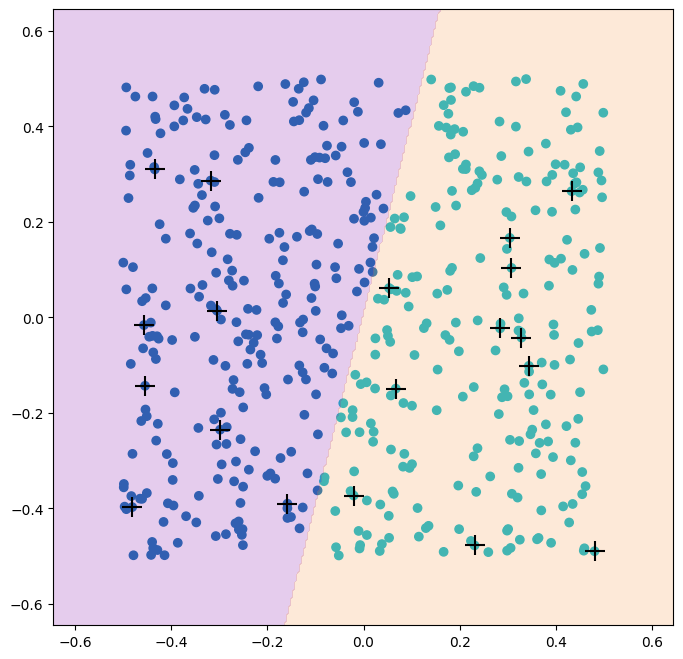

In [13]:
svm_linear = SVC(C=100, kernel='linear')
svm_linear.fit(X_train, y_train)
kfold = skm.KFold(5,
random_state=0,
shuffle=True)
grid = skm.GridSearchCV(svm_linear,
{'C':[0.001,0.01,0.1,1,5,10,100]},
refit=True,
cv=kfold,
scoring='accuracy')
grid.fit(X_train, y_train)
print(grid.best_params_)
print(grid.cv_results_[('mean_test_score')])
fig, ax = subplots(figsize=(8,8))
plot_svm(X,
y,
svm_linear,
ax=ax)
y_test_pred = svm_linear.predict(X_test)
test_accuracy = np.mean(y_test_pred == y_test)
print(f"Test accuracy: {test_accuracy:.2f}")


# Chapter 10 Lab

In [2]:
import numpy as np, pandas as pd
from matplotlib.pyplot import subplots
from sklearn.linear_model import \
(LinearRegression,
LogisticRegression,
Lasso)
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from ISLP import load_data
from ISLP.models import ModelSpec as MS
from sklearn.model_selection import \
(train_test_split,
GridSearchCV)

In [3]:
import torch
from torch import nn
from torch.optim import RMSprop
from torch.utils.data import TensorDataset

In [4]:
pip install torchinfo

In [5]:
from torchmetrics import (MeanAbsoluteError,
R2Score)
from torchinfo import summary
from torchvision.io import read_image

In [6]:
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import CSVLogger

In [7]:
pip install pytorch_lightning

In [8]:
from pytorch_lightning import seed_everything
seed_everything(0, workers=True)
torch.use_deterministic_algorithms(True, warn_only=True)

INFO:lightning_fabric.utilities.seed:Seed set to 0


In [9]:
from torchvision.datasets import MNIST, CIFAR100
from torchvision.models import (resnet50,
ResNet50_Weights)
from torchvision.transforms import (Resize,
Normalize,
CenterCrop,
ToTensor)

In [10]:
from ISLP.torch import (SimpleDataModule,
SimpleModule,
ErrorTracker,
rec_num_workers)

In [11]:
from ISLP.torch.imdb import (load_lookup,
load_tensor,
load_sparse,
load_sequential)

In [12]:
from glob import glob
import json

In [27]:
Hitters = load_data('Hitters').dropna()
n = Hitters.shape[0]

In [28]:
model = MS(Hitters.columns.drop('Salary'), intercept=False)
X = model.fit_transform(Hitters).to_numpy()
Y = Hitters['Salary'].to_numpy()

In [29]:
(X_train,
X_test,
Y_train,
Y_test) = train_test_split(X,
Y,
test_size=1/3,
random_state=1)
hit_lm = LinearRegression().fit(X_train, Y_train)
Yhat_test = hit_lm.predict(X_test)
np.abs(Yhat_test - Y_test).mean()

259.7152883314631

In [30]:
scaler = StandardScaler(with_mean=True, with_std=True)
lasso = Lasso(warm_start=True, max_iter=30000)
standard_lasso = Pipeline(steps=[('scaler', scaler),
('lasso', lasso)])

In [31]:
X_s = scaler.fit_transform(X_train)
n = X_s.shape[0]
lam_max = np.fabs(X_s.T.dot(Y_train - Y_train.mean())).max() / n
param_grid = {'alpha': np.exp(np.linspace(0, np.log(0.01), 100))
* lam_max}

In [32]:
cv = KFold(10,
shuffle=True,
random_state=1)
grid = GridSearchCV(lasso,
param_grid,
cv=cv,
scoring='neg_mean_absolute_error')
grid.fit(X_train, Y_train);

In [33]:
trained_lasso = grid.best_estimator_
Yhat_test = trained_lasso.predict(X_test)
np.fabs(Yhat_test - Y_test).mean()

257.23820107995

In [34]:
class HittersModel(nn.Module):
  def __init__(self, input_size):
    super(HittersModel , self).__init__()
    self.flatten = nn.Flatten()
    self.sequential = nn.Sequential(
      nn.Linear(input_size, 50),
      nn.ReLU(),
      nn.Dropout(0.4),
      nn.Linear(50, 1))
  def forward(self, x):
    x = self.flatten(x)
    return torch.flatten(self.sequential(x))

In [35]:
hit_model = HittersModel(X.shape[1])

In [36]:
summary(hit_model,
input_size=X_train.shape,
col_names=['input_size',
'output_size',
'num_params'])

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
HittersModel                             [175, 19]                 [175]                     --
├─Flatten: 1-1                           [175, 19]                 [175, 19]                 --
├─Sequential: 1-2                        [175, 19]                 [175, 1]                  --
│    └─Linear: 2-1                       [175, 19]                 [175, 50]                 1,000
│    └─ReLU: 2-2                         [175, 50]                 [175, 50]                 --
│    └─Dropout: 2-3                      [175, 50]                 [175, 50]                 --
│    └─Linear: 2-4                       [175, 50]                 [175, 1]                  51
Total params: 1,051
Trainable params: 1,051
Non-trainable params: 0
Total mult-adds (M): 0.18
Input size (MB): 0.01
Forward/backward pass size (MB): 0.07
Params size (MB): 0.00
Estimated Total Size (MB): 0.09

In [37]:
X_train_t = torch.tensor(X_train.astype(np.float32))
Y_train_t = torch.tensor(Y_train.astype(np.float32))
hit_train = TensorDataset(X_train_t, Y_train_t)

In [38]:
X_test_t = torch.tensor(X_test.astype(np.float32))
Y_test_t = torch.tensor(Y_test.astype(np.float32))
hit_test = TensorDataset(X_test_t, Y_test_t)

In [39]:
max_num_workers = rec_num_workers()

In [40]:
hit_dm = SimpleDataModule(hit_train,
hit_test,
batch_size=32,
num_workers=min(4, max_num_workers),
validation=hit_test)

In [41]:
hit_module = SimpleModule.regression(hit_model,
metrics={'mae':MeanAbsoluteError()})

In [44]:
hit_logger = CSVLogger('logs', name='hitters')

In [45]:
hit_trainer = Trainer(deterministic=True,
  max_epochs=50,
  log_every_n_steps=5,
  logger=hit_logger,
  callbacks=[ErrorTracker()])
hit_trainer.fit(hit_module, datamodule=hit_dm)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type         | Params
---------------------------------------
0 | model | HittersModel | 1.1 K 
1 | loss  | MSELoss      | 0     
---------------------------------------
1.1 K     Trainable params
0         Non-trainable params
1.1 K     Total params
0.004     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


In [46]:
hit_trainer.test(hit_module, datamodule=hit_dm)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │      104098.5703125       │
│         test_mae          │    229.50115966796875     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 104098.5703125, 'test_mae': 229.50115966796875}]

In [47]:
hit_results = pd.read_csv(hit_logger.experiment.metrics_file_path)

In [13]:
def summary_plot(results,ax,col='loss',valid_legend='Validation',training_legend='Training',ylabel='Loss',fontsize=20):
  for (column,color,label) in zip([f'train_{col}_epoch',f'valid_{col}'],['black','red'],[training_legend,valid_legend]):
    results.plot(x='epoch',
    y=column,
    label=label,
    marker='o',
    color=color,
    ax=ax)
  ax.set_xlabel('Epoch')
  ax.set_ylabel(ylabel)
  return ax

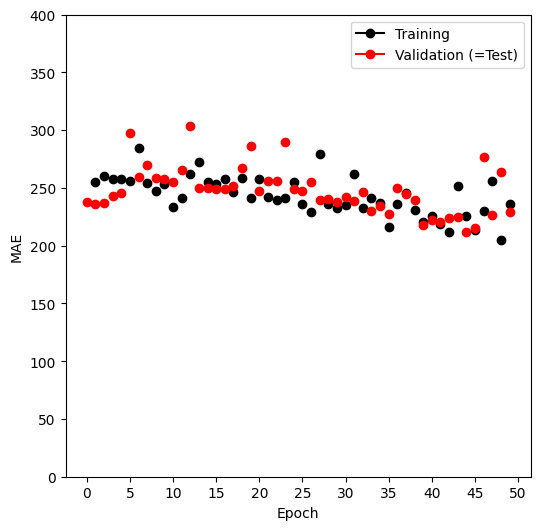

In [50]:
fig, ax = subplots(1, 1, figsize=(6, 6))
ax = summary_plot(hit_results,
ax,
col='mae',
ylabel='MAE',
valid_legend='Validation (=Test)')
ax.set_ylim([0, 400])
ax.set_xticks(np.linspace(0, 50, 11).astype(int));

In [51]:
hit_model.eval()
preds = hit_module(X_test_t)
torch.abs(Y_test_t - preds).mean()

tensor(229.5012, grad_fn=<MeanBackward0>)

In [52]:
del(Hitters,
hit_model, hit_dm,
hit_logger,
hit_test, hit_train,
X, Y,
X_test, X_train,
Y_test, Y_train,
X_test_t, Y_test_t,
hit_trainer, hit_module)

In [53]:
(mnist_train,
mnist_test) = [MNIST(root='data',
train=train,
download=True,
transform=ToTensor())
for train in [True, False]]
mnist_train

100%|██████████| 9912422/9912422 [00:00<00:00, 100441163.49it/s]


Extracting data/MNIST/raw/train-images-idx3-ubyte.gz to data/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 50097474.70it/s]

Extracting data/MNIST/raw/train-labels-idx1-ubyte.gz to data/MNIST/raw




100%|██████████| 1648877/1648877 [00:00<00:00, 27541721.01it/s]


Extracting data/MNIST/raw/t10k-images-idx3-ubyte.gz to data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 11609097.36it/s]

Extracting data/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/MNIST/raw



Dataset MNIST
    Number of datapoints: 60000
    Root location: data
    Split: Train
    StandardTransform
Transform: ToTensor()

In [54]:
mnist_dm = SimpleDataModule(mnist_train,
mnist_test,
validation=0.2,
num_workers=max_num_workers,
batch_size=256)

In [55]:
for idx, (X_ ,Y_) in enumerate(mnist_dm.train_dataloader()):
  print('X: ', X_.shape)
  print('Y: ', Y_.shape)
  if idx >= 1:
    break

X:  torch.Size([256, 1, 28, 28])
Y:  torch.Size([256])
X:  torch.Size([256, 1, 28, 28])
Y:  torch.Size([256])


In [56]:
class MNISTModel(nn.Module):
  def __init__(self):
    super(MNISTModel, self).__init__()
    self.layer1 = nn.Sequential(
    nn.Flatten(),
    nn.Linear(28*28, 256),
    nn.ReLU(),
    nn.Dropout(0.4))
    self.layer2 = nn.Sequential(
    nn.Linear(256, 128),
    nn.ReLU(),
    nn.Dropout(0.3))
    self._forward = nn.Sequential(
    self.layer1,
    self.layer2,
    nn.Linear(128, 10))
  def forward(self, x):
    return self._forward(x)

In [57]:
mnist_model = MNISTModel()

In [58]:
mnist_model(X_).size()

torch.Size([256, 10])

In [59]:
summary(mnist_model,
input_data=X_,
col_names=['input_size',
'output_size',
'num_params'])

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
MNISTModel                               [256, 1, 28, 28]          [256, 10]                 --
├─Sequential: 1-1                        [256, 1, 28, 28]          [256, 10]                 --
│    └─Sequential: 2-1                   [256, 1, 28, 28]          [256, 256]                --
│    │    └─Flatten: 3-1                 [256, 1, 28, 28]          [256, 784]                --
│    │    └─Linear: 3-2                  [256, 784]                [256, 256]                200,960
│    │    └─ReLU: 3-3                    [256, 256]                [256, 256]                --
│    │    └─Dropout: 3-4                 [256, 256]                [256, 256]                --
│    └─Sequential: 2-2                   [256, 256]                [256, 128]                --
│    │    └─Linear: 3-5                  [256, 256]                [256, 128]                32,896
│    │    └─ReLU: 3-6     

In [61]:
mnist_module = SimpleModule.classification(mnist_model, 10)
mnist_logger = CSVLogger('logs', name='MNIST')

In [62]:
mnist_trainer = Trainer(deterministic=True,
max_epochs=30,
logger=mnist_logger,
callbacks=[ErrorTracker()])
mnist_trainer.fit(mnist_module,
datamodule=mnist_dm)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type             | Params
-------------------------------------------
0 | model | MNISTModel       | 235 K 
1 | loss  | CrossEntropyLoss | 0     
-------------------------------------------
235 K     Trainable params
0         Non-trainable params
235 K     Total params
0.941     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


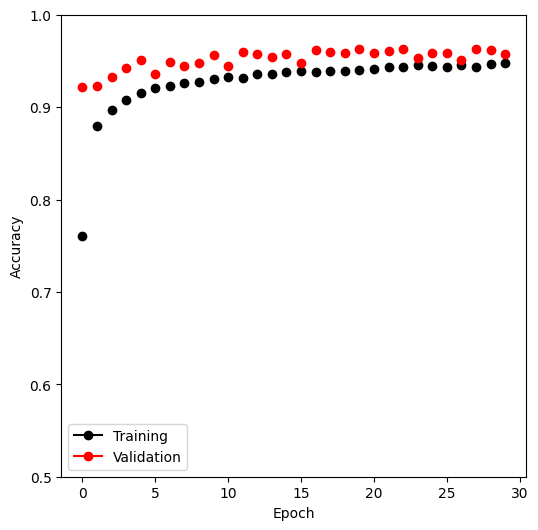

In [63]:
mnist_results = pd.read_csv(mnist_logger.experiment.
metrics_file_path)
fig, ax = subplots(1, 1, figsize=(6, 6))
summary_plot(mnist_results,
ax,
col='accuracy',
ylabel='Accuracy')
ax.set_ylim([0.5, 1])
ax.set_ylabel('Accuracy')
ax.set_xticks(np.linspace(0, 30, 7).astype(int));

In [64]:
mnist_trainer.test(mnist_module,
datamodule=mnist_dm)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9599000215530396     │
│         test_loss         │    0.16808855533599854    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.16808855533599854, 'test_accuracy': 0.9599000215530396}]

In [66]:
class MNIST_MLR(nn.Module):
  def __init__(self):
    super(MNIST_MLR, self).__init__()
    self.linear = nn.Sequential(nn.Flatten(),
    nn.Linear(784, 10))
  def forward(self, x):
    return self.linear(x)
mlr_model = MNIST_MLR()
mlr_module = SimpleModule.classification(mlr_model, 10)
mlr_logger = CSVLogger('logs', name='MNIST_MLR')

In [67]:
mlr_trainer = Trainer(deterministic=True,
max_epochs=30,
callbacks=[ErrorTracker()])
mlr_trainer.fit(mlr_module, datamodule=mnist_dm)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type             | Params
-------------------------------------------
0 | model | MNIST_MLR        | 7.9 K 
1 | loss  | CrossEntropyLoss | 0     
-------------------------------------------
7.9 K     Trainable params
0         Non-trainable params
7.9 K     Total params
0.031     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


In [68]:
mlr_trainer.test(mlr_module,
datamodule=mnist_dm)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.9142000079154968     │
│         test_loss         │    0.3529835641384125     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.3529835641384125, 'test_accuracy': 0.9142000079154968}]

In [69]:
del(mnist_test,
mnist_train,
mnist_model,
mnist_dm,
mnist_trainer,
mnist_module,
mnist_results,
mlr_model,
mlr_module,
mlr_trainer)

In [70]:
(cifar_train,
cifar_test) = [CIFAR100(root="data",
train=train,
download=True)
for train in [True, False]]

100%|██████████| 169001437/169001437 [00:02<00:00, 73327790.97it/s]


Extracting data/cifar-100-python.tar.gz to data
Files already downloaded and verified


In [71]:
transform = ToTensor()
cifar_train_X = torch.stack([transform(x) for x in
cifar_train.data])
cifar_test_X = torch.stack([transform(x) for x in
cifar_test.data])
cifar_train = TensorDataset(cifar_train_X,
torch.tensor(cifar_train.targets))
cifar_test = TensorDataset(cifar_test_X,
torch.tensor(cifar_test.targets))

In [72]:
cifar_dm = SimpleDataModule(cifar_train,
cifar_test,
validation=0.2,
num_workers=max_num_workers,
batch_size=128)

In [73]:
for idx, (X_ ,Y_) in enumerate(cifar_dm.train_dataloader()):
  print('X: ', X_.shape)
  print('Y: ', Y_.shape)
  if idx >= 1:
    break

X:  torch.Size([128, 3, 32, 32])
Y:  torch.Size([128])
X:  torch.Size([128, 3, 32, 32])
Y:  torch.Size([128])


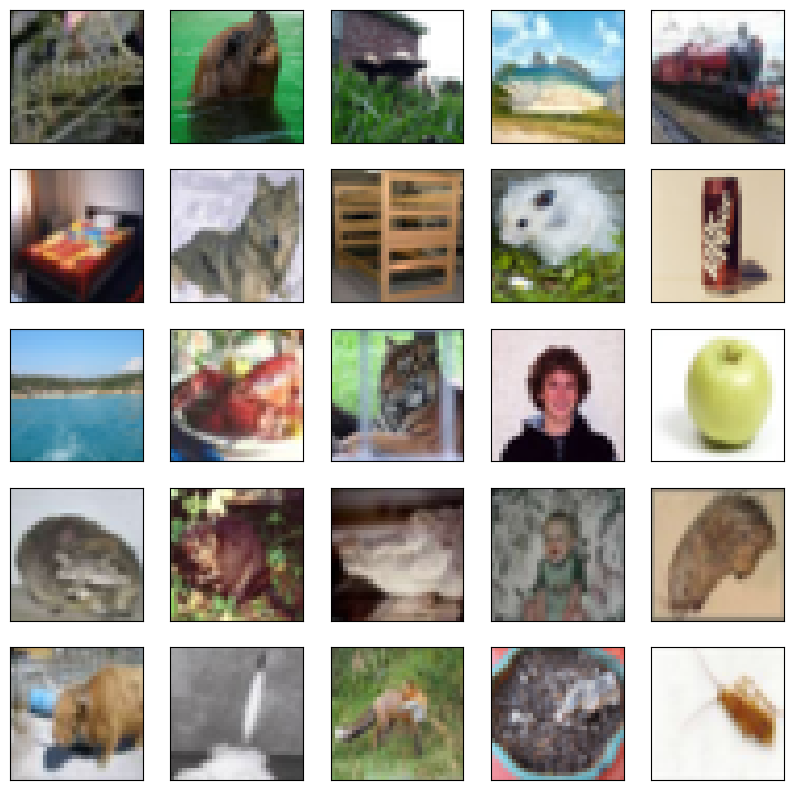

In [74]:
fig, axes = subplots(5, 5, figsize=(10,10))
rng = np.random.default_rng(4)
indices = rng.choice(np.arange(len(cifar_train)), 25,
replace=False).reshape((5,5))
for i in range(5):
  for j in range(5):
    idx = indices[i,j]
    axes[i,j].imshow(np.transpose(cifar_train[idx][0],
    [1,2,0]),
    interpolation=None)
    axes[i,j].set_xticks([])
    axes[i,j].set_yticks([])

In [75]:
class BuildingBlock(nn.Module):
  def __init__(self,
    in_channels,
    out_channels):
    super(BuildingBlock , self).__init__()
    self.conv = nn.Conv2d(in_channels=in_channels,
    out_channels=out_channels,
    kernel_size=(3,3),
    padding='same')
    self.activation = nn.ReLU()
    self.pool = nn.MaxPool2d(kernel_size=(2,2))
  def forward(self, x):
    return self.pool(self.activation(self.conv(x)))

In [76]:
class CIFARModel(nn.Module):
  def __init__(self):
    super(CIFARModel, self).__init__()
    sizes = [(3,32),
    (32,64),
    (64,128),
    (128,256)]
    self.conv = nn.Sequential(*[BuildingBlock(in_, out_)
    for in_, out_ in sizes])
    self.output = nn.Sequential(nn.Dropout(0.5),
    nn.Linear(2*2*256, 512),
    nn.ReLU(),
    nn.Linear(512, 100))
  def forward(self, x):
    val = self.conv(x)
    val = torch.flatten(val, start_dim=1)
    return self.output(val)

In [77]:
cifar_model = CIFARModel()
summary(cifar_model,
input_data=X_,
col_names=['input_size',
'output_size',
'num_params'])

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
CIFARModel                               [128, 3, 32, 32]          [128, 100]                --
├─Sequential: 1-1                        [128, 3, 32, 32]          [128, 256, 2, 2]          --
│    └─BuildingBlock: 2-1                [128, 3, 32, 32]          [128, 32, 16, 16]         --
│    │    └─Conv2d: 3-1                  [128, 3, 32, 32]          [128, 32, 32, 32]         896
│    │    └─ReLU: 3-2                    [128, 32, 32, 32]         [128, 32, 32, 32]         --
│    │    └─MaxPool2d: 3-3               [128, 32, 32, 32]         [128, 32, 16, 16]         --
│    └─BuildingBlock: 2-2                [128, 32, 16, 16]         [128, 64, 8, 8]           --
│    │    └─Conv2d: 3-4                  [128, 32, 16, 16]         [128, 64, 16, 16]         18,496
│    │    └─ReLU: 3-5                    [128, 64, 16, 16]         [128, 64, 16, 16]         --
│    │    └─MaxPool2d: 3-6    

In [80]:
cifar_optimizer = RMSprop(cifar_model.parameters(), lr=0.001)
cifar_module = SimpleModule.classification(cifar_model, 100,
optimizer=cifar_optimizer)
cifar_logger = CSVLogger('logs', name='CIFAR100')

In [81]:
cifar_trainer = Trainer(deterministic=True,
max_epochs=30,
logger=cifar_logger,
callbacks=[ErrorTracker()])
cifar_trainer.fit(cifar_module,
datamodule=cifar_dm)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type             | Params
-------------------------------------------
0 | model | CIFARModel       | 964 K 
1 | loss  | CrossEntropyLoss | 0     
-------------------------------------------
964 K     Trainable params
0         Non-trainable params
964 K     Total params
3.858     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


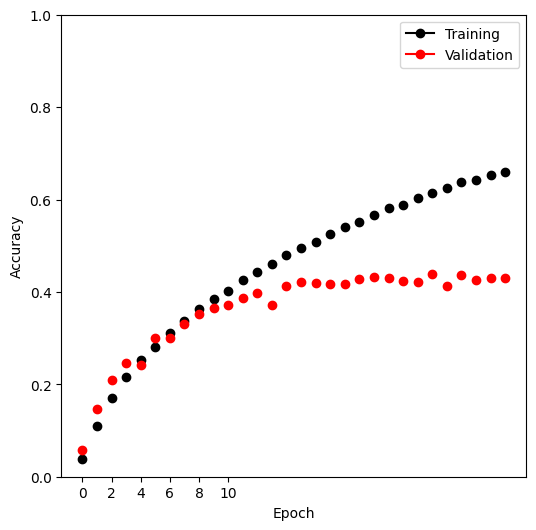

In [82]:
log_path = cifar_logger.experiment.metrics_file_path
cifar_results = pd.read_csv(log_path)
fig, ax = subplots(1, 1, figsize=(6, 6))
summary_plot(cifar_results,
ax,
col='accuracy',
ylabel='Accuracy')
ax.set_xticks(np.linspace(0, 10, 6).astype(int))
ax.set_ylabel('Accuracy')
ax.set_ylim([0, 1]);

In [83]:
cifar_trainer.test(cifar_module,
datamodule=cifar_dm)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.4341000020503998     │
│         test_loss         │    2.4116294384002686     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 2.4116294384002686, 'test_accuracy': 0.4341000020503998}]

In [85]:
try:
  for name, metric in cifar_module.metrics.items():
    cifar_module.metrics[name] = metric.to('mps')
    cifar_trainer_mps = Trainer(accelerator='mps',
    deterministic=True,
    max_epochs=30)
    cifar_trainer_mps.fit(cifar_module,
    datamodule=cifar_dm)
    cifar_trainer_mps.test(cifar_module,
    datamodule=cifar_dm)
except:
  pass

In [86]:
resize = Resize((232,232))
crop = CenterCrop(224)
normalize = Normalize([0.485,0.456,0.406],
[0.229,0.224,0.225])
imgfiles = sorted([f for f in glob('book_images/*')])
imgs = torch.stack([torch.div(crop(resize(read_image(f))), 255)
for f in imgfiles])
imgs = normalize(imgs)
imgs.size()

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


torch.Size([5, 3, 224, 224])

In [87]:
resnet_model = resnet50(weights=ResNet50_Weights.DEFAULT)
summary(resnet_model,
input_data=imgs,
col_names=['input_size',
'output_size',
'num_params'])

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 70.1MB/s]


Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
ResNet                                   [5, 3, 224, 224]          [5, 1000]                 --
├─Conv2d: 1-1                            [5, 3, 224, 224]          [5, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [5, 64, 112, 112]         [5, 64, 112, 112]         128
├─ReLU: 1-3                              [5, 64, 112, 112]         [5, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [5, 64, 112, 112]         [5, 64, 56, 56]           --
├─Sequential: 1-5                        [5, 64, 56, 56]           [5, 256, 56, 56]          --
│    └─Bottleneck: 2-1                   [5, 64, 56, 56]           [5, 256, 56, 56]          --
│    │    └─Conv2d: 3-1                  [5, 64, 56, 56]           [5, 64, 56, 56]           4,096
│    │    └─BatchNorm2d: 3-2             [5, 64, 56, 56]           [5, 64, 56, 56]           128
│    │    └─ReLU: 3-3      

In [88]:
resnet_model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [89]:
img_preds = resnet_model(imgs)

In [90]:
img_probs = np.exp(np.asarray(img_preds.detach()))
img_probs /= img_probs.sum(1)[:,None]

In [92]:
labs = json.load(open('imagenet_class_index.json'))
class_labels = pd.DataFrame([(int(k), v[1]) for k, v in
labs.items()],
columns=['idx', 'label'])
class_labels = class_labels.set_index('idx')
class_labels = class_labels.sort_index()

In [93]:
for i, imgfile in enumerate(imgfiles):
  img_df = class_labels.copy()
  img_df['prob'] = img_probs[i]
  img_df = img_df.sort_values(by='prob', ascending=False)[:3]
  print(f'Image: {imgfile}')
  print(img_df.reset_index().drop(columns=['idx']))

Image: book_images/Cape_Weaver.jpg
       label      prob
0    jacamar  0.278446
1  bee_eater  0.047996
2     bulbul  0.039498
Image: book_images/Hawk_Fountain.jpg
            label      prob
0  great_grey_owl  0.281751
1            kite  0.042450
2        fountain  0.029365
Image: book_images/Hawk_cropped.jpg
    label      prob
0    kite  0.296996
1     jay  0.125642
2  magpie  0.015672
Image: book_images/Lhasa_Apso.jpg
             label      prob
0            Lhasa  0.150383
1         Shih-Tzu  0.129369
2  Tibetan_terrier  0.103728
Image: book_images/Sleeping_Cat.jpg
       label      prob
0      tabby  0.172481
1  tiger_cat  0.110877
2    doormat  0.089043


In [94]:
del(cifar_test,
cifar_train,
cifar_dm,
cifar_module,
cifar_logger,
cifar_optimizer,
cifar_trainer)

In [12]:
(imdb_seq_train,
imdb_seq_test) = load_sequential(root='data/IMDB')
padded_sample = np.asarray(imdb_seq_train.tensors[0][0])
sample_review = padded_sample[padded_sample > 0][:12]
sample_review[:12]

Retrieving "IMDB_S_train.tensor.gz" from "http://imdb.jtaylor.su.domains/jtaylor/data/".
Retrieving "IMDB_S_test.tensor.gz" from "http://imdb.jtaylor.su.domains/jtaylor/data/".
Retrieving "IMDB_Y_test.npy" from "http://imdb.jtaylor.su.domains/jtaylor/data/".
Retrieving "IMDB_Y_train.npy" from "http://imdb.jtaylor.su.domains/jtaylor/data/".


array([   1,   14,   22,   16,   43,  530,  973, 1622, 1385,   65,  458,
       4468], dtype=int32)

In [13]:
lookup = load_lookup(root='data/IMDB')
' '.join(lookup[i] for i in sample_review)

Retrieving "IMDB_word_index.pkl" from "http://imdb.jtaylor.su.domains/jtaylor/data/".


"<START> this film was just brilliant casting location scenery story direction everyone's"

In [14]:
max_num_workers=10
(imdb_train,
imdb_test) = load_tensor(root='data/IMDB')
imdb_dm = SimpleDataModule(imdb_train,
imdb_test,
validation=2000,
num_workers=min(6, max_num_workers),
batch_size=512)

Retrieving "IMDB_X_test.tensor.gz" from "http://imdb.jtaylor.su.domains/jtaylor/data/".
Retrieving "IMDB_X_train.tensor.gz" from "http://imdb.jtaylor.su.domains/jtaylor/data/".


In [16]:
class IMDBModel(nn.Module):
  def __init__(self, input_size):
    super(IMDBModel, self).__init__()
    self.dense1 = nn.Linear(input_size, 16)
    self.activation = nn.ReLU()
    self.dense2 = nn.Linear(16, 16)
    self.output = nn.Linear(16, 1)
  def forward(self, x):
    val = x
    for _map in [self.dense1,
    self.activation,
    self.dense2,
    self.activation,
    self.output]:
      val = _map(val)
    return torch.flatten(val)

In [17]:
imdb_model = IMDBModel(imdb_test.tensors[0].size()[1])
summary(imdb_model,
input_size=imdb_test.tensors[0].size(),
col_names=['input_size',
'output_size',
'num_params'])

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
IMDBModel                                [25000, 10003]            [25000]                   --
├─Linear: 1-1                            [25000, 10003]            [25000, 16]               160,064
├─ReLU: 1-2                              [25000, 16]               [25000, 16]               --
├─Linear: 1-3                            [25000, 16]               [25000, 16]               272
├─ReLU: 1-4                              [25000, 16]               [25000, 16]               --
├─Linear: 1-5                            [25000, 16]               [25000, 1]                17
Total params: 160,353
Trainable params: 160,353
Non-trainable params: 0
Total mult-adds (G): 4.01
Input size (MB): 1000.30
Forward/backward pass size (MB): 6.60
Params size (MB): 0.64
Estimated Total Size (MB): 1007.54

In [18]:
imdb_optimizer = RMSprop(imdb_model.parameters(), lr=0.001)
imdb_module = SimpleModule.binary_classification(
imdb_model,
optimizer=imdb_optimizer)

In [19]:
imdb_logger = CSVLogger('logs', name='IMDB')
imdb_trainer = Trainer(deterministic=True,
max_epochs=30,
logger=imdb_logger,
callbacks=[ErrorTracker()])
imdb_trainer.fit(imdb_module,
datamodule=imdb_dm)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type              | Params
--------------------------------------------
0 | model | IMDBModel         | 160 K 
1 | loss  | BCEWithLogitsLoss | 0     
--------------------------------------------
160 K     Trainable params
0         Non-trainable params
160 K     Total params
0.641     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:293: The number of training batches (45) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


In [29]:
test_results = imdb_trainer.test(imdb_module, datamodule=imdb_dm)
test_results

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │    0.8501200079917908     │
│         test_loss         │     1.086783766746521     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 1.086783766746521, 'test_accuracy': 0.8501200079917908}]

In [30]:
((X_train, Y_train),
(X_valid, Y_valid),
(X_test, Y_test)) = load_sparse(validation=2000,
random_state=0,
root='data/IMDB')

In [31]:
lam_max = np.abs(X_train.T * (Y_train - Y_train.mean())).max()
lam_val = lam_max * np.exp(np.linspace(np.log(1),
np.log(1e-4), 50))

In [32]:
logit = LogisticRegression(penalty='l1',
C=1/lam_max,
solver='liblinear',
warm_start=True,
fit_intercept=True)

In [33]:
coefs = []
intercepts = []
for l in lam_val:
  logit.C = 1/l
  logit.fit(X_train, Y_train)
  coefs.append(logit.coef_.copy())
  intercepts.append(logit.intercept_)

In [34]:
coefs = np.squeeze(coefs)
intercepts = np.squeeze(intercepts)

In [35]:
%%capture
fig, axes = subplots(1, 2, figsize=(16, 8), sharey=True)
for ((X_, Y_),data_,color) in zip([(X_train, Y_train),(X_valid, Y_valid),(X_test, Y_test)],['Training', 'Validation', 'Test'],['black', 'red', 'blue']):
  linpred_ = X_ * coefs.T + intercepts[None,:]
  label_ = np.array(linpred_ > 0)
  accuracy_ = np.array([np.mean(Y_ == l) for l in label_.T])
  axes[0].plot(-np.log(lam_val / X_train.shape[0]),
  accuracy_,
  '.--',
  color=color,
  markersize=13,
  linewidth=2,
  label=data_)
axes[0].legend()
axes[0].set_xlabel(r'$-\log(\lambda)$', fontsize=20)
axes[0].set_ylabel('Accuracy', fontsize=20)

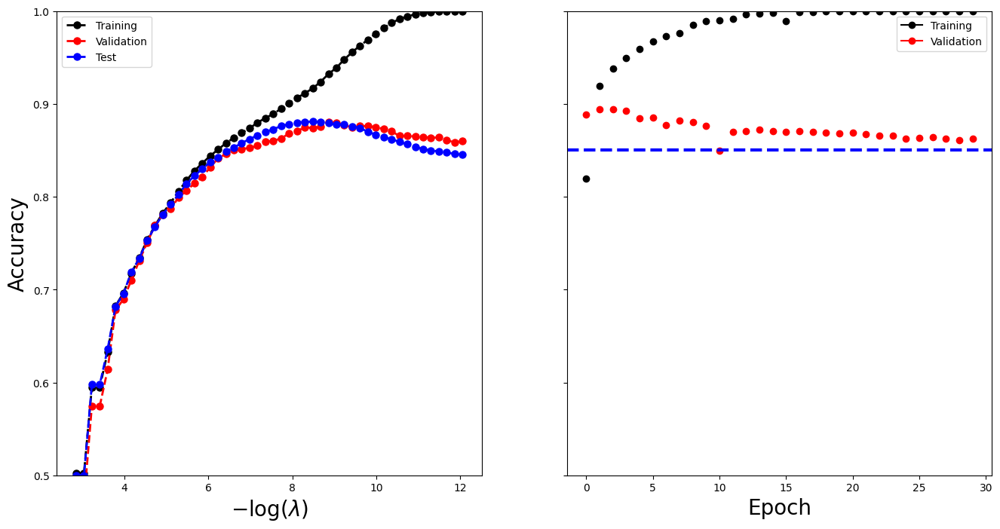

In [36]:
imdb_results = pd.read_csv(imdb_logger.experiment.metrics_file_path)
summary_plot(imdb_results,
axes[1],
col='accuracy',
ylabel='Accuracy')
axes[1].set_xticks(np.linspace(0, 30, 7).astype(int))
axes[1].set_ylabel('Accuracy', fontsize=20)
axes[1].set_xlabel('Epoch', fontsize=20)
axes[1].set_ylim([0.5, 1]);
axes[1].axhline(test_results[0]['test_accuracy'],
color='blue',
linestyle='--',
linewidth=3)
fig

In [37]:
del(imdb_model,
imdb_trainer,
imdb_logger,
imdb_dm,
imdb_train,
imdb_test)

In [38]:
imdb_seq_dm = SimpleDataModule(imdb_seq_train,
imdb_seq_test,
validation=2000,
batch_size=300,
num_workers=min(6, max_num_workers)
)

In [39]:
class LSTMModel(nn.Module):
  def __init__(self, input_size):
    super(LSTMModel, self).__init__()
    self.embedding = nn.Embedding(input_size, 32)
    self.lstm = nn.LSTM(input_size=32,
    hidden_size=32,
    batch_first=True)
    self.dense = nn.Linear(32, 1)
  def forward(self, x):
    val, (h_n, c_n) = self.lstm(self.embedding(x))
    return torch.flatten(self.dense(val[:,-1]))

In [40]:
lstm_model = LSTMModel(X_test.shape[-1])
summary(lstm_model,
input_data=imdb_seq_train.tensors[0][:10],
col_names=['input_size',
'output_size',
'num_params'])

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
LSTMModel                                [10, 500]                 [10]                      --
├─Embedding: 1-1                         [10, 500]                 [10, 500, 32]             320,096
├─LSTM: 1-2                              [10, 500, 32]             [10, 500, 32]             8,448
├─Linear: 1-3                            [10, 32]                  [10, 1]                   33
Total params: 328,577
Trainable params: 328,577
Non-trainable params: 0
Total mult-adds (M): 45.44
Input size (MB): 50.00
Forward/backward pass size (MB): 2.56
Params size (MB): 1.31
Estimated Total Size (MB): 53.87

In [41]:
lstm_module = SimpleModule.binary_classification(lstm_model)
lstm_logger = CSVLogger('logs', name='IMDB_LSTM')

In [42]:
lstm_trainer = Trainer(deterministic=True,
max_epochs=20,
logger=lstm_logger,
callbacks=[ErrorTracker()])
lstm_trainer.fit(lstm_module,
datamodule=imdb_seq_dm)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type              | Params
--------------------------------------------
0 | model | LSTMModel         | 328 K 
1 | loss  | BCEWithLogitsLoss | 0     
--------------------------------------------
328 K     Trainable params
0         Non-trainable params
328 K     Total params
1.314     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


In [43]:
lstm_trainer.test(lstm_module, datamodule=imdb_seq_dm)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       test_accuracy       │     0.843280017375946     │
│         test_loss         │    0.7541177272796631     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.7541177272796631, 'test_accuracy': 0.843280017375946}]

(0.5, 1.0)

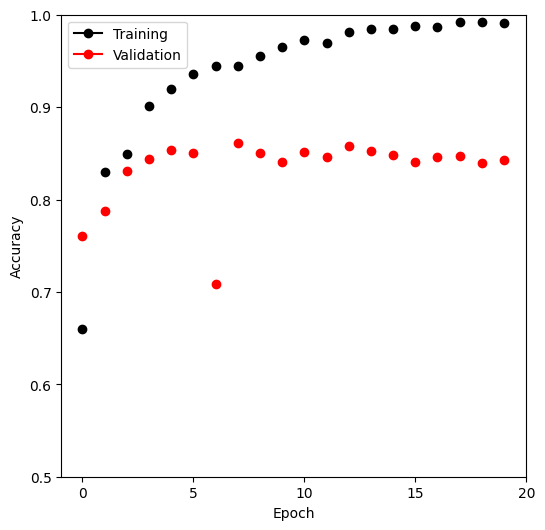

In [44]:
lstm_results = pd.read_csv(lstm_logger.experiment.metrics_file_path)
fig, ax = subplots(1, 1, figsize=(6, 6))
summary_plot(lstm_results,
ax,
col='accuracy',
ylabel='Accuracy')
ax.set_xticks(np.linspace(0, 20, 5).astype(int))
ax.set_ylabel('Accuracy')
ax.set_ylim([0.5, 1])

In [45]:
del(lstm_model,
lstm_trainer,
lstm_logger,
imdb_seq_dm,
imdb_seq_train,
imdb_seq_test)

In [15]:
NYSE = load_data('NYSE')
cols = ['DJ_return', 'log_volume', 'log_volatility']
X = pd.DataFrame(StandardScaler(
with_mean=True,
with_std=True).fit_transform(NYSE[cols]),
columns=NYSE[cols].columns,
index=NYSE.index)

In [16]:
for lag in range(1, 6):
  for col in cols:
    newcol = np.zeros(X.shape[0]) * np.nan
    newcol[lag:] = X[col].values[:-lag]
    X.insert(len(X.columns), "{0}_{1}".format(col, lag), newcol)
X.insert(len(X.columns), 'train', NYSE['train'])
X = X.dropna()

In [17]:
Y, train = X['log_volume'], X['train']
X = X.drop(columns=['train'] + cols)
X.columns

Index(['DJ_return_1', 'log_volume_1', 'log_volatility_1', 'DJ_return_2',
       'log_volume_2', 'log_volatility_2', 'DJ_return_3', 'log_volume_3',
       'log_volatility_3', 'DJ_return_4', 'log_volume_4', 'log_volatility_4',
       'DJ_return_5', 'log_volume_5', 'log_volatility_5'],
      dtype='object')

In [19]:
M = LinearRegression()
M.fit(X[train], Y[train])
M.score(X[-train], Y[-train])

0.4128912938562521

In [20]:
X_day = pd.merge(X,
pd.get_dummies(NYSE['day_of_week']),
on='date')
M.fit(X_day[train], Y[train])
M.score(X_day[-train], Y[-train])

0.4595563133053274

In [21]:
ordered_cols = []
for lag in range(5,0,-1):
  for col in cols:
    ordered_cols.append('{0}_{1}'.format(col, lag))
X = X.reindex(columns=ordered_cols)
X.columns

Index(['DJ_return_5', 'log_volume_5', 'log_volatility_5', 'DJ_return_4',
       'log_volume_4', 'log_volatility_4', 'DJ_return_3', 'log_volume_3',
       'log_volatility_3', 'DJ_return_2', 'log_volume_2', 'log_volatility_2',
       'DJ_return_1', 'log_volume_1', 'log_volatility_1'],
      dtype='object')

In [22]:
X_rnn = X.to_numpy().reshape((-1,5,3))
X_rnn.shape

(6046, 5, 3)

In [26]:
class NYSEModel(nn.Module):
  def __init__(self):
    super(NYSEModel, self).__init__()
    self.rnn = nn.RNN(3,
    12,
    batch_first=True)
    self.dense = nn.Linear(12, 1)
    self.dropout = nn.Dropout(0.1)
  def forward(self, x):
    val, h_n = self.rnn(x)
    val = self.dense(self.dropout(val[:,-1]))
    return torch.flatten(val)
nyse_model = NYSEModel()

In [24]:
datasets = []
for mask in [train, -train]:
  X_rnn_t = torch.tensor(X_rnn[mask].astype(np.float32))
  Y_t = torch.tensor(Y[mask].astype(np.float32))
  datasets.append(TensorDataset(X_rnn_t, Y_t))
nyse_train, nyse_test = datasets

In [27]:
summary(nyse_model,
input_data=X_rnn_t,
col_names=['input_size',
'output_size',
'num_params'])

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
NYSEModel                                [1770, 5, 3]              [1770]                    --
├─RNN: 1-1                               [1770, 5, 3]              [1770, 5, 12]             204
├─Dropout: 1-2                           [1770, 12]                [1770, 12]                --
├─Linear: 1-3                            [1770, 12]                [1770, 1]                 13
Total params: 217
Trainable params: 217
Non-trainable params: 0
Total mult-adds (M): 1.83
Input size (MB): 0.11
Forward/backward pass size (MB): 0.86
Params size (MB): 0.00
Estimated Total Size (MB): 0.97

In [29]:
max_num_workers = rec_num_workers()
nyse_dm = SimpleDataModule(nyse_train,
nyse_test,
num_workers=min(4, max_num_workers),
validation=nyse_test,
batch_size=64)

In [30]:
for idx, (x, y) in enumerate(nyse_dm.train_dataloader()):
  out = nyse_model(x)
  print(y.size(), out.size())
  if idx >= 2:
    break

torch.Size([64]) torch.Size([64])
torch.Size([64]) torch.Size([64])
torch.Size([64]) torch.Size([64])


In [31]:
nyse_optimizer = RMSprop(nyse_model.parameters(),
lr=0.001)
nyse_module = SimpleModule.regression(nyse_model,
optimizer=nyse_optimizer,
metrics={'r2':R2Score()})

In [32]:
nyse_trainer = Trainer(deterministic=True,
max_epochs=200,
callbacks=[ErrorTracker()])
nyse_trainer.fit(nyse_module,
datamodule=nyse_dm)
nyse_trainer.test(nyse_module,
datamodule=nyse_dm)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type      | Params
------------------------------------
0 | model | NYSEModel | 217   
1 | loss  | MSELoss   | 0     
------------------------------------
217       Trainable params
0         Non-trainable params
217       Total params
0.001     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=200` reached.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    0.6140583157539368     │
│          test_r2          │    0.41722869873046875    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.6140583157539368, 'test_r2': 0.41722869873046875}]

In [33]:
datasets = []
for mask in [train, -train]:
  X_day_t = torch.tensor(
  np.asarray(X_day[mask]).astype(np.float32))
  Y_t = torch.tensor(np.asarray(Y[mask]).astype(np.float32))
  datasets.append(TensorDataset(X_day_t, Y_t))
day_train, day_test = datasets

In [34]:
day_dm = SimpleDataModule(day_train,
day_test,
num_workers=min(4, max_num_workers),
validation=day_test,
batch_size=64)

In [35]:
class NonLinearARModel(nn.Module):
  def __init__(self):
    super(NonLinearARModel , self).__init__()
    self._forward = nn.Sequential(nn.Flatten(),
    nn.Linear(20, 32),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(32, 1))
  def forward(self, x):
    return torch.flatten(self._forward(x))

In [36]:
nl_model = NonLinearARModel()
nl_optimizer = RMSprop(nl_model.parameters(),
lr=0.001)
nl_module = SimpleModule.regression(nl_model,
optimizer=nl_optimizer,
metrics={'r2':R2Score()})

In [37]:
nl_trainer = Trainer(deterministic=True,
max_epochs=20,
callbacks=[ErrorTracker()])
nl_trainer.fit(nl_module, datamodule=day_dm)
nl_trainer.test(nl_module, datamodule=day_dm)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type             | Params
-------------------------------------------
0 | model | NonLinearARModel | 705   
1 | loss  | MSELoss          | 0     
-------------------------------------------
705       Trainable params
0         Non-trainable params
705       Total params
0.003     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    0.5595942735671997     │
│          test_r2          │    0.46891772747039795    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.5595942735671997, 'test_r2': 0.46891772747039795}]

# Chapter 10 Exercises

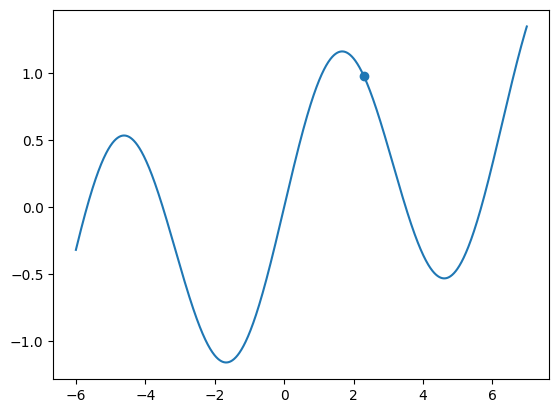

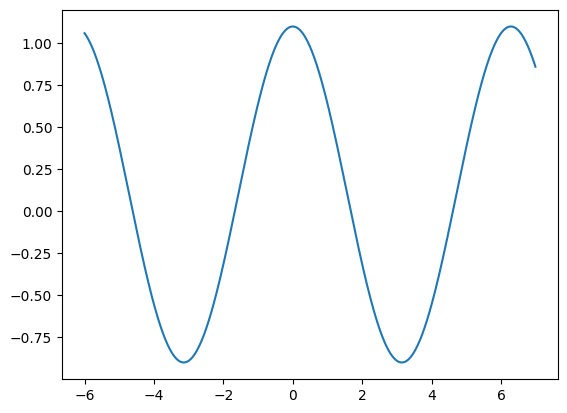

In [6]:
# 6
# a
import matplotlib.pyplot as plt
import math
import numpy as np

X = list(np.arange(-6, 7, .01))
def y(X):
  return [math.sin(x) + x/10 for x in X]
plt.plot(X, y(X))
plt.scatter([2.3], y([2.3]))
plt.show()

# b
def dy(X):
  return [math.cos(x) + 1/10 for x in X]
plt.plot(X, dy(X))
plt.show()

In [15]:
# c + d
def minimize(b0, X, y, dy):
  plt.plot(X, y(X))
  plt.scatter([b0], y([b0]))
  plt.show()
  learning_rate = .1
  for i in range(100):
    if dy([b0])[0] < 0.1 and dy([b0])[0] > -0.1:
      plt.plot(X, y(X))
      plt.scatter([b0], y([b0]))
      plt.show()
      print(b0)
      break
    elif dy([b0])[0] > 0:
      b0 -= learning_rate
      plt.plot(X, y(X))
      plt.scatter([b0], y([b0]))
      plt.show()
    elif dy([b0])[0] < 0:
      b0 += learning_rate
      plt.plot(X, y(X))
      plt.scatter([b0], y([b0]))
      plt.show()
    print(b0)

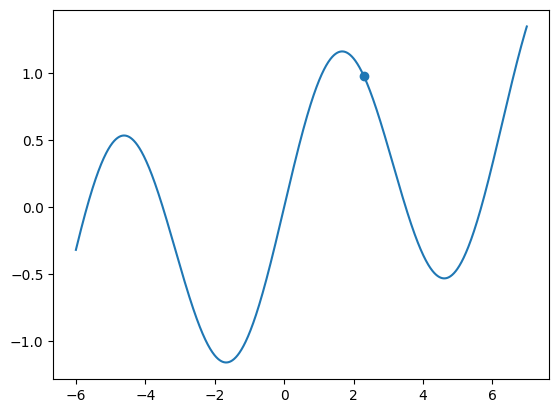

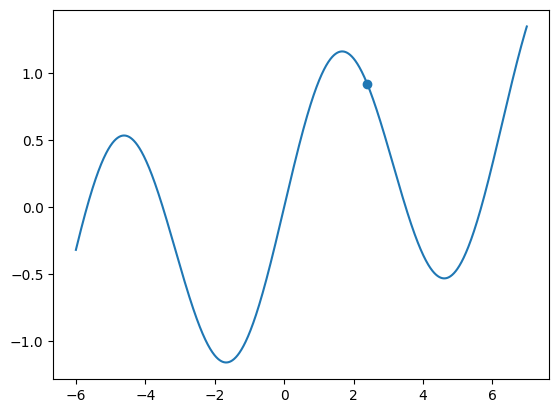

2.4


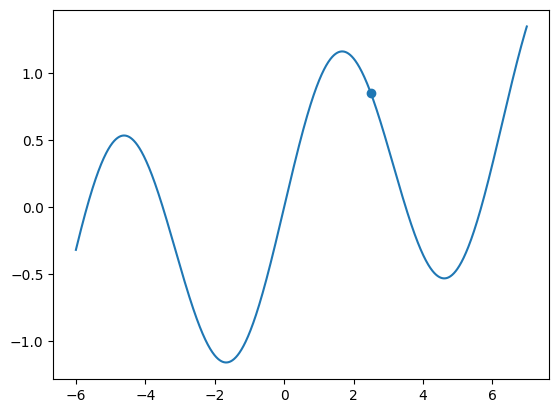

2.5


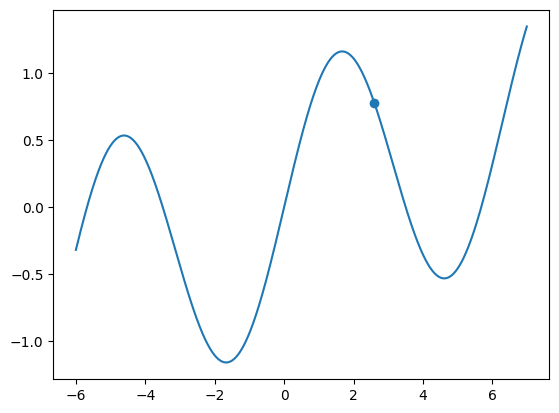

2.6


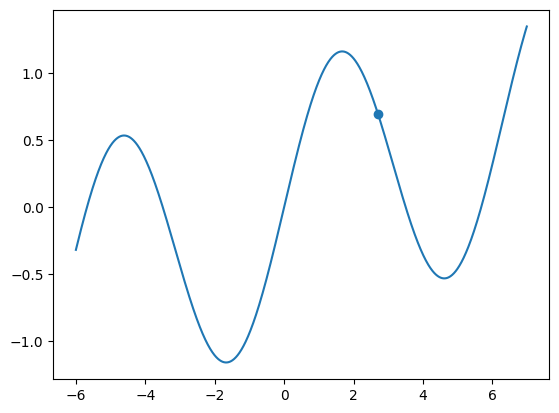

2.7


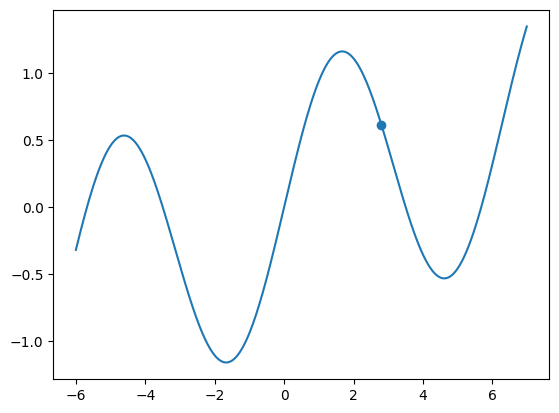

2.8000000000000003


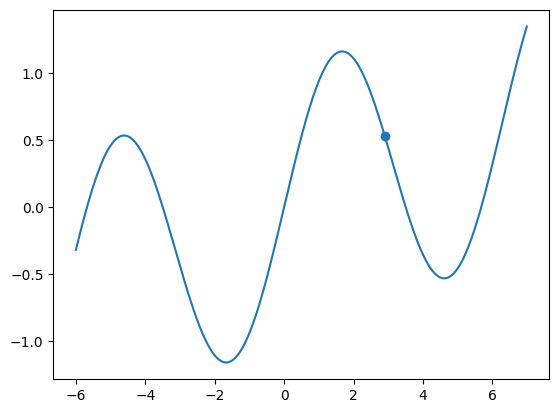

2.9000000000000004


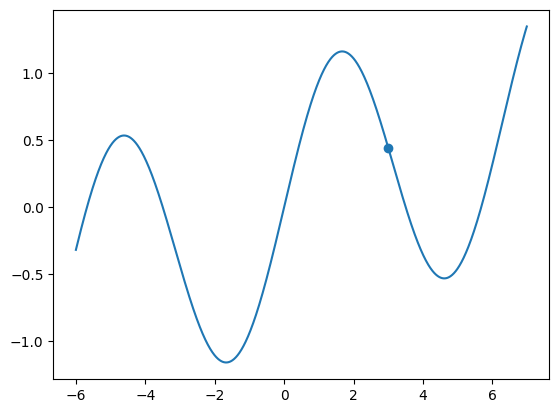

3.0000000000000004


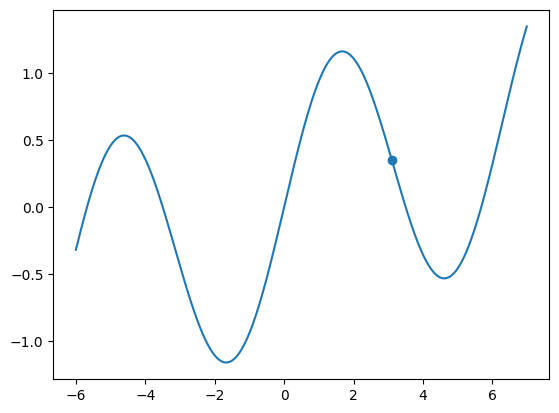

3.1000000000000005


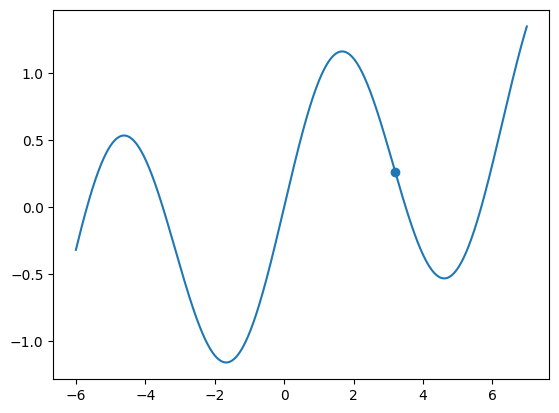

3.2000000000000006


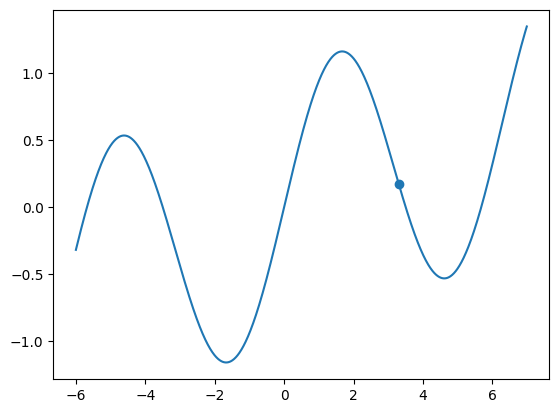

3.3000000000000007


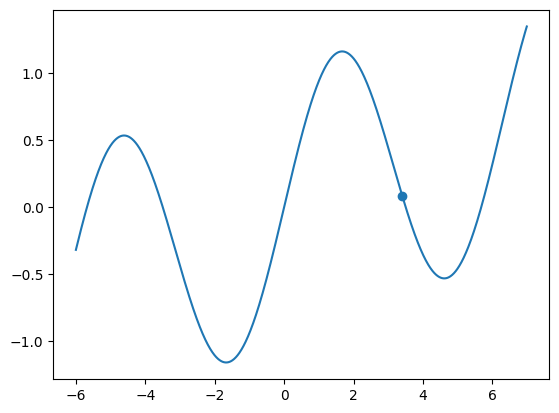

3.400000000000001


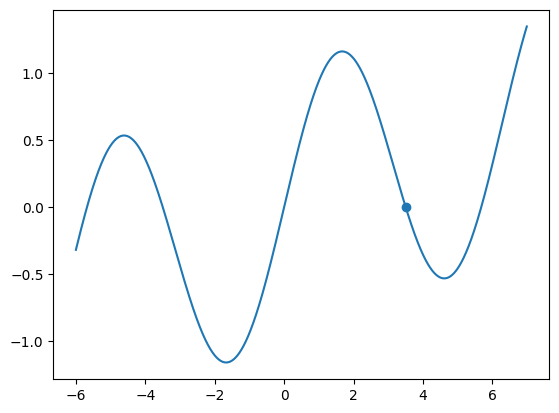

3.500000000000001


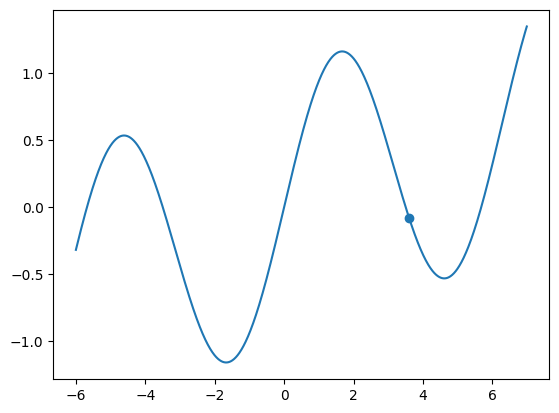

3.600000000000001


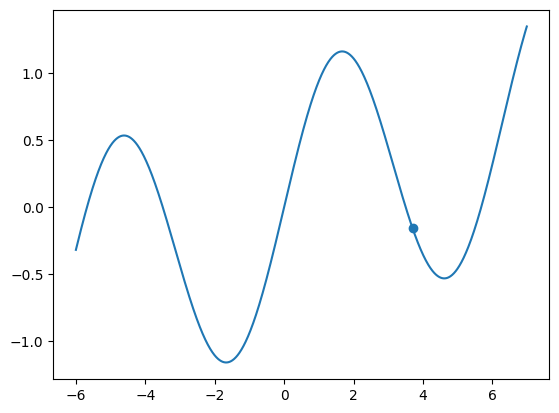

3.700000000000001


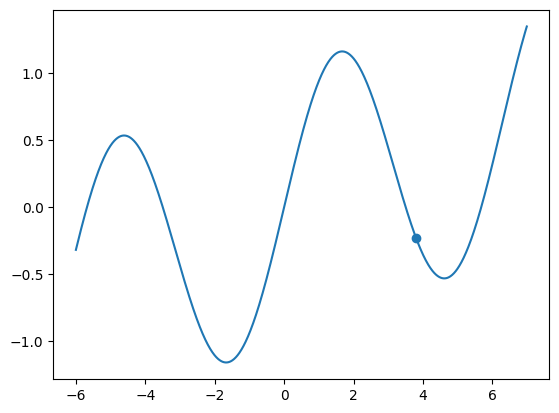

3.800000000000001


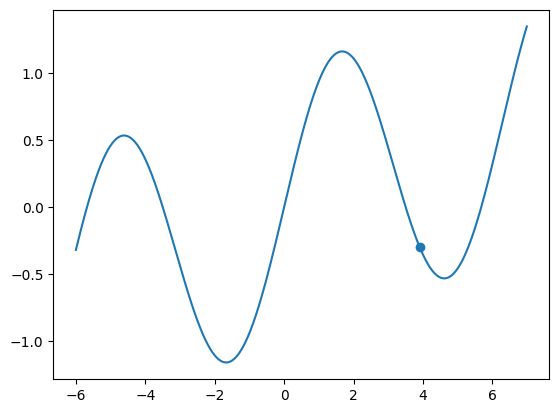

3.9000000000000012


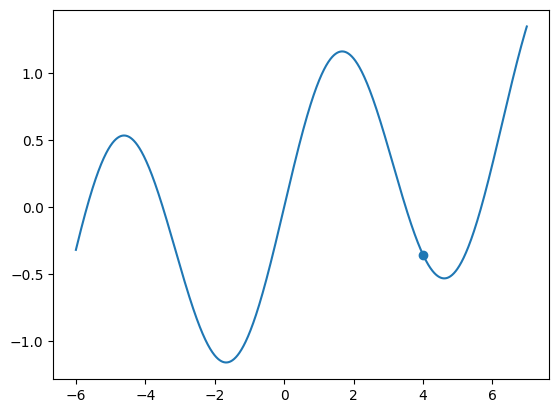

4.000000000000001


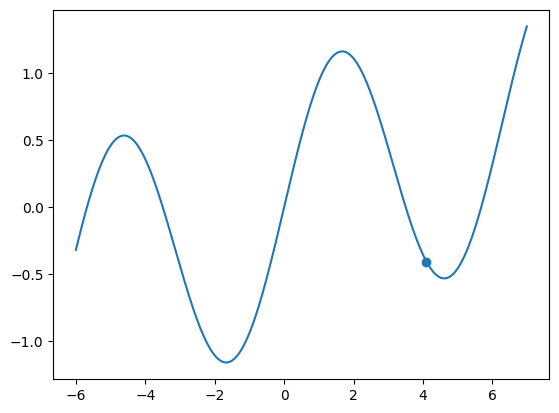

4.1000000000000005


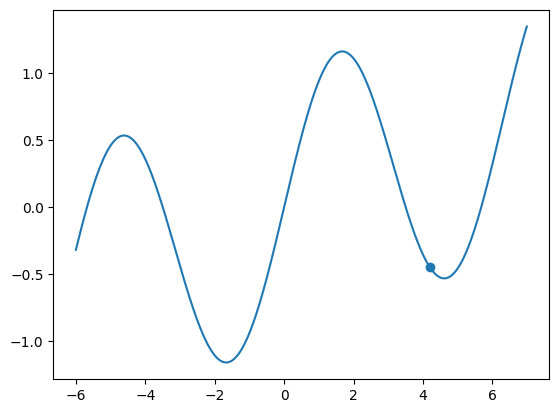

4.2


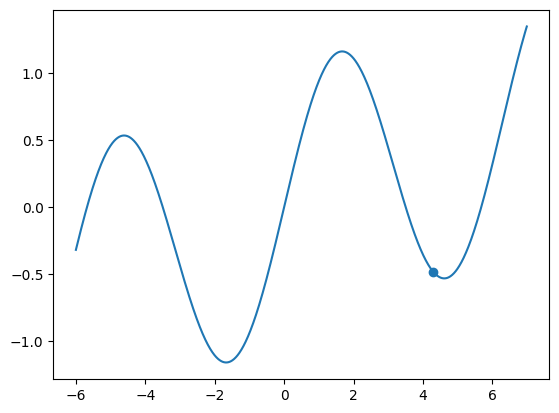

4.3


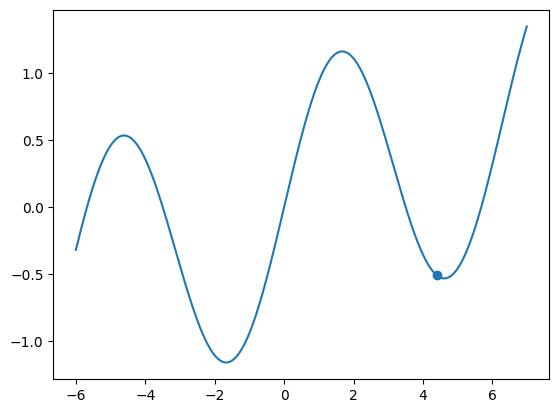

4.3999999999999995


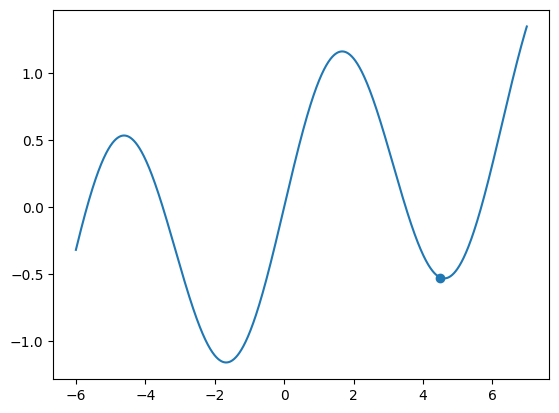

4.499999999999999


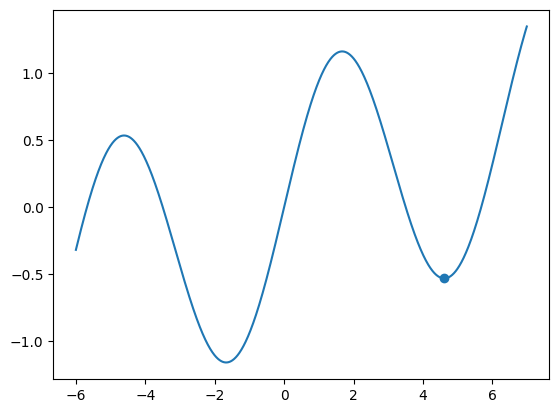

4.599999999999999


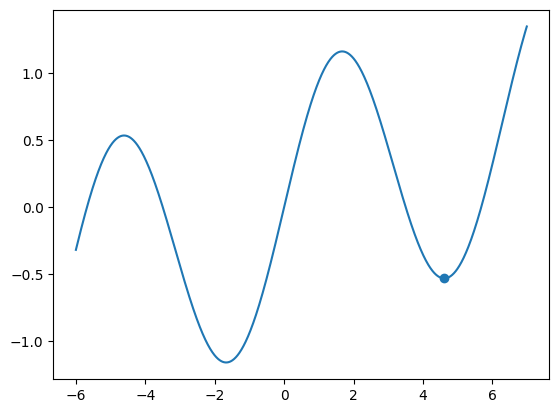

4.599999999999999


In [17]:
minimize(2.3, X, y, dy)


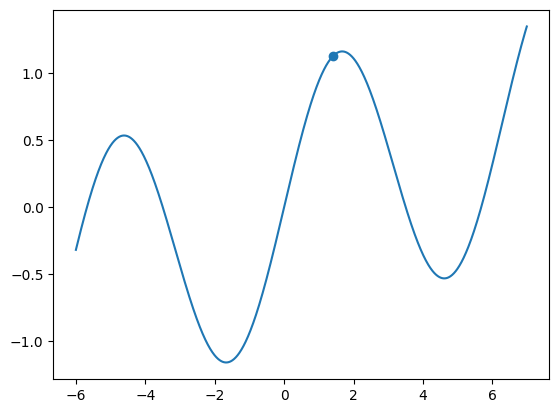

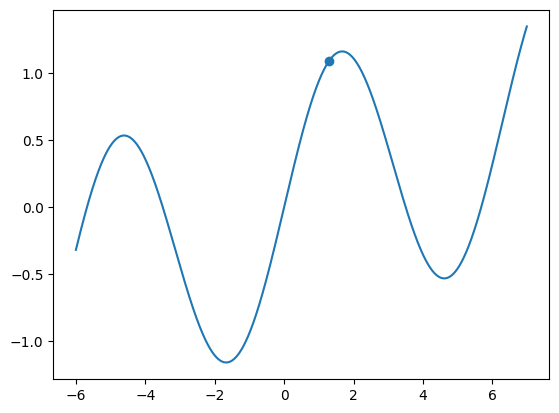

1.2999999999999998


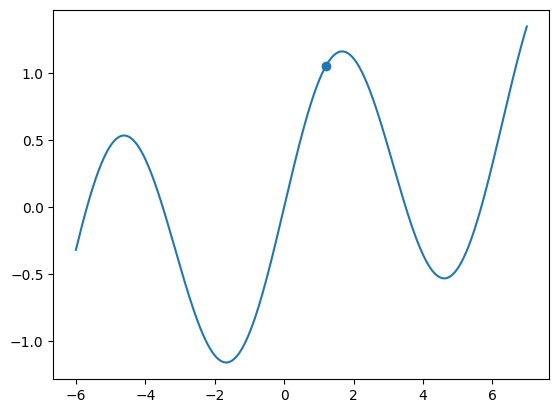

1.1999999999999997


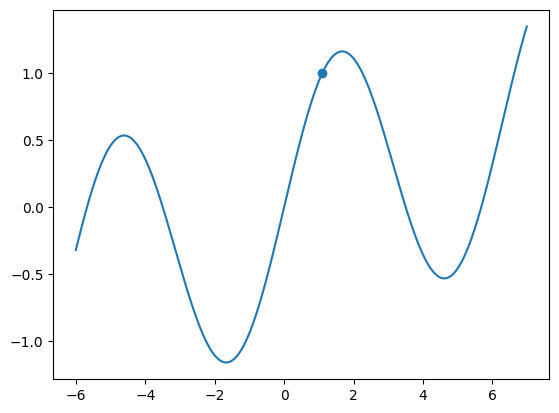

1.0999999999999996


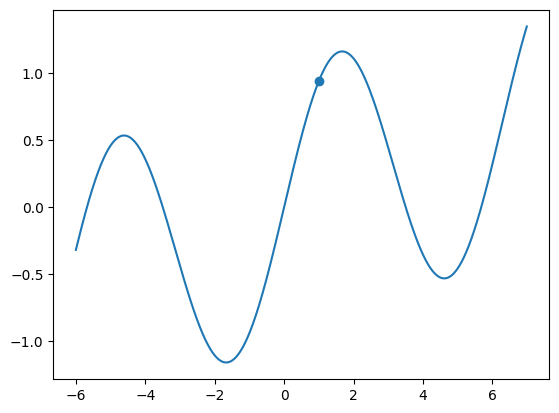

0.9999999999999997


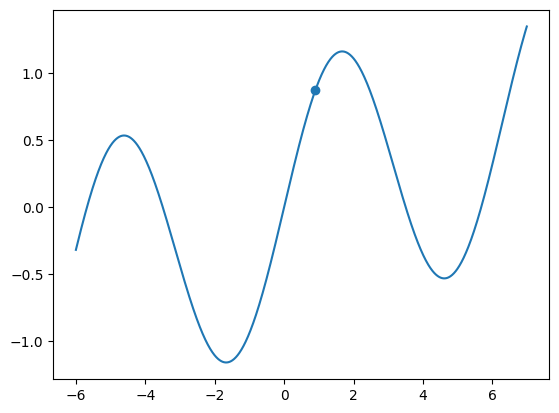

0.8999999999999997


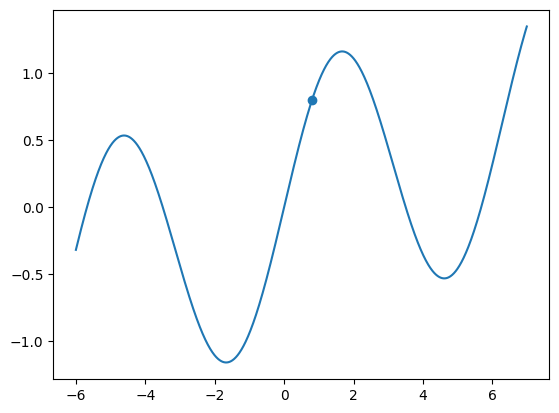

0.7999999999999997


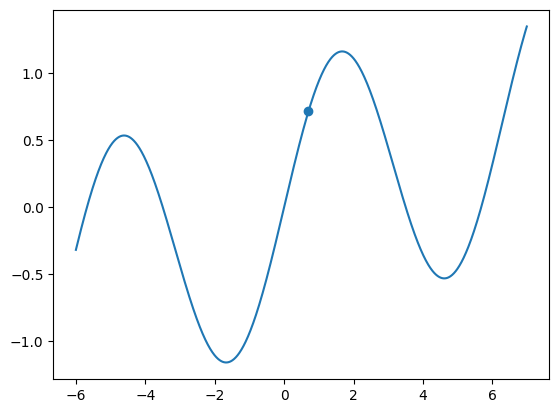

0.6999999999999997


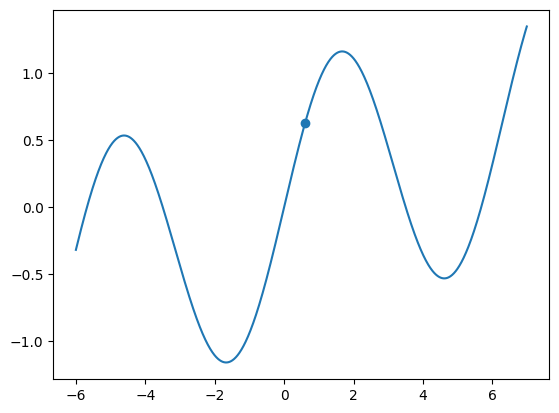

0.5999999999999998


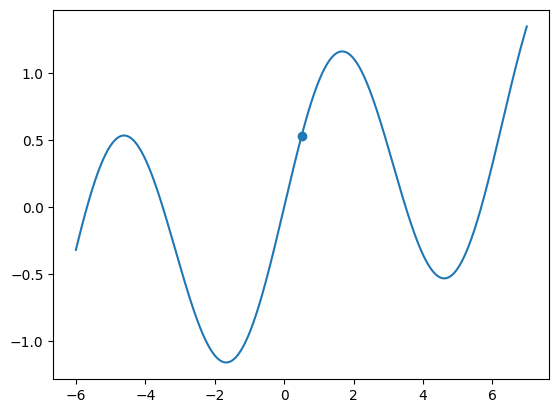

0.4999999999999998


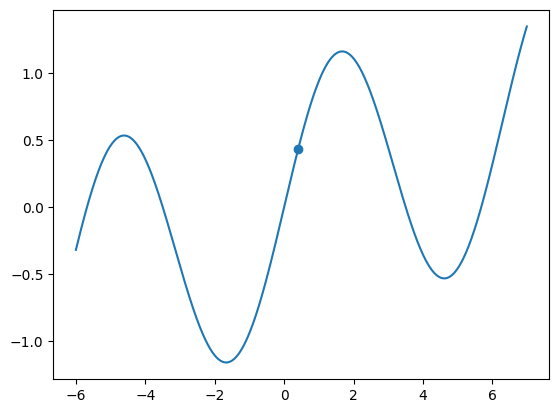

0.3999999999999998


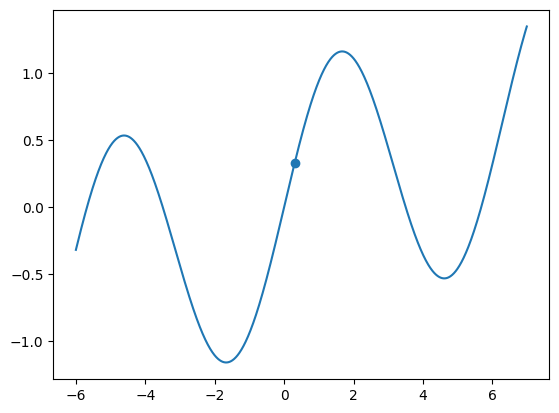

0.2999999999999998


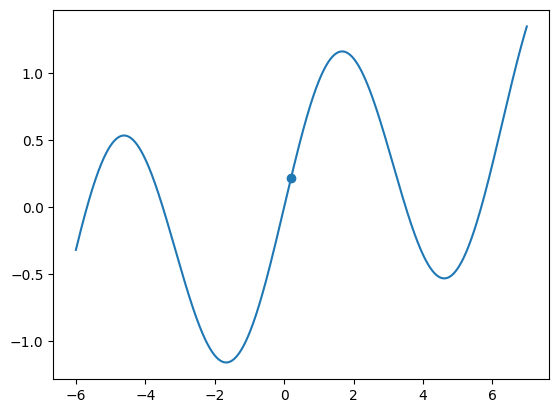

0.19999999999999982


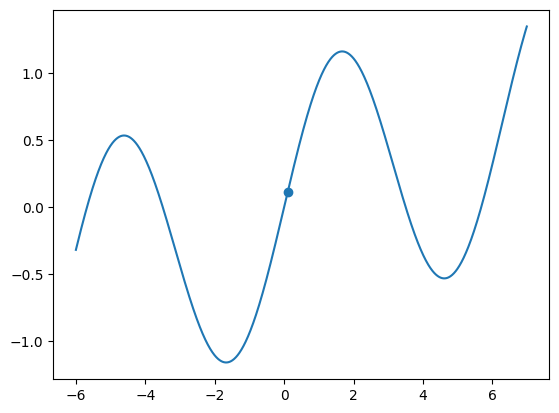

0.09999999999999981


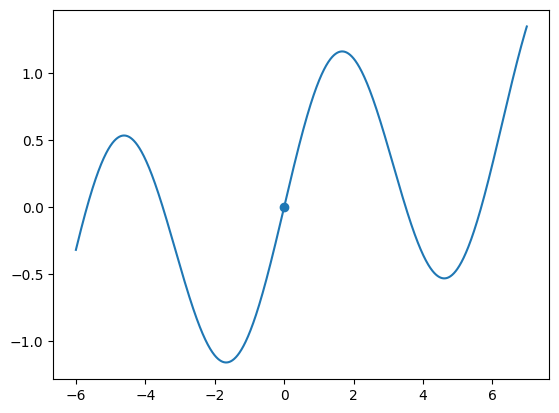

-1.942890293094024e-16


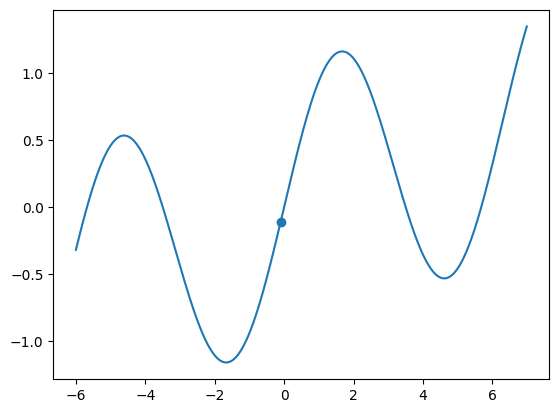

-0.1000000000000002


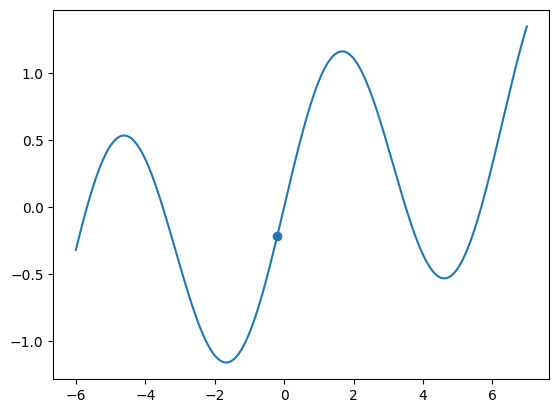

-0.2000000000000002


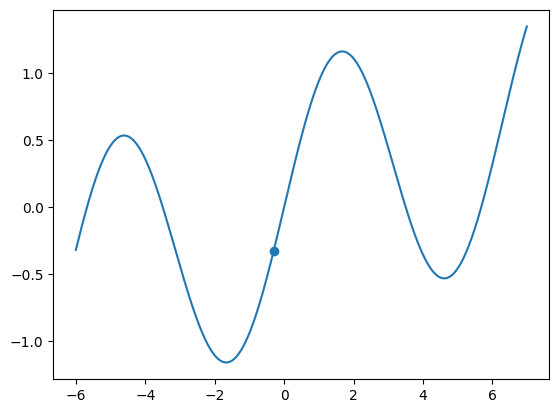

-0.3000000000000002


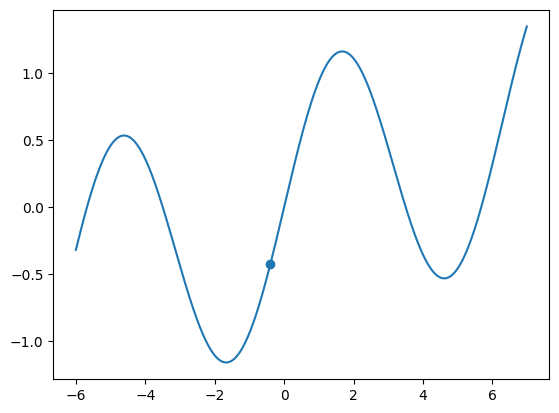

-0.40000000000000024


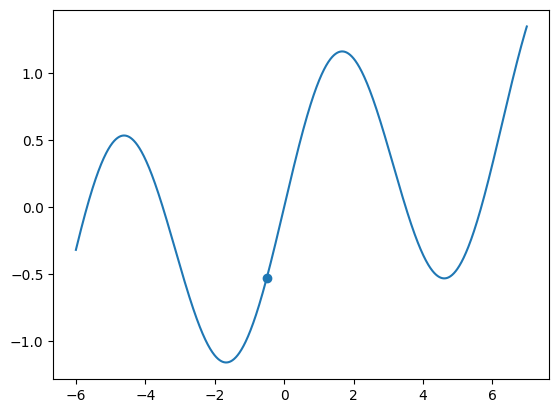

-0.5000000000000002


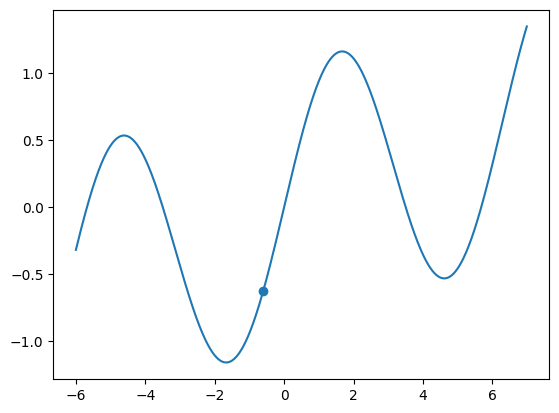

-0.6000000000000002


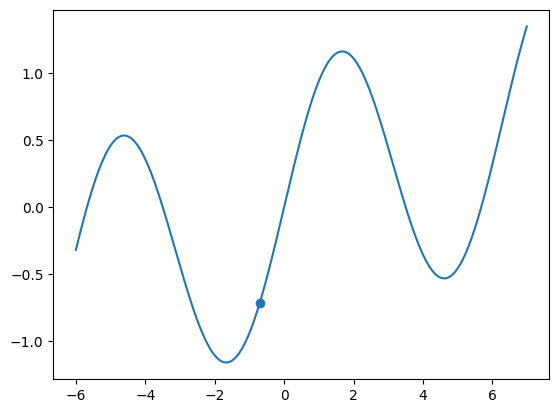

-0.7000000000000002


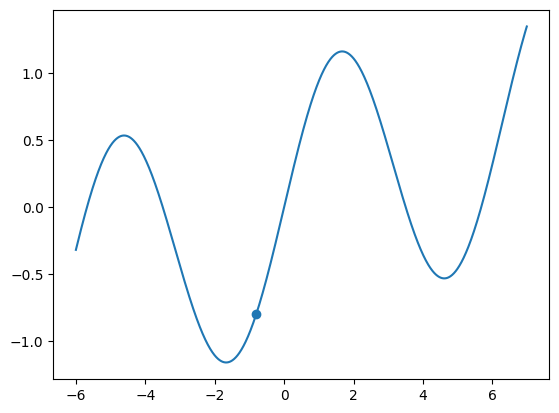

-0.8000000000000002


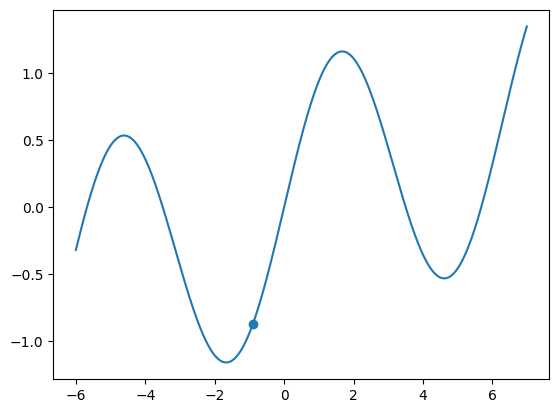

-0.9000000000000001


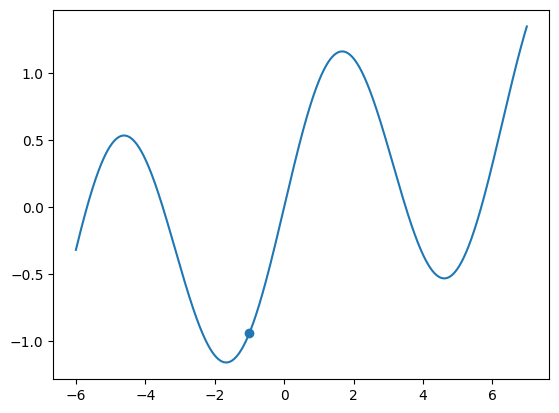

-1.0000000000000002


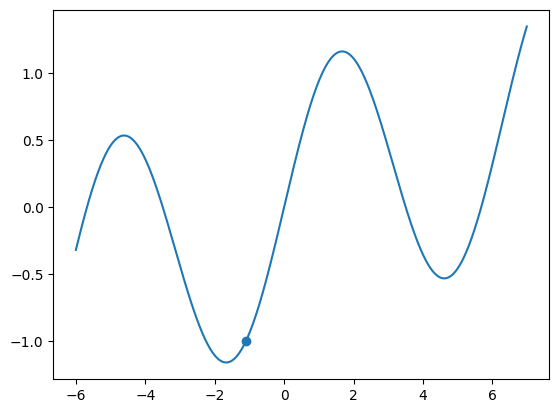

-1.1000000000000003


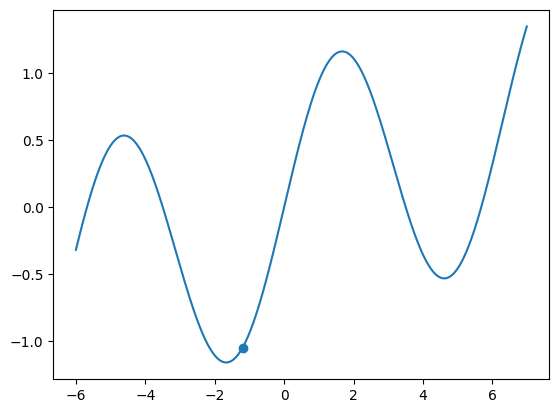

-1.2000000000000004


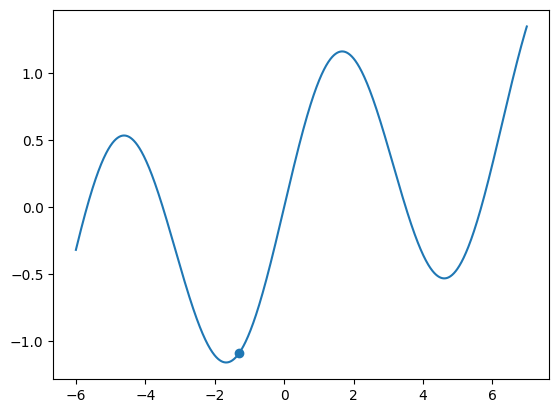

-1.3000000000000005


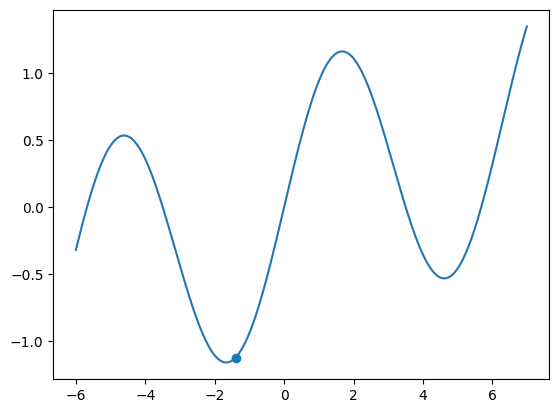

-1.4000000000000006


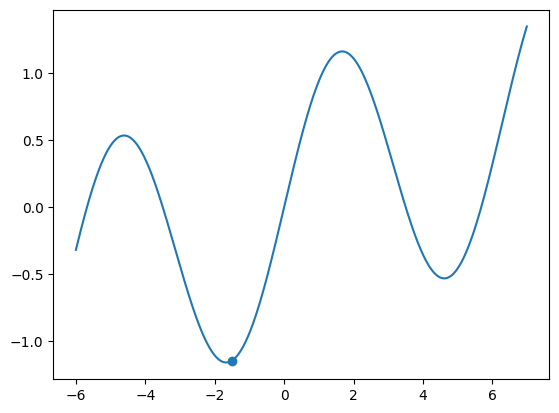

-1.5000000000000007


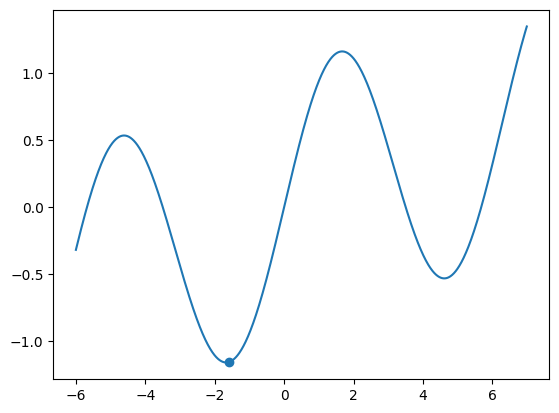

-1.6000000000000008


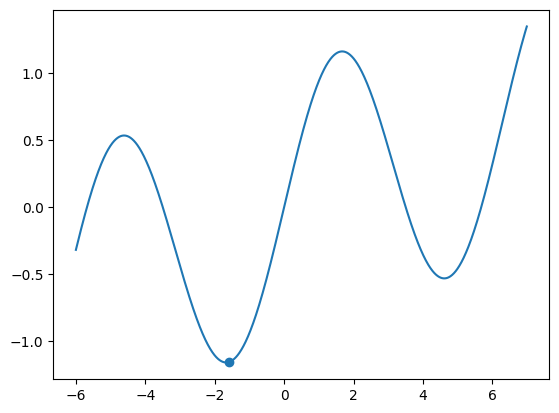

-1.6000000000000008


In [18]:
minimize(1.4, X, y, dy)